In [60]:
%matplotlib inline

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import cv2
import json
import math
import os
from tqdm import tqdm
import seaborn as sns
import mlflow

from sklearn.pipeline import Pipeline
from sklearn.preprocessing import FunctionTransformer, StandardScaler
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.decomposition import IncrementalPCA
from sklearn.utils import shuffle
from imgaug import augmenters as iaa
import pickle

from sklearn.model_selection import train_test_split, GridSearchCV, RandomizedSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
import joblib
from scipy.stats import uniform

In [4]:
from sklearn.utils import check_random_state

def set_seed(seed):
    np.random.seed(seed)
    check_random_state(seed)

set_seed(42)

# Dental Image Analysis Using Machine Learning

## Introduction

Dental health is a crucial component of overall well-being, with dental diseases affecting a significant portion of the global population. Early and accurate diagnosis is key to effective treatment and management. In recent years, advancements in digital imaging and machine learning have opened new avenues for enhancing diagnostic processes in dentistry. Among these, panoramic dental X-rays stand out as a comprehensive method for examining the entire dental arch.

However, the interpretation of these X-rays is not without challenges. It requires significant expertise and is subject to human error, with the potential for variability in diagnostic outcomes. Automating the analysis of dental X-rays through machine learning can aid in reducing these errors, standardizing interpretations, and providing support for dental professionals.

### The Problem

This project is centered on the challenge of interpreting panoramic dental X-rays through the development of a machine learning model that can autonomously identify and classify individual teeth. Currently, dental professionals perform tooth-by-tooth examinations, where it is necessary to focus on one tooth (or a specific section of the mouth) at a time. The goal is to automate the extraction of individual teeth from panoramic X-ray images, thereby streamlining the diagnostic process.

### Motivation

The motivation for this endeavor is twofold: to augment the efficiency of dental examinations and to integrate with dental information systems effectively. In practice, dentists could benefit from a system that automatically crops and displays an image of a specific tooth, facilitating a focused evaluation. This capability would be particularly advantageous in dental information systems where patient data is stored, allowing for quick retrieval and display of individual tooth images as needed.

Such a system would not only expedite the diagnostic process but also serve as a dynamic educational resource for dental students, providing a standardized approach to studying dental anatomy and pathologies through radiographic images.

Moreover, the application of traditional machine learning methods, as opposed to deep learning, is deliberate. It aligns with the educational objectives of the course and challenges us to investigate the efficacy of these methods in image analysis — a field often dominated by neural networks. Further advancements and complications of the task can be made using more advanced algorithms like deep learning models.

The successful completion of this project will result in a prototype that not only showcases the practical application of machine learning in dental imaging but also sets the stage for future advancements in automated dental diagnostics.


### Objective

- Train a machine learning model to recognize different types of teeth.


## Dataset Overview

So let's start by looking at the datasets, which we are going to work with. The following two datasets have the data that we need. 
As we embark on this project, it's essential to familiarize ourselves with the datasets that will form the foundation of our analysis. We have identified two datasets that provide the type of data we need for our machine learning model:

1. [Tufts Dental Database](https://www.kaggle.com/datasets/deepologylab/tufts-dental-database/data): This dataset is a comprehensive collection of dental X-ray images that have been annotated for various dental conditions. It offers a multimodal approach, combining panoramic X-rays with detailed annotations that can serve as a rich source for training our machine learning models. The important part for us are the annotated teeth segmentations.

2. [Teeth Segmentation on Dental X-Ray Images](https://www.kaggle.com/datasets/humansintheloop/teeth-segmentation-on-dental-x-ray-images/data): This dataset consists of nearly 600 segmented panoramic X-Rays, where again each tooth is segmented with a different class.

In the context of machine learning, these datasets present an opportunity to explore the capabilities of traditional algorithms in image analysis. While deep learning has been the dominant approach for image-related tasks, our project aims to investigate how well traditional machine learning techniques can perform in extracting meaningful information from complex image data like dental X-rays.

As we proceed, we will delve into the specifics of each dataset, understanding their structure, the nature of the annotations, and how we can best utilize them to build a working model.

## Data Preparation

### Tufts Dental Database

Let's start by looking at the first dataset - Tufts Dental Database. Both datasets are located in the `/data` folder of our project. The original Tufts Dataset consists of 6 major components:
- a. radiographs
- b. labeled masks
- c. eye tracker generated maps (gray and quantized)
- d. text information describing each radiograph
- e. teeth mask for each radiograph with labels
- f. maxillomandibular region-of-interest mask for each radiograph

We are interested only in the segmentation of the teeth so that we can use it to crop each individual tooth from the panoramic radiographs and use them for training our model. The original dataset structure looks like this:
  - **Expert**
    - 📂 mask
    - 📄 expert.json
    - 📂 gaze_map
      - 📂 gray
      - 📂 quantized
  - **Student**
    - 📂 mask
    - 📄 student.json
    - 📂 gaze_map
      - 📂 gray
      - 📂 quantized
  - **Radiographs**
  - **Segmentation**
    - 📂 teeth_mask
    - 📂 maxillomandibular
    - 📄 teeth_bbox.json
    - 📄 teeth_polygon.json
    
We don't need the Expert and Student labeled masks of the abnormalities and their gaze maps. So we are only going to download from the original source the Radiographs and the Segmentation folders. There the actual segmentation masks are located in the `Segmentation/teeth_mask` folder. The masks are in the form of binary `.png` images. But we also have two additional `.json` files which could give us additional information. Let's look at the `teeth_polygons.json`:

In [51]:
tufts_teeth_polygons = pd.read_json('./data/tufts/Segmentation/teeth_polygon.json')

In [52]:
tufts_teeth_polygons.head()

,Label,External ID
0,"{'objects': [{'title': '1', 'bounding box': [3...",797.jpg
1,"{'objects': [{'title': '6', 'bounding box': [2...",909.jpg
2,"{'objects': [{'title': '2', 'bounding box': [3...",135.jpg
3,"{'objects': [{'title': '2', 'bounding box': [3...",307.jpg
4,"{'objects': [{'title': '2', 'bounding box': [3...",763.jpg


At a first glance in this file we have data about each radiograph separately in the form of a JSON object. Let's look at what information we have in it:

In [53]:
tufts_teeth_polygons['Label'][0], tufts_teeth_polygons['External ID'][0]

({'objects': [{'title': '1',
    'bounding box': [314, 476, 376, 533],
    'polygons': [[[517, 380],
      [518, 379],
      [519, 380],
      [519, 381],
      [518, 382],
      [515, 382],
      [514, 381],
      [515, 380]],
     [[512, 380]],
     [[527, 379], [526, 380], [526, 383], [527, 383]],
     [[518, 379], [519, 378], [520, 379], [519, 380]],
     [[515, 378], [516, 377], [517, 377], [518, 378], [517, 379], [516, 379]],
     [[518, 377], [519, 376], [520, 377], [519, 378]],
     [[513, 376], [514, 375], [515, 376], [515, 377], [514, 378], [513, 377]],
     [[488, 375]],
     [[499, 374], [500, 373], [501, 373], [502, 374], [501, 375], [500, 375]],
     [[497, 374], [498, 373], [499, 374], [498, 375]],
     [[535, 373], [535, 374], [534, 375], [535, 374]],
     [[529, 373],
      [530, 372],
      [531, 372],
      [532, 373],
      [532, 374],
      [531, 375],
      [530, 375],
      [529, 374]],
     [[527, 373], [528, 372], [529, 373], [528, 374]],
     [[495, 373], [496

It looks like we have an array of objects for each radiograph. These objects are most likely the each tooth's polygon coordinates, bounding boxes and class. We can see that by plotting the bounding boxes on top of the image and looking at the classes. Let's do that:

In [54]:
tufts_image_index = 0
tufts_image_filename = tufts_teeth_polygons['External ID'][tufts_image_index]
tufts_image_classes = [obj["title"] for obj in tufts_teeth_polygons['Label'][tufts_image_index]['objects']]
tufts_image_bounding_boxes = [obj["bounding box"] for obj in tufts_teeth_polygons['Label'][tufts_image_index]['objects']]

In [55]:
TUFTS_RAW_DATASET_DIR = "./data/tufts/Radiographs"

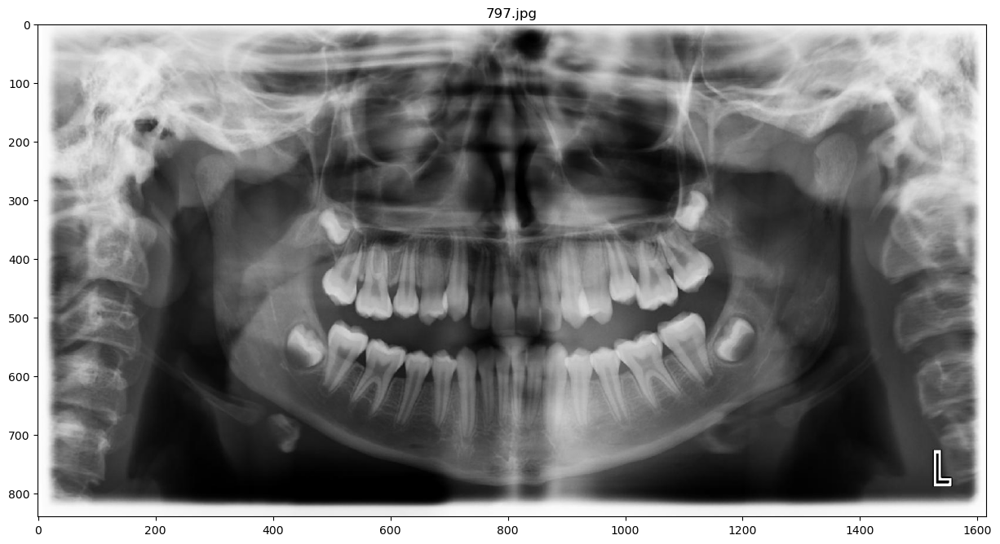

In [56]:
tufts_image_data = cv2.imread(f"{TUFTS_RAW_DATASET_DIR}/{tufts_image_filename}")
plt.figure(figsize=(15, 15))
plt.imshow(tufts_image_data, cmap="gray")
plt.title(tufts_image_filename)
plt.show()

We can see the image is being loaded and displayed correctly. Now let's look at the bounding boxes and the classes:

In [8]:
tufts_image_bounding_boxes[0], tufts_image_classes[0]

([314, 476, 376, 533], '1')

The first bounding box is for the left top-most tooth. We can see that from the image the first coordinate is for the top left corner of the bounding box and the second coordinate is for the bottom right corner of the bounding box. The class is 1 which means it's the first tooth. We can also see that the first number corresponds to the coordinate of the y-axis and the second one - on the x-axis. Based on that information let's try and plot all of the bounding boxes for this image.

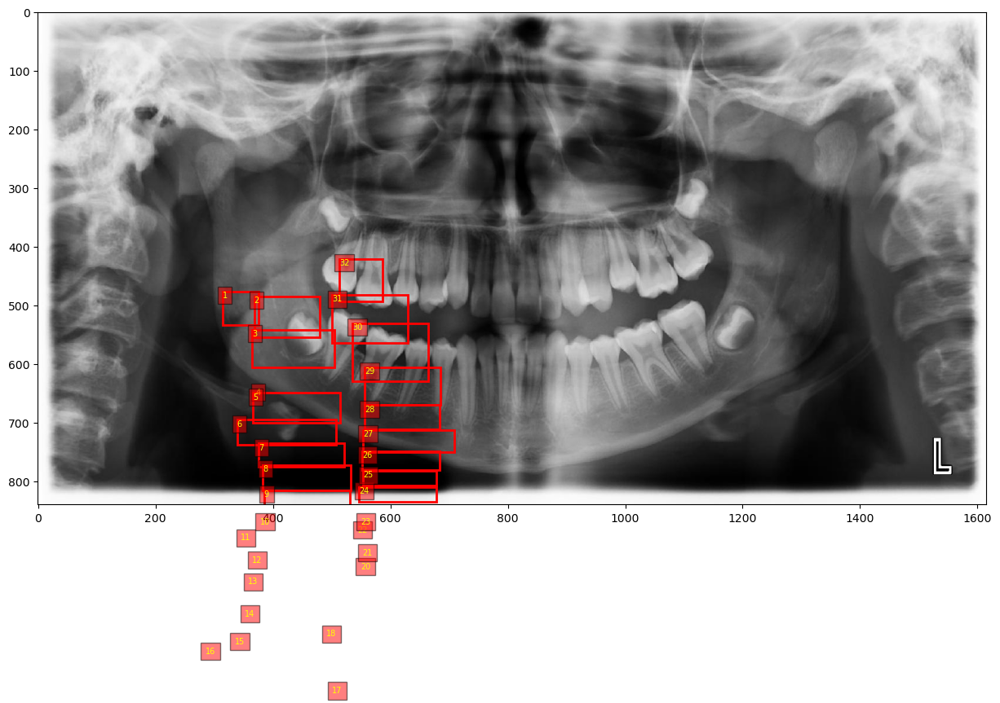

In [57]:
def plot_image_with_bboxes(image, bboxes, labels, figsize=(10, 10)):
    """
    Plots an image with bounding boxes and labels.

    Parameters:
    - image: The image to plot.
    - bboxes: A list of bounding boxes, where each bounding box is a tuple (x1, y1, x2, y2).
    - labels: A list of labels for each bounding box.
    - figsize: A tuple representing the size of the figure.
    """
    # Create a figure and a set of subplots with a custom size
    fig, ax = plt.subplots(figsize=figsize)

    # Display the image
    ax.imshow(image, cmap="gray")

    # Draw the bounding boxes and labels
    for bbox, label in zip(bboxes, labels):
        # Create a Rectangle patch
        width = bbox[2] - bbox[0]
        height = bbox[3] - bbox[1]
        rect = patches.Rectangle((bbox[0], bbox[1]), width, height, linewidth=2, edgecolor='r', facecolor='none')

        # Add the patch to the Axes
        ax.add_patch(rect)

        # Add the text label
        ax.text(bbox[0], bbox[1], label, color='yellow', fontsize=7, verticalalignment='top', bbox=dict(facecolor='red', alpha=0.5))

    # Show the plot
    plt.show()
    
plot_image_with_bboxes(tufts_image_data, tufts_image_bounding_boxes, tufts_image_classes, figsize=(15, 15))

The bounding boxes are rendering, but as we can see, the coordinates of x and y are switched. Let's fix that:

In [10]:
def fix_tufts_bbox(bbox):
		"""
		Fixes a bounding box from the Tufts dataset by swapping the x and y coordinates.

		Parameters:
		- bbox: The bounding box to fix.

		Returns:
		A fixed bounding box.
		"""
		return (bbox[1], bbox[0], bbox[3], bbox[2])

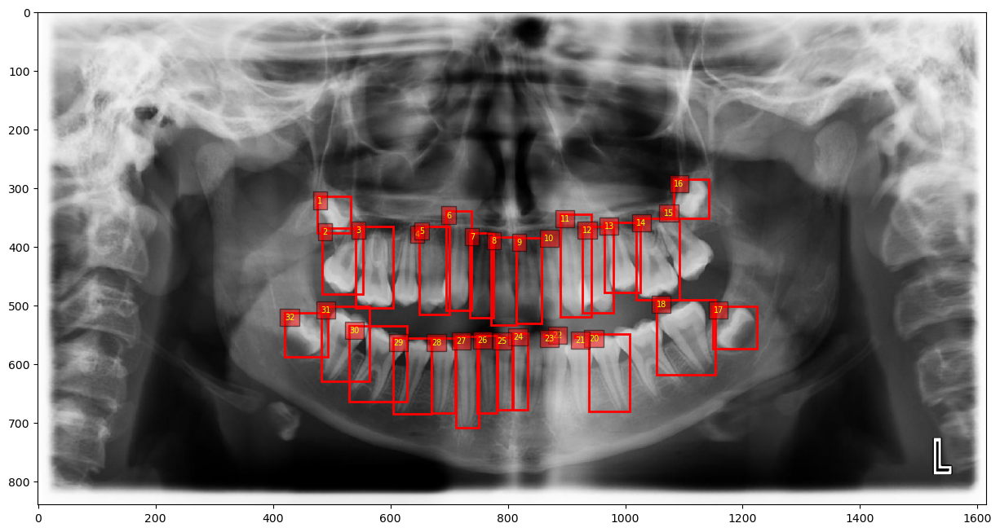

In [11]:
tufts_image_bounding_boxes = list(map(fix_tufts_bbox, tufts_image_bounding_boxes))
plot_image_with_bboxes(tufts_image_data, tufts_image_bounding_boxes, tufts_image_classes, figsize=(15, 15))

Most of the teeth are correctly annotated. But some as we can see - are not. More specifically the teeth with numbers: `4, 21, 22, 23` are present as labels on the correct spots, but their bounding boxes are very tiny. And for tooth with number `19` we don't even have a label. Let's look at the corresponding bounding boxes:

In [12]:
# get image class indexes for classes 4, 21, 22, 23
image_class_indexes = [i for i, x in enumerate(tufts_image_classes) if x in ["4", "21", "22", "23"]]
image_class_indexes
# get bounding boxes for classes 4, 21, 22, 23
list(zip([tufts_image_bounding_boxes[i] for i in image_class_indexes], [tufts_image_classes[i] for i in image_class_indexes]))

[((641, 371, 642, 372), '4'),
 ((915, 552, 919, 555), '21'),
 ((876, 544, 877, 545), '22'),
 ((862, 550, 866, 553), '23')]

As we can see the bounding boxes for the teeth with numbers `4, 21, 22, 23` are in fact very small. Let's look at the polygon shapes for these teeth, maybe they are more accurate:

In [13]:
tufts_teeth_polygons['Label'][tufts_image_index]['objects'][tufts_image_index]["polygons"]

[[[517, 380],
  [518, 379],
  [519, 380],
  [519, 381],
  [518, 382],
  [515, 382],
  [514, 381],
  [515, 380]],
 [[512, 380]],
 [[527, 379], [526, 380], [526, 383], [527, 383]],
 [[518, 379], [519, 378], [520, 379], [519, 380]],
 [[515, 378], [516, 377], [517, 377], [518, 378], [517, 379], [516, 379]],
 [[518, 377], [519, 376], [520, 377], [519, 378]],
 [[513, 376], [514, 375], [515, 376], [515, 377], [514, 378], [513, 377]],
 [[488, 375]],
 [[499, 374], [500, 373], [501, 373], [502, 374], [501, 375], [500, 375]],
 [[497, 374], [498, 373], [499, 374], [498, 375]],
 [[535, 373], [535, 374], [534, 375], [535, 374]],
 [[529, 373],
  [530, 372],
  [531, 372],
  [532, 373],
  [532, 374],
  [531, 375],
  [530, 375],
  [529, 374]],
 [[527, 373], [528, 372], [529, 373], [528, 374]],
 [[495, 373], [496, 372], [497, 373], [496, 374]],
 [[490, 373], [491, 372], [492, 373], [491, 374]],
 [[526, 372], [527, 371], [528, 372], [527, 373]],
 [[493, 372], [494, 371], [495, 372], [495, 373], [494, 374]

We can see that each of these polygons are just multiple lists of points with `x, y` coordinates. Let's try and plot them on top of the image:

In [14]:
def sort_points_in_polygon(polygon):
	# Calculate the centroid of the polygon
	centroid = [sum(point[0] for point in polygon) / len(polygon), sum(point[1] for point in polygon) / len(polygon)]
	
	# Sort the points by their angle from the centroid
	sorted_polygon = sorted(polygon, key=lambda point: math.atan2(point[1] - centroid[1], point[0] - centroid[0]))
	
	return sorted_polygon

We need a small helper function to sort the points so that we can plot them correctly.

In [15]:
def plot_image_with_polygons(image, polygons, labels, figsize=(10, 10)):
		"""
		Plots an image with polygons and labels.

		Parameters:
		- image: The image to plot.
		- polygons: A liss of polygons (one polygon corresponds to one tooth), where each polygon is a list of (x, y) coordinates.
		- labels: A list of labels for each group of polygons.
		- figsize: A tuple representing the size of the figure.
		"""
		# Create a figure and a set of subplots with a custom size
		_, ax = plt.subplots(figsize=figsize)

		# Display the image
		ax.imshow(image, cmap="gray")
		# Draw the polygons and labels
		i = 0
		for polygon in polygons:
				poly = patches.Polygon(sort_points_in_polygon(polygon), linewidth=2, fc="blue")

				# Add the patch to the Axes
				ax.add_patch(poly)
				ax.text(polygon[0][0], polygon[0][1], labels[i], color='yellow', fontsize=7, verticalalignment='top', bbox=dict(facecolor='red', alpha=0.5))
				i += 1
		# Show the plot
		plt.show()

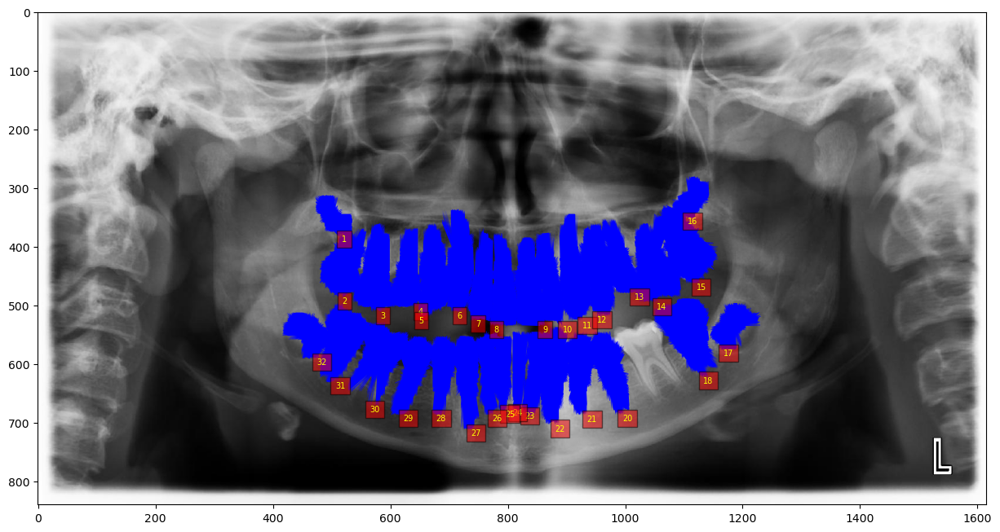

In [16]:
def ravel_list(list):
  return [item for sublist in list for item in sublist]

tufts_image_polygons = [obj["polygons"] for obj in tufts_teeth_polygons['Label'][tufts_image_index]['objects']]
plot_image_with_polygons(tufts_image_data, list(map(ravel_list, tufts_image_polygons)), tufts_image_classes, figsize=(15, 15))

Here it is obvious that the polygons are more accurate than the bounding boxes for the teeth with numbers `4, 21, 22, 23`. But the tooth with number `19` is still missing. Let's look at the bounding boxes for the rest of the data and see if that is a persistent problem. We will do that by looking at how many bounding boxes have a very small area - less than 100 pixels.

In [153]:
def bbox_area(x1, y1, x2, y2):
	"""
	Calculates the area of a bounding box.

	Parameters:
	- x1: The x coordinate of the top left corner of the bounding box.
	- y1: The y coordinate of the top left corner of the bounding box.
 	- x2: The x coordinate of the bottom right corner of the bounding box.
  	- y2: The y coordinate of the bottom right corner of the bounding box.

	Returns:
	- The area of the bounding box.
	"""
	return (x2 - x1) * (y2 - y1)

bbox_area = np.vectorize(bbox_area)

In [117]:
tufts_all_bboxes = np.array([tooth["bounding box"] for tufts_teeth_polygons in tufts_teeth_polygons['Label'] for tooth in tufts_teeth_polygons["objects"]])
tufts_all_bboxes_areas = bbox_area(*tufts_all_bboxes.T)

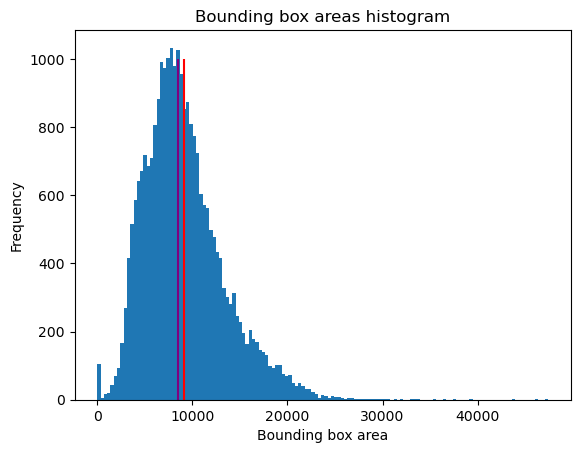

In [158]:
plt.hist(tufts_all_bboxes_areas, bins="fd")
plt.vlines(np.mean(tufts_all_bboxes_areas), 0, 1000, color="red")
plt.vlines(np.median(tufts_all_bboxes_areas), 0, 1000, color="purple")
plt.title("Bounding box areas histogram")
plt.xlabel("Bounding box area")
plt.ylabel("Frequency")
plt.show()

As we can see there are a lot of bounding boxes with a very small area and in general the distribution of the bounding boxes is right-skewed with a long tail. We can see that also there are a lot of outliers, close to 0, so it would be useful to see just jow many of them are there.

In [159]:
# Group the values in ranges
def bboxes_report(bboxes_areas):
		ranges = [(0, 100), (100, 500), (500, 1000), (1000, 5000), (5000, 10000), (10000, 50000), (50000, 100000), (100000, np.inf)]
		counts = [((low, high), ((bboxes_areas >= low) & (bboxes_areas < high)).sum()) for (low, high) in ranges]

		# Print the report
		print("Report of bboxes_areas:")
		for (low, high), count in counts:
			print(f"  {low} <= area < {high}: {count}")

		print("The mean area is:", bboxes_areas.mean())
		print("The median area is:", np.median(bboxes_areas))
		print("The minimum area is:", bboxes_areas.min())
		print("The maximum area is:", bboxes_areas.max())

bboxes_report(tufts_all_bboxes_areas)

Report of bboxes_areas:
  0 <= area < 100: 101
  100 <= area < 500: 4
  500 <= area < 1000: 16
  1000 <= area < 5000: 3809
  5000 <= area < 10000: 12881
  10000 <= area < 50000: 9194
  50000 <= area < 100000: 0
  100000 <= area < inf: 0
The mean area is: 9148.218342626418
The median area is: 8515.0
The minimum area is: 1
The maximum area is: 47422


There are 101 bounding boxes with areas less than 100. These are likely to be outliers because their areas are substantially smaller than the rest of the data (the mean of the data). Given the context of bounding boxes, such small areas may indicate errors in the annotation process or misclassification, as they may not realistically represent the objects of interest within the images. Most of the other data falls within the expected ranges for bounding boxes, with the majority of the data having areas between 5000 and 10000 pixels, which is okay. But for the outliers with less than 1000 pixels area (though some of them might not be outliers), we can try to extract their correct bounding boxes from the polygon data.

In [137]:
def extract_bounding_box(polygons):
    # Initialize the min and max coordinates with the first point of the first polygon
    min_x, min_y = polygons[0][0]
    max_x, max_y = polygons[0][0]

    # Iterate over each point in each polygon
    for polygon in polygons:
        for point in polygon:
            x, y = point
            min_x = min(min_x, x)
            min_y = min(min_y, y)
            max_x = max(max_x, x)
            max_y = max(max_y, y)

    return np.array([min_x, min_y, max_x, max_y])

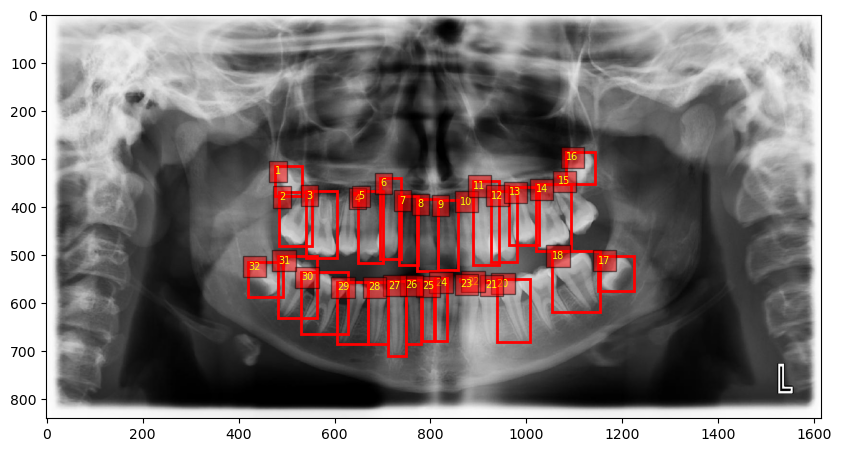

In [138]:
plot_image_with_bboxes(tufts_image_data, tufts_image_bounding_boxes, tufts_image_classes)

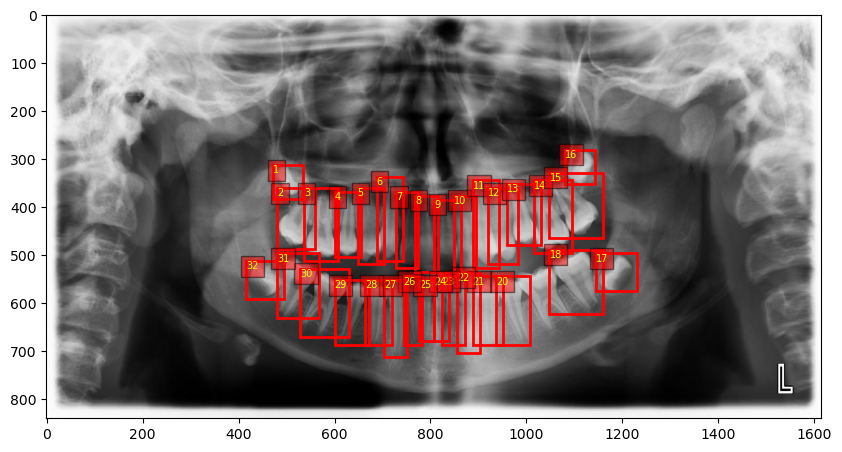

In [139]:
plot_image_with_bboxes(tufts_image_data, [extract_bounding_box(image_poly) for image_poly in tufts_image_polygons], tufts_image_classes)

As we can see in this case the polygon data successfully helped us to extract the correct bounding boxes for the teeth with numbers `4, 21, 22, 23`. We can do that for all the teeth which have an area of less than a 1000 pixels just to be sure, that we are not missing something.

In [143]:
filenames, classes, x1s, y1s, x2s, y2s = [], [], [], [], [], []
for filename, objects in zip(tufts_teeth_polygons["External ID"], tufts_teeth_polygons["Label"]):
	for tooth in objects["objects"]:
		filenames.append(filename)
		classes.append(tooth["title"])
		if(bbox_area(*tooth["bounding box"]) > 1000):
			x1, y1, x2, y2 = fix_tufts_bbox(tooth["bounding box"])
		else:
			x1, y1, x2, y2 = extract_bounding_box(tooth["polygons"])
		x1s.append(x1)
		y1s.append(y1)
		x2s.append(x2)
		y2s.append(y2)

In [144]:
tufts_bboxes_df = pd.DataFrame({
	"filename": filenames,
	"class": classes,
	"x1": x1s,
	"y1": y1s,
	"x2": x2s,
	"y2": y2s
})

We can save this dataframe into a new file, so that later it would be easier for us to load it without having to preprocess the data again.

In [203]:
tufts_bboxes_df.to_csv("./data/tufts/Segmentation/ann_bboxes.csv", index=False)

In [161]:
tufts_bboxes_areas_df = tufts_bboxes_df.assign(area=tufts_bboxes_df.apply(lambda row: bbox_area(row["x1"], row["y1"], row["x2"], row["y2"]), axis=1))

bboxes_report(tufts_bboxes_areas_df["area"].values)

Report of bboxes_areas:
  0 <= area < 100: 0
  100 <= area < 500: 0
  500 <= area < 1000: 4
  1000 <= area < 5000: 3837
  5000 <= area < 10000: 12930
  10000 <= area < 50000: 9233
  50000 <= area < 100000: 0
  100000 <= area < inf: 1
The mean area is: 9199
The median area is: 8532
The minimum area is: 529
The maximum area is: 353410


We can see now that we have extracted successfully the correct bounding boxes for all the teeth with area less than a 1000. And still there are 4 left with area less than 1000 and one which suddenly is larger than 100000. Let's look at those.

In [27]:
tufts_bboxes_small = tufts_bboxes_areas_df[tufts_bboxes_areas_df.area < 1200]
tufts_bboxes_small

,filename,class,x1,y1,x2,y2,area
420,569.jpg,9,824,368,847,391,529
4848,289.jpg,23,848,595,861,674,1027
12275,580.jpg,G,866,409,899,444,1155
12829,395.jpg,Q,736,576,757,630,1134
15280,367.jpg,D,741,481,766,525,1100
15649,704.jpg,13,986,372,1014,409,1036
16355,63.jpg,20,920,576,951,607,961
16745,846.jpg,G,876,481,898,528,1034
18431,271.jpg,G,868,412,897,452,1160
20270,853.jpg,16,1088,360,1119,391,961


Now we can try to display them:

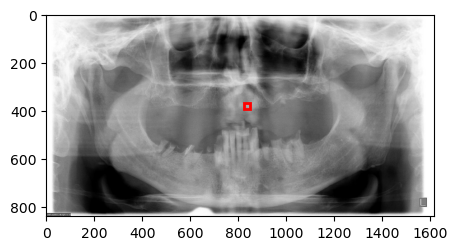

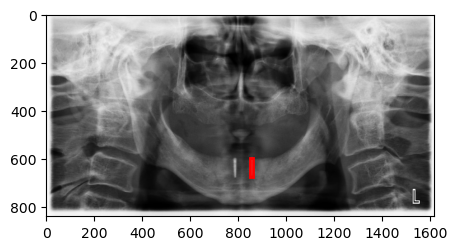

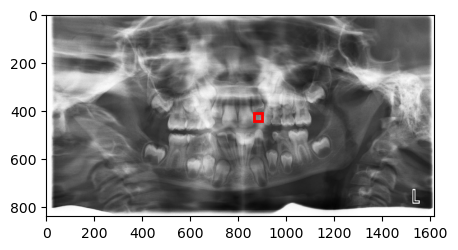

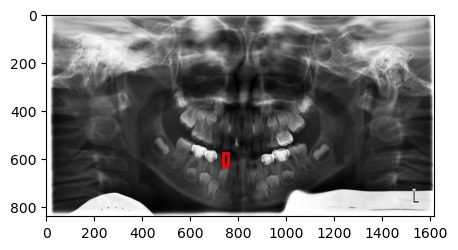

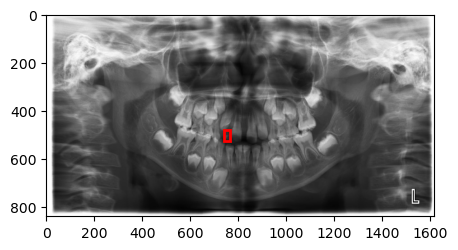

...

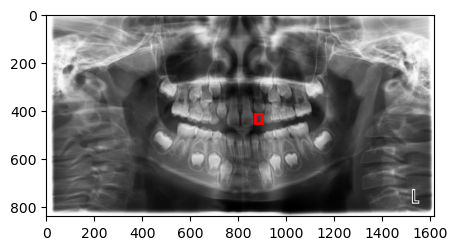

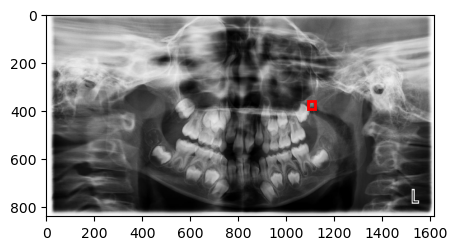

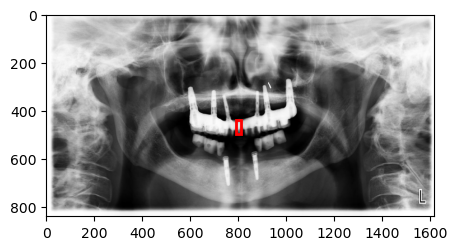

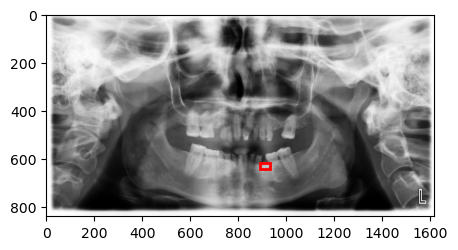

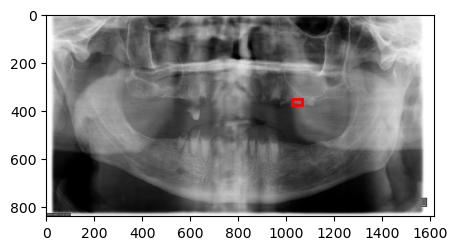

In [28]:
# display the images with small bounding boxes
for filename in tufts_bboxes_small.filename.unique():
		image_data = cv2.imread("{TUFTS_DATASET_DIR}/{filename}")
		image_bboxes = tufts_bboxes_small[tufts_bboxes_small.filename == filename][["x1", "y1", "x2", "y2"]].values
		image_classes = tufts_bboxes_small[tufts_bboxes_small.filename == filename]["class"].values
		plot_image_with_bboxes(image_data, image_bboxes, [""], figsize=(5, 5))

We can see that those objects are most likely outliers, but we cannot be sure for all of them, because some do actually appear to be teeth. So for now we will just leave them in the data and maybe try to deal with them later. 
Having this dataframe `tufts_bboxes_df` is all the data for each annotated tooth from the tufts dataset. We can then later use it to crop each tooth from the radiographs and use them for training our model.

### Teeth Segmentation on dental X-ray images Dataset


Now let's look at the second dataset - Teeth Segmentation on dental X-ray images Dataset. This dataset consists of nearly 600 segmented panoramic X-Rays, where again each tooth is annotated with a different class. The original dataset structure looks like this:
- 📂 d2
	- 📂 img
	- 📂 ann
	- 📂 masks_human
	- 📂 masks_machine
- 📄 meta.json
- 📄 obj_class_to_machine_color.json

The `d2` folder contains the actual data, which we are going to work with. We are mainly interested in the two folders - `img` and `ann`. The `img` folder contains the actual images and the `ann` folder contains the annotations for each image. The annotations are in the form of `.json` files. Let's look at the first annotation file:

In [107]:
HITL_RAW_DATASET_DIR = "./data/humans_in_the_loop/d2/img"
HITL_ANNOTATION_DIR = "./data/humans_in_the_loop/d2/ann"

In [29]:

# Load the json contents of the 1.jpg.json file
with open(f'{HITL_ANNOTATION_DIR}/1.jpg.json') as f:
	data = json.load(f)

# Print the json contents
print(json.dumps(data, indent=4))


{
    "description": "",
    "tags": [],
    "size": {
        "height": 1024,
        "width": 2041
    },
    "objects": [
        {
            "id": 1166088923,
            "classId": 11382893,
            "description": "",
            "geometryType": "polygon",
            "labelerLogin": "GhazalehHITL",
            "createdAt": "2023-01-24T09:03:34.164Z",
            "updatedAt": "2023-01-24T09:03:34.164Z",
            "tags": [],
            "classTitle": "8",
            "points": {
                "exterior": [
                    [
                        963,
                        587
                    ],
                    [
                        964,
                        569
                    ],
                    [
                        968,
                        546
                    ],
                    [
                        971,
                        524
                    ],
                    [
                        974,
              

As we can see our object of interest is the `objects` key. It contains an array of objects, each of which is a tooth. Let's load the teeth of the first image annotation into the dataframe `teeth_df`:

In [30]:
# Read the "objects" key from the JSON file and put it into a DataFrame
hitl_filename = "1.jpg"
hitl_image = cv2.imread(f"{HITL_RAW_DATASET_DIR}/{hitl_filename}")
hitl_sample_annotations = pd.read_json(f"{HITL_ANNOTATION_DIR}/{hitl_filename}.json", orient="index").T["objects"].apply(pd.Series).stack().reset_index(level=1, drop=True).apply(pd.Series)

In [31]:
hitl_sample_annotations

,id,classId,description,geometryType,labelerLogin,createdAt,updatedAt,tags,classTitle,points
0,1166088923,11382893,,polygon,GhazalehHITL,2023-01-24T09:03:34.164Z,2023-01-24T09:03:34.164Z,[],8,"{'exterior': [[963, 587], [964, 569], [968, 54..."
0,1166088922,11382894,,polygon,GhazalehHITL,2023-01-24T09:03:34.164Z,2023-01-24T09:03:34.164Z,[],9,"{'exterior': [[1054, 586], [1054, 570], [1055,..."
0,1166088921,11382895,,polygon,GhazalehHITL,2023-01-24T09:03:34.164Z,2023-03-17T17:40:13.284Z,[],10,"{'exterior': [[1136, 576], [1141, 556], [1145,..."
0,1166088929,11382901,,polygon,GhazalehHITL,2023-01-24T09:03:34.164Z,2023-01-24T09:03:34.164Z,[],11,"{'exterior': [[1209, 611], [1193, 598], [1187,..."
0,1166088928,11382892,,polygon,GhazalehHITL,2023-01-24T09:03:34.164Z,2023-01-24T09:03:34.164Z,[],7,"{'exterior': [[898, 580], [894, 574], [895, 56..."
0,1166088927,11382891,,polygon,GhazalehHITL,2023-01-24T09:03:34.164Z,2023-01-24T09:03:34.164Z,[],6,"{'exterior': [[816, 569], [819, 556], [823, 53..."
0,1166088926,11382889,,polygon,GhazalehHITL,2023-01-24T09:03:34.164Z,2023-01-24T09:03:34.164Z,[],4,"{'exterior': [[649, 546], [641, 543], [638, 53..."
0,1166088909,11382887,,polygon,GhazalehHITL,2023-01-24T09:03:34.164Z,2023-01-24T09:03:34.164Z,[],2,"{'exterior': [[527, 504], [524, 490], [528, 47..."
0,1166088910,11382882,,polygon,GhazalehHITL,2023-01-24T09:03:34.164Z,2023-03-17T17:40:06.147Z,[],15,"{'exterior': [[1432, 576], [1424, 563], [1414,..."
0,1166088911,11382883,,polygon,GhazalehHITL,2023-01-24T09:03:34.164Z,2023-03-17T17:39:58.819Z,[],16,"{'exterior': [[1540, 585], [1531, 580], [1522,..."


We are interested only in the exterior points of the polygon so let's extract them:

In [32]:
hitl_sample_annotations.points = hitl_sample_annotations.points.apply(lambda points: points["exterior"])

Now we can plot those polygons on the image.

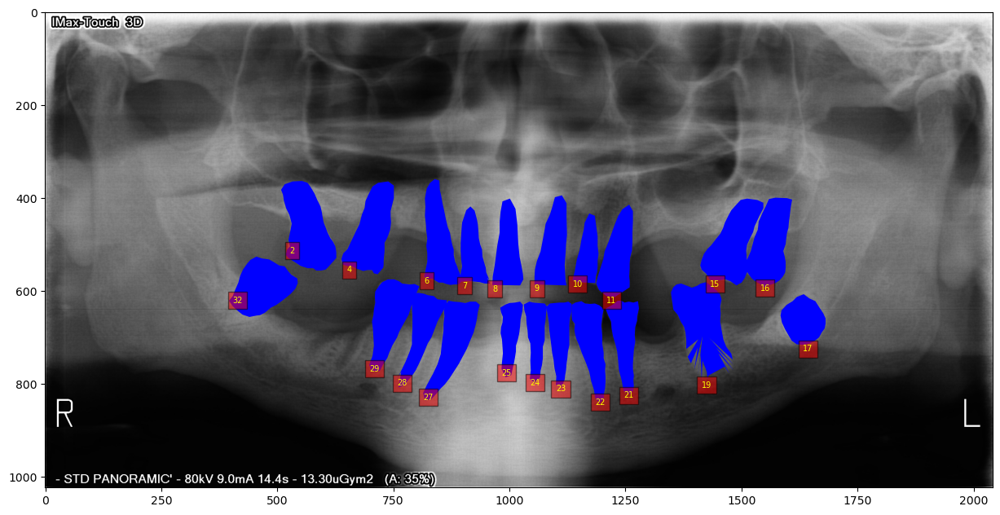

In [33]:
plot_image_with_polygons(hitl_image, hitl_sample_annotations["points"].values, hitl_sample_annotations["classTitle"].values, figsize=(15, 15))

In this dataset again we can use the polygons' shapes to extract bounding boxes for the teeth, which we can later use to crop out our training data. But first let's read the whole dataset into a dataframe.

In [34]:
hitl_raw_annotation_df = pd.DataFrame()

ann_files = os.listdir(HITL_ANNOTATION_DIR)

# Loop through each file
for file in ann_files:
    # Check if the file is a JSON file
    if file.endswith(".json"):
        # Read the JSON file into a DataFrame
        current_ann_dataframe = pd.read_json(f"{HITL_ANNOTATION_DIR}/{file}", orient="index").T["objects"].apply(pd.Series).stack().reset_index(level=1, drop=True).apply(pd.Series)
        
        # Add a column to the dataframe with a filename and remove the ".json" extension
        if len(current_ann_dataframe) > 0:
            current_ann_dataframe["filename"] = file.replace(".json", "")
        
        # Concatenate the DataFrame with the all_data DataFrame
        hitl_raw_annotation_df = pd.concat([hitl_raw_annotation_df, current_ann_dataframe])
        
# Reset the index and drop the extra column
hitl_raw_annotation_df = hitl_raw_annotation_df.reset_index(drop=True)

In [35]:
hitl_raw_annotation_df

,id,classId,description,geometryType,labelerLogin,createdAt,updatedAt,tags,classTitle,points,filename,0
0,1.166089e+09,11382893.0,,polygon,GhazalehHITL,2023-01-24T09:03:34.164Z,2023-01-24T09:03:34.164Z,[],8,"{'exterior': [[963, 587], [964, 569], [968, 54...",1.jpg,NaN
1,1.166089e+09,11382894.0,,polygon,GhazalehHITL,2023-01-24T09:03:34.164Z,2023-01-24T09:03:34.164Z,[],9,"{'exterior': [[1054, 586], [1054, 570], [1055,...",1.jpg,NaN
2,1.166089e+09,11382895.0,,polygon,GhazalehHITL,2023-01-24T09:03:34.164Z,2023-03-17T17:40:13.284Z,[],10,"{'exterior': [[1136, 576], [1141, 556], [1145,...",1.jpg,NaN
3,1.166089e+09,11382901.0,,polygon,GhazalehHITL,2023-01-24T09:03:34.164Z,2023-01-24T09:03:34.164Z,[],11,"{'exterior': [[1209, 611], [1193, 598], [1187,...",1.jpg,NaN
4,1.166089e+09,11382892.0,,polygon,GhazalehHITL,2023-01-24T09:03:34.164Z,2023-01-24T09:03:34.164Z,[],7,"{'exterior': [[898, 580], [894, 574], [895, 56...",1.jpg,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...
15313,1.166091e+09,11382910.0,,polygon,GhazalehHITL,2023-01-24T09:04:49.934Z,2023-01-24T09:04:49.934Z,[],27,"{'exterior': [[839, 828], [861, 787], [876, 73...",99.jpg,NaN
15314,1.166091e+09,11382897.0,,polygon,GhazalehHITL,2023-01-24T09:04:49.934Z,2023-01-24T09:04:49.934Z,[],28,"{'exterior': [[754, 824], [786, 776], [810, 73...",99.jpg,NaN
15315,1.166091e+09,11382898.0,,polygon,GhazalehHITL,2023-01-24T09:04:49.934Z,2023-01-24T09:04:49.934Z,[],29,"{'exterior': [[659, 822], [692, 782], [710, 73...",99.jpg,NaN
15316,1.166091e+09,11382900.0,,polygon,GhazalehHITL,2023-01-24T09:04:49.934Z,2023-01-24T09:04:49.934Z,[],31,"{'exterior': [[495, 745], [554, 719], [596, 68...",99.jpg,NaN


In [36]:
hitl_raw_annotation_df[0].unique()

array([nan])

We can see that our dataframe has an additional column `0`, which we can remove, as it is filled only with `NaN`.

In [37]:
hitl_raw_annotation_df = hitl_raw_annotation_df.drop(0, axis=1)

Now it would be useful to save this dataset object in a `.csv` file, so that we can load it later without having to parse through all the files. We can do that with the following code:

In [38]:
hitl_raw_annotation_df.to_csv("./data/humans_in_the_loop/d2/ann_raw.csv", index=False)

Now let's take a closer look into the points column. We can see that we have the option for the polygon to contain both `exterior` and `interior` points. For us the most useful in this case are the exterior points, because they represent the actual shape of the tooth. Let's split the points into two columns - `exterior` and `interior`:

In [39]:
hitl_raw_annotation_df[['exterior', 'interior']] = hitl_raw_annotation_df['points'].apply(lambda x: pd.Series([x['exterior'], x['interior']]))
hitl_raw_annotation_df.interior.apply(str).unique()

array(['[]',
       '[[[1159, 896], [1103, 809], [1110.3530678148547, 802.6060279870829], [1116.6663078579118, 797.1162540365985], [1145.7312859884837, 778.1477927063339]]]'],
      dtype=object)

We can see that we have only one polygon which has interior points. Let's try to visualize it:

In [40]:
polygon_with_internal_points = hitl_raw_annotation_df[hitl_raw_annotation_df.interior.apply(len) != 0]
polygon_with_internal_points

,id,classId,description,geometryType,labelerLogin,createdAt,updatedAt,tags,classTitle,points,filename,exterior,interior
2772,1.166094e+09,11382905.0,,polygon,GhazalehHITL,2023-01-24T09:04:52.968Z,2023-03-18T11:41:21.775Z,[],21,"{'exterior': [[1087, 801], [1087, 787], [1086,...",203.jpg,"[[1087, 801], [1087, 787], [1086, 766], [1083,...","[[[1159, 896], [1103, 809], [1110.353067814854..."


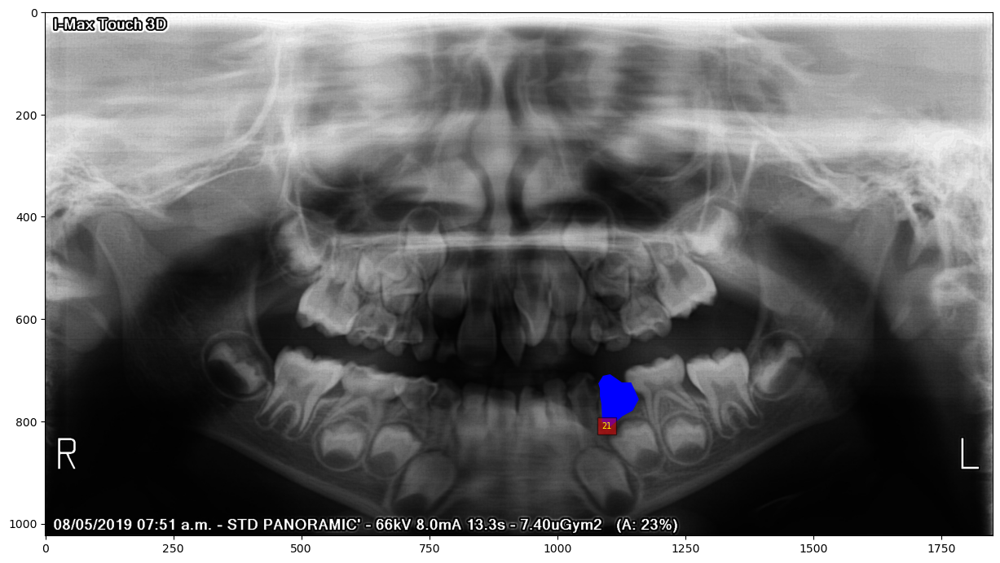

In [41]:
plot_image_with_polygons(cv2.imread(f'{HITL_RAW_DATASET_DIR}/{polygon_with_internal_points.filename.iat[0]}'), polygon_with_internal_points["exterior"].values, polygon_with_internal_points["classTitle"].values, figsize=(15, 15))

For our purposes the external points are enough, so we can remove the `interior` column entirely.

In [42]:
hitl_polygon_annotation_df = hitl_raw_annotation_df.drop("interior", axis=1)
hitl_polygon_annotation_df = hitl_polygon_annotation_df.drop("points", axis=1)
hitl_polygon_annotation_df = hitl_polygon_annotation_df.rename(columns={"exterior": "polygon"})

In [43]:
hitl_polygon_annotation_df

,id,classId,description,geometryType,labelerLogin,createdAt,updatedAt,tags,classTitle,filename,polygon
0,1.166089e+09,11382893.0,,polygon,GhazalehHITL,2023-01-24T09:03:34.164Z,2023-01-24T09:03:34.164Z,[],8,1.jpg,"[[963, 587], [964, 569], [968, 546], [971, 524..."
1,1.166089e+09,11382894.0,,polygon,GhazalehHITL,2023-01-24T09:03:34.164Z,2023-01-24T09:03:34.164Z,[],9,1.jpg,"[[1054, 586], [1054, 570], [1055, 553], [1059,..."
2,1.166089e+09,11382895.0,,polygon,GhazalehHITL,2023-01-24T09:03:34.164Z,2023-03-17T17:40:13.284Z,[],10,1.jpg,"[[1136, 576], [1141, 556], [1145, 533], [1151,..."
3,1.166089e+09,11382901.0,,polygon,GhazalehHITL,2023-01-24T09:03:34.164Z,2023-01-24T09:03:34.164Z,[],11,1.jpg,"[[1209, 611], [1193, 598], [1187, 584], [1190,..."
4,1.166089e+09,11382892.0,,polygon,GhazalehHITL,2023-01-24T09:03:34.164Z,2023-01-24T09:03:34.164Z,[],7,1.jpg,"[[898, 580], [894, 574], [895, 562], [898, 547..."
...,...,...,...,...,...,...,...,...,...,...,...
15313,1.166091e+09,11382910.0,,polygon,GhazalehHITL,2023-01-24T09:04:49.934Z,2023-01-24T09:04:49.934Z,[],27,99.jpg,"[[839, 828], [861, 787], [876, 730], [900, 695..."
15314,1.166091e+09,11382897.0,,polygon,GhazalehHITL,2023-01-24T09:04:49.934Z,2023-01-24T09:04:49.934Z,[],28,99.jpg,"[[754, 824], [786, 776], [810, 734], [824, 684..."
15315,1.166091e+09,11382898.0,,polygon,GhazalehHITL,2023-01-24T09:04:49.934Z,2023-01-24T09:04:49.934Z,[],29,99.jpg,"[[659, 822], [692, 782], [710, 730], [734, 684..."
15316,1.166091e+09,11382900.0,,polygon,GhazalehHITL,2023-01-24T09:04:49.934Z,2023-01-24T09:04:49.934Z,[],31,99.jpg,"[[495, 745], [554, 719], [596, 684], [627, 660..."


Using the polygons we can extract the bounding boxes for each tooth like we did with the previous dataset. Let's do that:

In [146]:
hitl_bbox_annotation_df = hitl_polygon_annotation_df.assign(bbox=hitl_polygon_annotation_df.polygon.apply(lambda polygon: extract_bounding_box([polygon])))
hitl_bbox_annotation_df = hitl_bbox_annotation_df.drop("polygon", axis=1)
hitl_bbox_annotation_df

,id,classId,description,geometryType,labelerLogin,createdAt,updatedAt,tags,classTitle,filename,bbox
0,1.166089e+09,11382893.0,,polygon,GhazalehHITL,2023-01-24T09:03:34.164Z,2023-01-24T09:03:34.164Z,[],8,1.jpg,"[963, 401, 1030, 588]"
1,1.166089e+09,11382894.0,,polygon,GhazalehHITL,2023-01-24T09:03:34.164Z,2023-01-24T09:03:34.164Z,[],9,1.jpg,"[1054, 394, 1124, 588]"
2,1.166089e+09,11382895.0,,polygon,GhazalehHITL,2023-01-24T09:03:34.164Z,2023-03-17T17:40:13.284Z,[],10,1.jpg,"[1136, 433, 1192, 583]"
3,1.166089e+09,11382901.0,,polygon,GhazalehHITL,2023-01-24T09:03:34.164Z,2023-01-24T09:03:34.164Z,[],11,1.jpg,"[1187, 414, 1266, 613]"
4,1.166089e+09,11382892.0,,polygon,GhazalehHITL,2023-01-24T09:03:34.164Z,2023-01-24T09:03:34.164Z,[],7,1.jpg,"[894, 418, 958, 584]"
...,...,...,...,...,...,...,...,...,...,...,...
15313,1.166091e+09,11382910.0,,polygon,GhazalehHITL,2023-01-24T09:04:49.934Z,2023-01-24T09:04:49.934Z,[],27,99.jpg,"[813, 640, 900, 833]"
15314,1.166091e+09,11382897.0,,polygon,GhazalehHITL,2023-01-24T09:04:49.934Z,2023-01-24T09:04:49.934Z,[],28,99.jpg,"[745, 629, 824, 824]"
15315,1.166091e+09,11382898.0,,polygon,GhazalehHITL,2023-01-24T09:04:49.934Z,2023-01-24T09:04:49.934Z,[],29,99.jpg,"[644, 614, 762, 822]"
15316,1.166091e+09,11382900.0,,polygon,GhazalehHITL,2023-01-24T09:04:49.934Z,2023-01-24T09:04:49.934Z,[],31,99.jpg,"[452, 572, 655, 745]"


It would be useful to look at the distribution of the areas of the bounding boxes, so that we can see if there are any errors in our preprocessing. Let's do that:

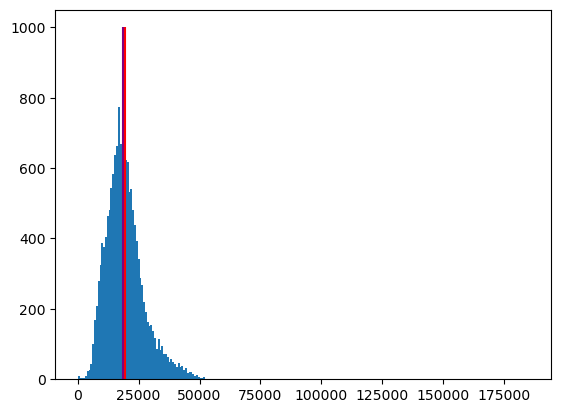

Report of bboxes_areas:
  0 <= area < 100: 4
  100 <= area < 500: 5
  500 <= area < 1000: 4
  1000 <= area < 5000: 57
  5000 <= area < 10000: 1271
  10000 <= area < 50000: 13951
  50000 <= area < 100000: 24
  100000 <= area < inf: 2
The mean area is: 19518.71869695783
The median area is: 18450.0
The minimum area is: 0
The maximum area is: 185174


In [162]:
hitl_bbox_areas = bbox_area(*np.array(hitl_bbox_annotation_df["bbox"].values.tolist()).T)
plt.hist(hitl_bbox_areas, bins="fd")
plt.vlines(np.mean(hitl_bbox_areas), 0, 1000, color="red")
plt.vlines(np.median(hitl_bbox_areas), 0, 1000, color="purple")
plt.show()
bboxes_report(hitl_bbox_areas)

The histogram indicates a right-skewed distribution of bounding box areas in this dental image dataset, with most areas concentrated between 5,000 and 50,000. The mean area is slightly larger than the median, suggesting the presence of larger-area outliers. We have a few bounding boxes with an area of 0, which may be errors. The maximum area is significantly larger than the average, indicating some exceptionally large bounding boxes. It would be beneficial to examine these extreme cases for potential annotation errors or peculiarities in the images. But we will do this in the next section.

In [175]:
hitl_bbox_annotation_df

,id,classId,description,geometryType,labelerLogin,createdAt,updatedAt,tags,classTitle,filename,bbox
0,1.166089e+09,11382893.0,,polygon,GhazalehHITL,2023-01-24T09:03:34.164Z,2023-01-24T09:03:34.164Z,[],8,1.jpg,"[963, 401, 1030, 588]"
1,1.166089e+09,11382894.0,,polygon,GhazalehHITL,2023-01-24T09:03:34.164Z,2023-01-24T09:03:34.164Z,[],9,1.jpg,"[1054, 394, 1124, 588]"
2,1.166089e+09,11382895.0,,polygon,GhazalehHITL,2023-01-24T09:03:34.164Z,2023-03-17T17:40:13.284Z,[],10,1.jpg,"[1136, 433, 1192, 583]"
3,1.166089e+09,11382901.0,,polygon,GhazalehHITL,2023-01-24T09:03:34.164Z,2023-01-24T09:03:34.164Z,[],11,1.jpg,"[1187, 414, 1266, 613]"
4,1.166089e+09,11382892.0,,polygon,GhazalehHITL,2023-01-24T09:03:34.164Z,2023-01-24T09:03:34.164Z,[],7,1.jpg,"[894, 418, 958, 584]"
...,...,...,...,...,...,...,...,...,...,...,...
15313,1.166091e+09,11382910.0,,polygon,GhazalehHITL,2023-01-24T09:04:49.934Z,2023-01-24T09:04:49.934Z,[],27,99.jpg,"[813, 640, 900, 833]"
15314,1.166091e+09,11382897.0,,polygon,GhazalehHITL,2023-01-24T09:04:49.934Z,2023-01-24T09:04:49.934Z,[],28,99.jpg,"[745, 629, 824, 824]"
15315,1.166091e+09,11382898.0,,polygon,GhazalehHITL,2023-01-24T09:04:49.934Z,2023-01-24T09:04:49.934Z,[],29,99.jpg,"[644, 614, 762, 822]"
15316,1.166091e+09,11382900.0,,polygon,GhazalehHITL,2023-01-24T09:04:49.934Z,2023-01-24T09:04:49.934Z,[],31,99.jpg,"[452, 572, 655, 745]"


To match the format of the `tufts_bboxes_df`, we need to remove the unnecessary (metadata) columns from the `hitl_bbox_annotation_df`. We will rename the `classTitle` to `class` column and split the `bbox` column into four separate coordinate columns. Apart from that the other important information for us is the `filename` column, which contains the name of the image file. Let's do that:

In [179]:
# To match the format of the `tufts_bboxes_df`, we need to remove the unnecessary (metadata) columns from the `hitl_bbox_annotation_df`. 
# We will rename the `classTitle` to `class` column and split the `bbox` column into four separate coordinate columns. 
# Apart from that the other important information for us is the `filename` column, which contains the name of the image file. Let's do that:
hitl_bboxes_df = hitl_bbox_annotation_df.drop(["classId", "id", "description", "geometryType", "labelerLogin", "createdAt", "updatedAt", "tags"], axis=1)
hitl_bboxes_df = hitl_bboxes_df.rename(columns={"classTitle": "class"})
hitl_bboxes_df = hitl_bboxes_df.assign(x1=hitl_bboxes_df.bbox.apply(lambda bbox: bbox[0]))
hitl_bboxes_df = hitl_bboxes_df.assign(y1=hitl_bboxes_df.bbox.apply(lambda bbox: bbox[1]))
hitl_bboxes_df = hitl_bboxes_df.assign(x2=hitl_bboxes_df.bbox.apply(lambda bbox: bbox[2]))
hitl_bboxes_df = hitl_bboxes_df.assign(y2=hitl_bboxes_df.bbox.apply(lambda bbox: bbox[3]))
hitl_bboxes_df = hitl_bboxes_df.drop("bbox", axis=1)
hitl_bboxes_df

,class,filename,x1,y1,x2,y2
0,8,1.jpg,963,401,1030,588
1,9,1.jpg,1054,394,1124,588
2,10,1.jpg,1136,433,1192,583
3,11,1.jpg,1187,414,1266,613
4,7,1.jpg,894,418,958,584
...,...,...,...,...,...,...
15313,27,99.jpg,813,640,900,833
15314,28,99.jpg,745,629,824,824
15315,29,99.jpg,644,614,762,822
15316,31,99.jpg,452,572,655,745


In [180]:
tufts_bboxes_df

,filename,class,x1,y1,x2,y2
0,797.jpg,1,476,314,533,376
1,797.jpg,2,484,368,554,480
2,797.jpg,3,541,365,605,505
3,797.jpg,4,600,368,655,503
4,797.jpg,5,649,366,700,515
...,...,...,...,...,...,...
26000,986.jpg,27,701,501,743,654
26001,986.jpg,28,654,509,701,650
26002,986.jpg,29,617,520,661,660
26003,986.jpg,31,449,521,583,675


We can now save this dataframe into a `csv` file, so that we can load it later without having to parse through all the files. We can do that with the following code:

In [202]:
hitl_bboxes_df.to_csv("./data/humans_in_the_loop/d2/ann_bboxes.csv", index=False)

### Enlarging Bounding Boxes for Contextual Analysis

Before we continue with the data we should prepare our dataset, by cropping out each individual tooth into a separate file. Now here it is a bit tricky. Let's look at one sample tooth from the `tufts_bboxes_df`:

In [7]:
def display_sample(sample_tooth_row, dataset_path):
	sample_tooth_panorama = cv2.imread(f'{dataset_path}/{sample_tooth_row.filename.iat[0]}')
	sample_tooth_x1, sample_tooth_y1, sample_tooth_x2, sample_tooth_y2 = sample_tooth_row[["x1", "y1", "x2", "y2"]].values[0]
	plt.imshow(sample_tooth_panorama[sample_tooth_y1 : sample_tooth_y2, sample_tooth_x1 : sample_tooth_x2], cmap="gray")
	plt.show()

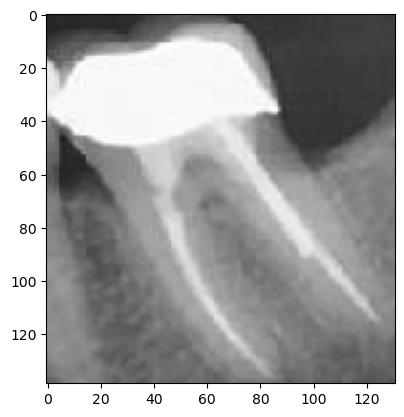

In [9]:
display_sample(tufts_bboxes_df.sample(1), TUFTS_RAW_DATASET_DIR)

Before we crop our teeth, we should think about one important concept: context. Context in image processing, especially in medical imaging like dental X-rays, plays a pivotal role in accurate analysis and classification.

An insightful article on dental image analysis [source article](https://www.mdpi.com/2077-0383/10/8/1635) highlights the significance of including surrounding areas when cropping images of individual teeth. The rationale is that teeth do not exist in isolation within the mouth; their condition, alignment, and even identification can be influenced by their relationship to adjacent teeth and structures.

This brings us to the decision between using a 100% bounding box, which tightly encloses the tooth, and a 200% bounding box, which includes additional surrounding areas. While a 100% bounding box focuses solely on the tooth, it may omit critical contextual information. On the other hand, a 200% bounding box captures a broader area, providing a more comprehensive view that includes adjacent teeth and gum line. This additional context can be invaluable, especially in cases where the characteristics of neighboring teeth contribute to the identification or assessment of the tooth in question.

In conclusion it is a lot better if we use a 200% bounding box with our model, because it will give us more context and will help us to identify the tooth more accurately. Let's do that:

In [10]:
def enlarge_bbox(row, scale=1):
	"""
	Enlarges a bounding box by a given scale.

	Parameters:
	- row: A row from the dataset table containing the bounding box coordinates.
	- scale: The scale to enlarge the bounding box by.

	Returns:
	- The enlarged bounding box.
	"""
	x1, y1, x2, y2 = row[['x1', 'y1', 'x2', 'y2']].values
	width = x2 - x1
	height = y2 - y1
	x1 -= width * scale / 4
	y1 -= height * scale / 4
	x2 += width * scale / 4
	y2 += height * scale / 4
	return (x1, y1, x2, y2)

In [11]:
hitl_bboxes_enlarged = hitl_bboxes_df.copy()
tufts_bboxes_enlarged = tufts_bboxes_df.copy()

for index, row in hitl_bboxes_enlarged.iterrows():
	hitl_bboxes_enlarged.loc[index, ['x1', 'y1', 'x2', 'y2']] = enlarge_bbox(row, scale=2)

for index, row in tufts_bboxes_enlarged.iterrows():
	tufts_bboxes_enlarged.loc[index, ['x1', 'y1', 'x2', 'y2']] = enlarge_bbox(row, scale=2)

We need to round the coordinates to integers, because we are going to use them as indices for cropping the images. Let's do that and after that look at a sample enlarged image.

In [12]:
hitl_bboxes_enlarged[['x1', 'y1', 'x2', 'y2']] = hitl_bboxes_enlarged[['x1', 'y1', 'x2', 'y2']].round().astype(int)
tufts_bboxes_enlarged[['x1', 'y1', 'x2', 'y2']] = tufts_bboxes_enlarged[['x1', 'y1', 'x2', 'y2']].round().astype(int)

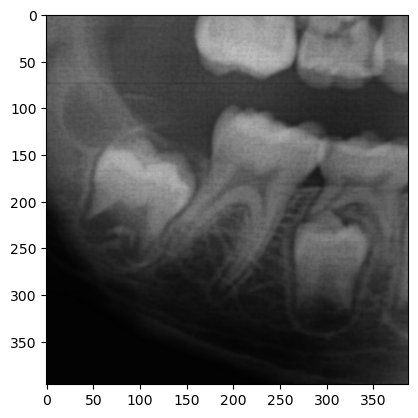

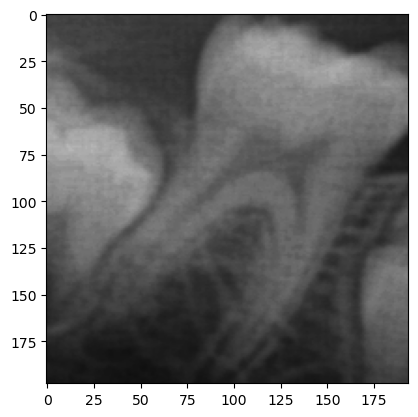

In [18]:
enlarged_sample = hitl_bboxes_enlarged.sample(1)
original_sample = hitl_bboxes_df.loc[enlarged_sample.index]
display_sample(enlarged_sample, HITL_RAW_DATASET_DIR)
display_sample(original_sample, HITL_RAW_DATASET_DIR)

Now we can safely crop the enlarged images and save them in a separate folder for both of the datasets.

In [303]:
def crop_teeth(dataframe, dataset_dir, cropped_folder):
	res_folder = dataset_dir + "/" + cropped_folder
	results_list = []
	if not os.path.exists(res_folder):
		os.makedirs(res_folder)

	# Get the unique filenames in the dataframe
	unique_filenames = dataframe["filename"].unique()

	# Use tqdm to track the progress of the outer for loop
	for filename in tqdm(unique_filenames, desc="Processing images"):
		# Get the rows for the current image
		image_rows = dataframe[dataframe["filename"] == filename]

		# Open the image file
		image = cv2.imread(f"{dataset_dir}/{filename}")

		# Iterate through each row for the current image
		for index, row in image_rows.iterrows():
			# Get the bounding box coordinates
			x1, y1, x2, y2 = row[["x1", "y1", "x2", "y2"]].values

			# Check if coordinates are out of bounds
			height, width, _ = image.shape
			x1 = max(0, min(x1, width - 1))
			x2 = max(0, min(x2, width - 1))
			y1 = max(0, min(y1, height - 1))
			y2 = max(0, min(y2, height - 1))

			# Crop the tooth using the bounding box coordinates
			cropped_tooth = image[y1:y2, x1:x2]

			# Skip the tooth if it is empty
			if cropped_tooth.size == 0:
				continue

			# Save the cropped tooth as a separate image file
			result_filename = f"{res_folder}/{filename.split('.')[0]}_{row['class']}.jpg"
			cv2.imwrite(result_filename, cropped_tooth)
			results_list.append([result_filename, row["class"]])

	return pd.DataFrame(results_list, columns=["filename", "class"])

In [304]:
hitl_teeth = crop_teeth(hitl_bboxes_enlarged, HITL_RAW_DATASET_DIR, "cropped")

Processing images: 100%|██████████| 595/595 [01:15<00:00,  7.89it/s]


In [305]:
tufts_teeth = crop_teeth(tufts_bboxes_enlarged, TUFTS_RAW_DATASET_DIR, "cropped")

Processing images: 100%|██████████| 968/968 [01:28<00:00, 10.94it/s]


Let's now save these dataframes into separate files, so that we can load them later without having to read the data again.

In [54]:
hitl_teeth.to_csv("./data/humans_in_the_loop/d2/ann_cropped.csv", index=False)
tufts_teeth.to_csv("./data/tufts/Segmentation/ann_cropped.csv", index=False)

Having saved the cropped images and classes in a dataframe, we have successfully prepared our data. We can now move on to the next step - EDA.

## Exploratory Data Analysis (EDA)

### Visual Inspection of Images

Let's start by looking at the images from both datasets, which will give us a direct feel for the data we're working with.

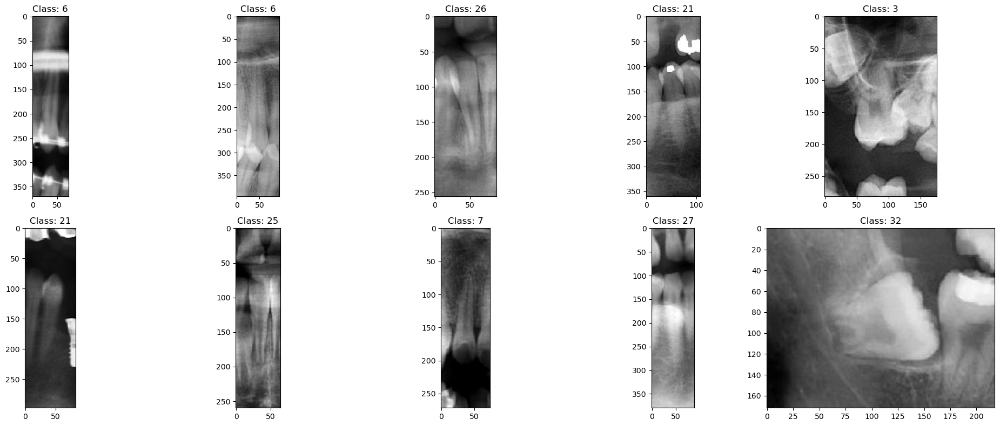

In [61]:
def plot_sample_images(dataframe, sample_size=10):
    samples = dataframe.sample(sample_size)

    # Plotting
    fig, axes = plt.subplots(nrows=2, ncols=5, figsize=(20, 8))  # Adjust the size as needed
    axes = axes.flatten()

    image_paths = samples["filename"].tolist()
    labels = samples["class"].tolist()

    for i, img_path in enumerate(image_paths):
        img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
        axes[i].imshow(img, cmap='gray')
        axes[i].set_title(f'Class: {labels[i]}')
        # axes[i].axis('off')

    plt.tight_layout()
    plt.show()

plot_sample_images(tufts_teeth)

We can see that the sample images, while similar in size have different proportions. Those of the incisors are more elongated, while those of the molars are more square. This is even more evident because of the enlarged bounding boxes. Most of the images appear to have good contrast, which is very important for us. However, some teeth, particularly those in the "Class 6" and "Class 25", seem to be less clear and with lower contrast than the rest of the pack. The teeth in the images are in different orientation - mostly facing up (for those with class > 16) and down (for those with class < 16). This is important to note, as it may affect the performance of our model. Some images have dental work done to them or even contain braces, which could also obscure the underlying structures and turn out to be a problem for our model. Each image also has different width and height, so we might need to do something about that. 

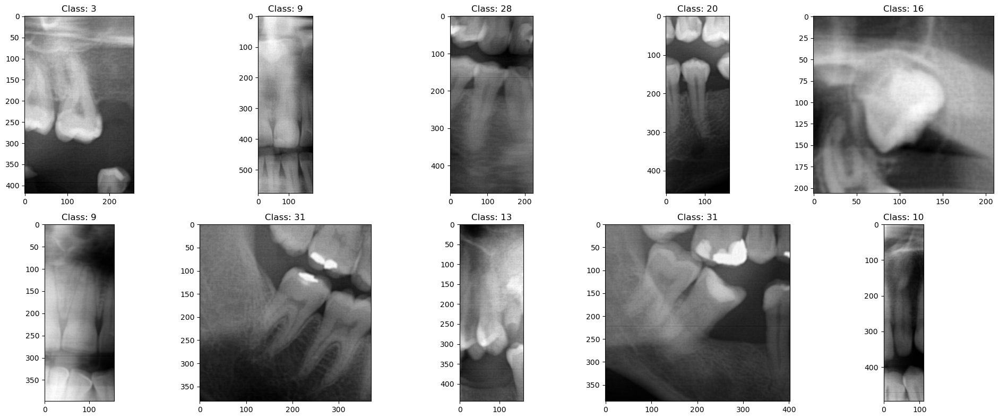

In [64]:
plot_sample_images(hitl_teeth)

On the HITL (humans in the loop) dataset we have very similar images, but directly compared to the other one, they appear to be a bit more blurry. Again we have different teeth orientations - most teeth are vertical, but some are at a 45 degree angle. The images vary in contrast and exposure. Some like the "Class 28" one have higher contrast, making it easy to see the boundaries between different dental structures. Others, like "Class 16", are less clear and would benefit from some preprocessing to improve the contrast and definition of the details. Again we have some images with dental work done on them ("Class 31"). The images are at different sizes, so we will later need to standardize them for our model.

### Class Distribution

The next step in our EDA is to look at the distribution of the classes in both datasets. This is very important to understand how balanced or imbalanced our data is across different classes. This can then have significant implications on the performance of our model. First we will see what classes the Tufts dataset has:

In [68]:
tufts_teeth["class"].unique()

array(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11', '12',
       '13', '14', '15', '16', '17', '18', '20', '21', '22', '23', '24',
       '25', '26', '27', '28', '29', '30', '31', '32', '19', 'A', 'B',
       'C', 'D', 'G', 'H', 'I', 'J', 'K', 'L', 'M', 'R', 'S', 'T', 'N',
       'Q', 'P', 'E', 'F', 'O'], dtype=object)

Here the classes 1 through 32 correspond to one of the teeth in the humans mouth, starting from left to right. The capital letter classes are for milk teeth as we can see from the two images below.

In [125]:
def plot_image_with_bboxes_from_dataset(df, folder, filename, figsize=(10, 10)):
  image_data = cv2.imread(f"{folder}/{filename}")
  plot_image_with_bboxes(image_data, df[df.filename == filename][["x1", "y1", "x2", "y2"]].values,  df[df.filename == filename]["class"].values, figsize)

132.jpg


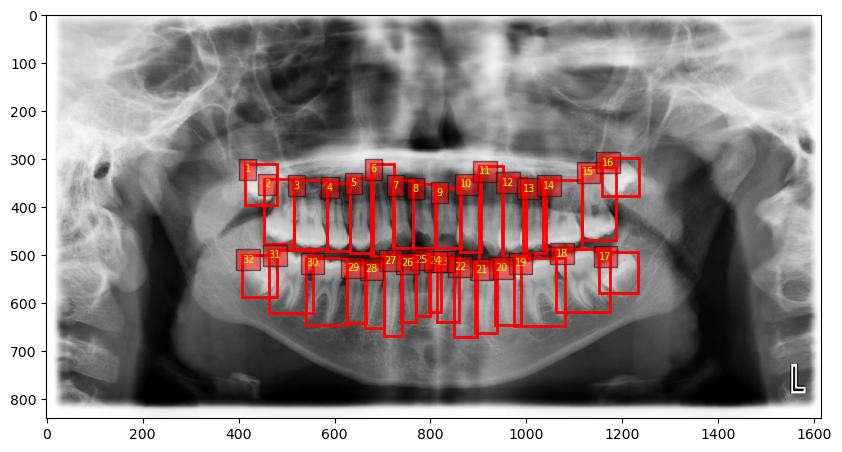

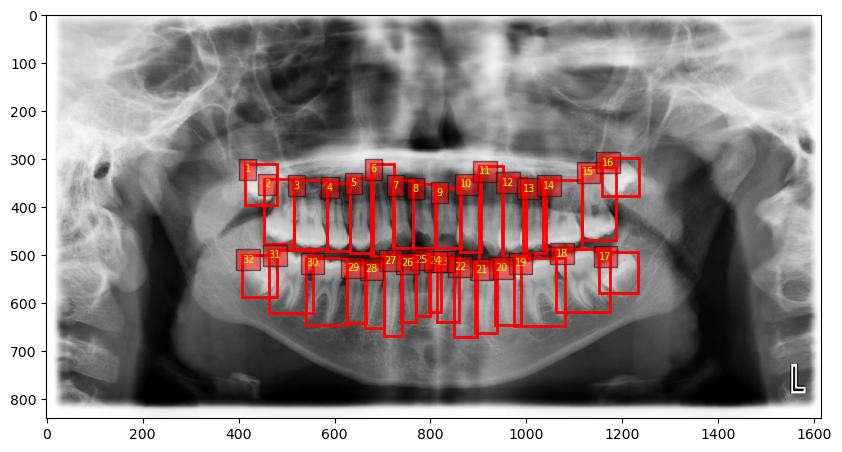

In [126]:
tooth_32_image_name = tufts_bboxes_df[tufts_bboxes_df.groupby('filename')['class'].transform('nunique') == 32]['filename'].iloc[0]
plot_image_with_bboxes_from_dataset(tufts_bboxes_df, TUFTS_RAW_DATASET_DIR, tooth_32_image_name)

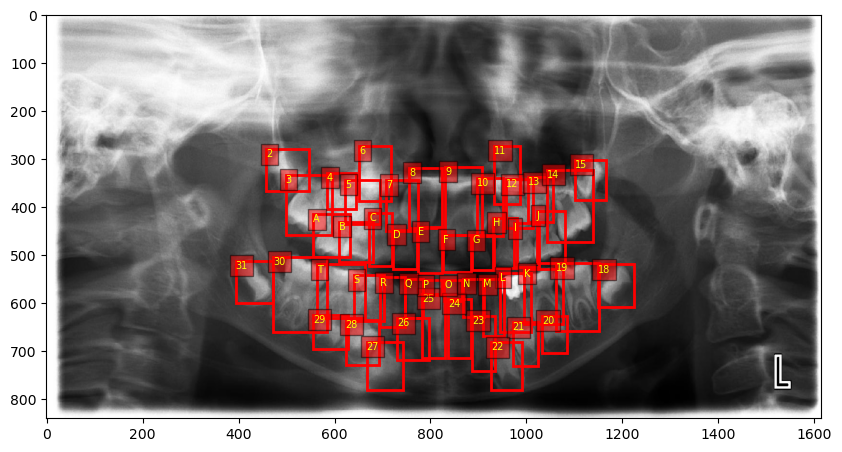

In [127]:
# Find an image that has all capital letter classes from A to T and no numerical classes
tooth_milk_name = tufts_bboxes_df[tufts_bboxes_df["class"].str.match(r'^[A-T]$')].groupby("filename").filter(lambda x: len(x) == 20)["filename"].unique()[0]
plot_image_with_bboxes_from_dataset(tufts_bboxes_df, TUFTS_RAW_DATASET_DIR, tooth_milk_name)

Now we should look at the HITL dataset labels.

In [104]:
np.sort(hitl_teeth["class"].unique())

array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
       18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32],
      dtype=int64)

Here we can see that the classes are numbers and only 1-32. This means that in this dataset we either have only the permanent teeth or the milk teeth are annotated with the same classes as the permanent ones, or they aren't annotated at all. After going through the first few samples, we clearly see that some of the radiographs do in fact contain milk teeth. One such image is `./data/humans_in_the_loop/d2/img/2.jpg`. Let's look at it:

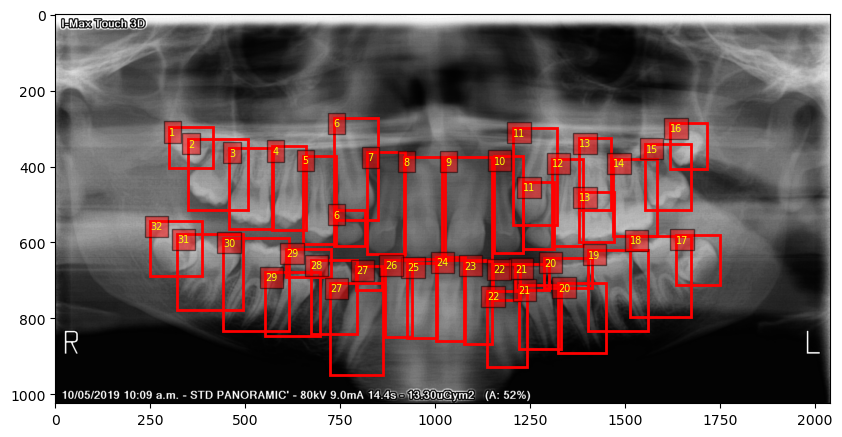

In [128]:
plot_image_with_bboxes_from_dataset(hitl_bboxes_df, HITL_RAW_DATASET_DIR, "2.jpg")

We can clearly see that the milk teeth are annotated with the same classes as the permanent ones and are not distinguished. We now have three cases, which we need to figure out how to work with.
1. The first case is when we have only permanent teeth annotated. In this case we can just use the classes as they are.
2. The second case is when for a certain class we have only a milk tooth annotated. This is highly unlikely, because the child would have to be very small in order to have no signs of permanent teeth forming.
2. The third case is when we have both permanent and milk tooth with the same class in one image. This is what we are interested in. In this case we can safely assume that the milk tooth is the one closer to the center of the image and the permanent tooth is the one closer to the edge of the image. We can use this information to distinguish between the two types of teeth and annotate them with their corresponding correct classes like in the Tufts dataset (A-T for milk teeth 4-13 and 20-29)

In [165]:
# Group the dataframe by filename and class, and count the number of unique teeth for each group
duplicate_teeth = hitl_bboxes_enlarged.groupby(['filename', 'class']).size().reset_index(name='count')

# Filter the dataframe to only include rows where the count is greater than 1
duplicate_teeth = duplicate_teeth[duplicate_teeth['count'] > 1]

# Count the number of unique filenames in the filtered dataframe
duplicate_teeth['filename'].nunique(), len(duplicate_teeth) / len(hitl_bboxes_enlarged)

(52, 0.01733272287265354)

Thankfully only 52 images contain milk teeth, which amount to around 1.7% samples of the whole dataset. After we have extracted the repeating teeth, we can remap their classes accordingly using their coordinates. More specifically for each duplicate annotation of a tooth:
- in the upper part of the mouth the teeth are numbered from 1 to 16 and the milk teeth go on the inner 10 positions - 4 to 13 (inclusive). Any duplicates outside of that range are most probably errors in the annotation of the permanent teeth.
- in the lower part of the mouth the teeth are numbered form 17 to 32 and the milk teeth go on the inner 10 positions - 20 to 29 (inclusive). Any duplicates outside of that range are most probably errors in the annotation of the permanent teeth.

Let's look at the `duplicate_teeth` dataframe and see if we have any duplicates due to annotation errors. 

In [217]:
duplicate_teeth_filtered = duplicate_teeth[(duplicate_teeth['class'] < 4) | ((duplicate_teeth['class'] > 14) & (duplicate_teeth['class'] < 19)) | (duplicate_teeth['class'] > 29)]
len(duplicate_teeth_filtered)

0

The other duplicates are due to the image containing real milk teeth. As we discussed earlier we will remap the classes of the milk teeth to the corresponding ones in the Tufts dataset (A-T). We will do that by using the coordinates of the upper left corner of the bounding box. Using them we will annotate the tooth closer to the respective border of the image to be a milk tooth.

In [170]:
def map_permanent_to_milk(number):
	if 4 <= number <= 13:
		return chr(ord('A') + number - 4)
	elif 20 <= number <= 29:
		return chr(ord('K') + number - 20)
	else:
		return str(number)

'F'

In [171]:
for index, row in duplicate_teeth.iterrows():
	filename = row['filename']
	tooth_class = row['class']
	
	# Get the rows for the current filename and tooth class
	rows = hitl_bboxes_enlarged[(hitl_bboxes_enlarged['filename'] == filename) & (hitl_bboxes_enlarged['class'] == tooth_class)]
	
	# Get the coordinates of the bounding boxes
	x1_values = rows['x1'].values
	y1_values = rows['y1'].values
	
	# Check if the tooth class is less than or equal to 16
	if tooth_class <= 16:
		# Find the index of the bounding box that is closer to the upper edge
		upper_index = np.argmin(y1_values)
		
		# Update the class of the other bounding box to be a milk tooth
		if upper_index == 0:
			hitl_bboxes_enlarged.loc[rows.index[1], 'class'] = map_permanent_to_milk(tooth_class)
		else:
			hitl_bboxes_enlarged.loc[rows.index[0], 'class'] = map_permanent_to_milk(tooth_class)
	else:
		# Find the index of the bounding box that is closer to the upper edge
		upper_index = np.argmax(y1_values)
		
		# Update the class of the other bounding box to be a milk tooth
		if upper_index == 0:
			hitl_bboxes_enlarged.loc[rows.index[1], 'class'] = map_permanent_to_milk(tooth_class)
		else:
			hitl_bboxes_enlarged.loc[rows.index[0], 'class'] = map_permanent_to_milk(tooth_class)

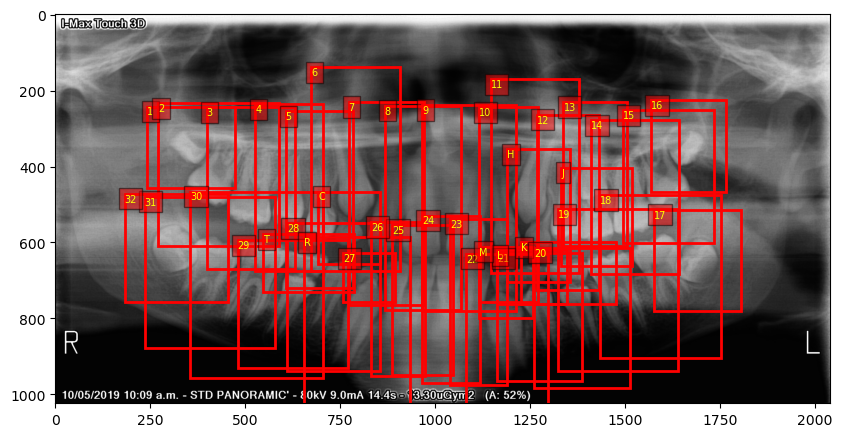

In [172]:
plot_image_with_bboxes_from_dataset(hitl_bboxes_enlarged, HITL_RAW_DATASET_DIR, "2.jpg")

Now we can go through the duplicated teeth and delete their cropped image, because what happened earlier is that every time that we encountered a duplicate, we only saved the latter result. Let's start by deleting the images from the cropped folder, saving them and their corresponding milk tooth correctly and then fixing the duplicates in the `hitl_teeth` dataframe.

In [255]:
# Define the path to the cropped folder
cropped_folder = "cropped"

# Iterate through each duplicate tooth in the dataframe
for index, row in duplicate_teeth.iterrows():
	filename = row['filename']
	filename_id = filename.split('.')[0]
	tooth_class = row['class']
	
	# Get the rows for the current filename and tooth class
	rows = hitl_bboxes_enlarged[(hitl_bboxes_enlarged['filename'] == filename) & ((hitl_bboxes_enlarged['class'] == tooth_class) | (hitl_bboxes_enlarged['class'] == map_permanent_to_milk(tooth_class)))]
	# Get the filenames of the existing cropped images
	existing_filename = f"{HITL_RAW_DATASET_DIR}/{cropped_folder}/{filename_id}_{tooth_class}.jpg"
	# Delete the existing cropped images
	if os.path.exists(existing_filename):
		os.remove(existing_filename)
	
	
	hitl_teeth = hitl_teeth.drop(hitl_teeth[(hitl_teeth["filename"] == f"{HITL_RAW_DATASET_DIR}/{cropped_folder}/{filename_id}_{tooth_class}.jpg") & (hitl_teeth["class"] == tooth_class)].index)
 
	# Save the new cropped images as files and also to the hitl_teeth dataframe
	for i, row in rows.iterrows():
		x1, y1, x2, y2 = row[["x1", "y1", "x2", "y2"]].values
		image = cv2.imread(f"{HITL_RAW_DATASET_DIR}/{filename}", cv2.IMREAD_GRAYSCALE)
		cropped_tooth = image[y1:y2, x1:x2]
		if cropped_tooth.size > 0:
			new_filename = f"{HITL_RAW_DATASET_DIR}/{cropped_folder}/{filename_id}_{row['class']}.jpg"
			cv2.imwrite(new_filename, cropped_tooth)
			hitl_teeth.loc[len(hitl_teeth)] = [new_filename, row['class']]

Now we can safely analyze the class distribution in the two datasets.

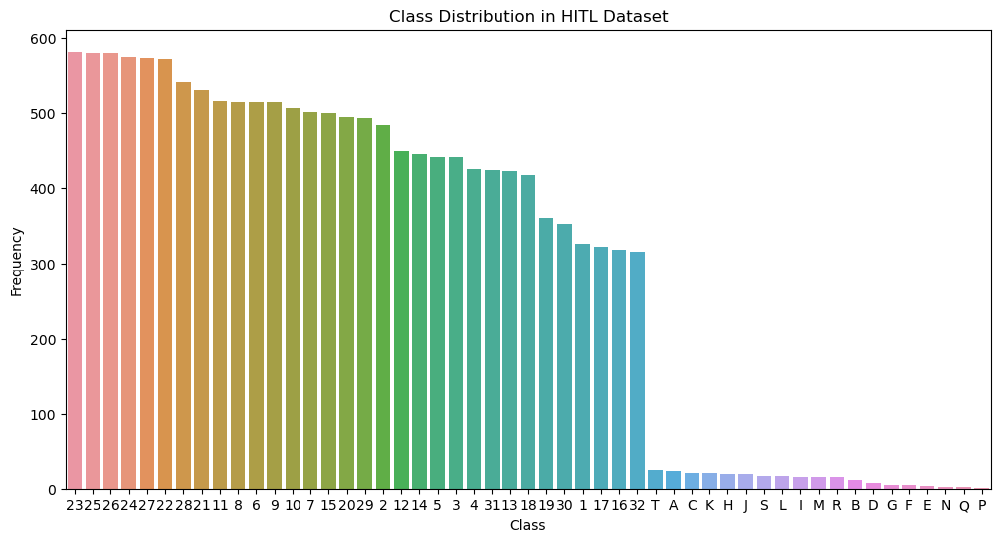

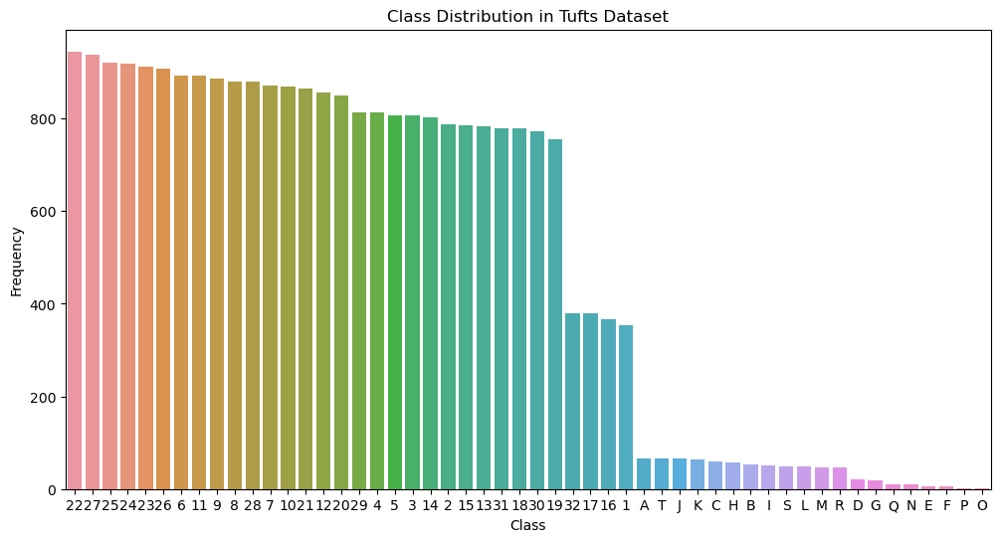

In [273]:
# Count the occurrences of each class
class_counts_hitl = hitl_teeth['class'].value_counts()
class_counts_tufts = tufts_teeth['class'].value_counts()

# Plotting
plt.figure(figsize=(12, 6))
sns.barplot(x=class_counts_hitl.index, y=class_counts_hitl.values)
plt.title('Class Distribution in HITL Dataset')
plt.xlabel('Class')
plt.ylabel('Frequency')
plt.show()

plt.figure(figsize=(12, 6))
sns.barplot(x=class_counts_tufts.index, y=class_counts_tufts.values)
plt.title('Class Distribution in Tufts Dataset')
plt.xlabel('Class')
plt.ylabel('Frequency')
plt.show()


From the first plot we see that the HITL dataset shows relatively uniform distribution among the more frequent classes, with a sharp drop-off for the least frequent classes. The Tufts dataset displays a more pronounced imbalance, with a gradual decline in frequency among the most common with a sharp dropp to the mid-frequency classes and then again a steep drop to the least common classes. In both datsets, some classes are highly represented. However there are classes which have very few samples - those for milk teeth. In addition we can see that in the middle we have mid-frequency classes which don't have as much samples as the others but still significantly higher amounts than the milk teeth. These are the wisdom teeth (with classes 1, 16, 17, 32), which are less common in people than incisors and canines. This is more evident in the Tufts dataset, where there are more than two times less samples than the high-frequency classes. Also in the low-frequency range we can see that in both datasets the low-frequency classes the least represented are the milk teeth with classes (P, Q, N, E, F, O). This is because those are the incisor milk teeth, which are the first to fall out and are replaced by the permanent incisors. We can even see that in the HITL dataset there are no samples of class O. In any case it will be useful to preform some kind of balancing of the classes, so that we can have a more balanced dataset.

### Image Size and Quality Analysis

Next it will be beneficial to look at the size and quality of the images in both datasets. This will give us a better understanding of the data we are working with and will help us to decide what kind of further preprocessing we need to do.

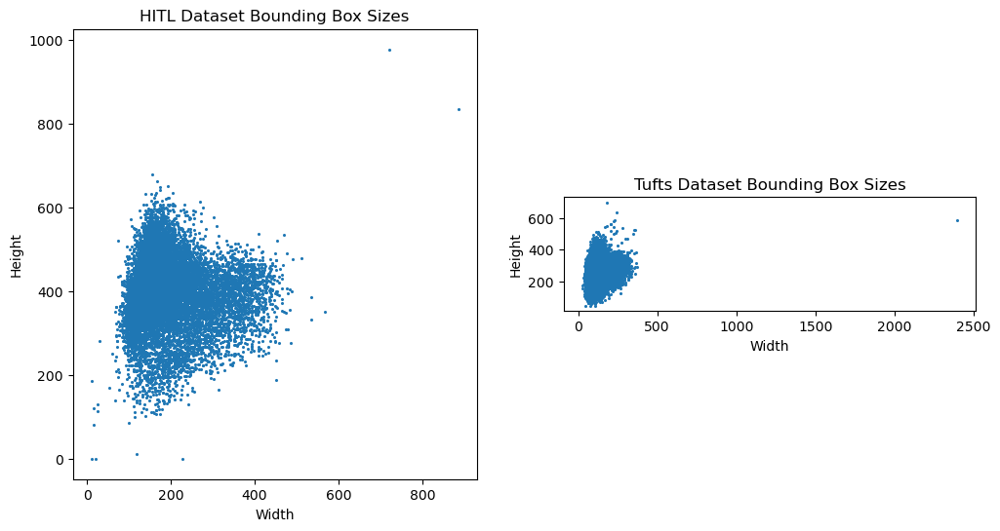

In [279]:
def plot_hitl_tufts_widths_heights():
	hitl_widths = hitl_bboxes_enlarged['x2'] - hitl_bboxes_enlarged['x1']
	hitl_heights = hitl_bboxes_enlarged['y2'] - hitl_bboxes_enlarged['y1']
	tufts_widths = tufts_bboxes_enlarged['x2'] - tufts_bboxes_enlarged['x1']
	tufts_heights = tufts_bboxes_enlarged['y2'] - tufts_bboxes_enlarged['y1']

	plt.figure(figsize=(12, 6))
	plt.subplot(1, 2, 1)
	plt.scatter(hitl_widths, hitl_heights, s=1.5)
	plt.gca().set_aspect('equal', adjustable='box')
	plt.title('HITL Dataset Bounding Box Sizes')
	plt.xlabel('Width')
	plt.ylabel('Height')
	plt.subplot(1, 2, 2)
	plt.scatter(tufts_widths, tufts_heights, s=1.5)
	plt.gca().set_aspect('equal', adjustable='box')
	plt.title('Tufts Dataset Bounding Box Sizes')
	plt.xlabel('Width')
	plt.ylabel('Height')
	plt.show()
 
plot_hitl_tufts_widths_heights()

First thing we can clearly see is that based on just image size there are most probably some outliers in both datasets. Let's look at the images with the largest sizes in both datasets.

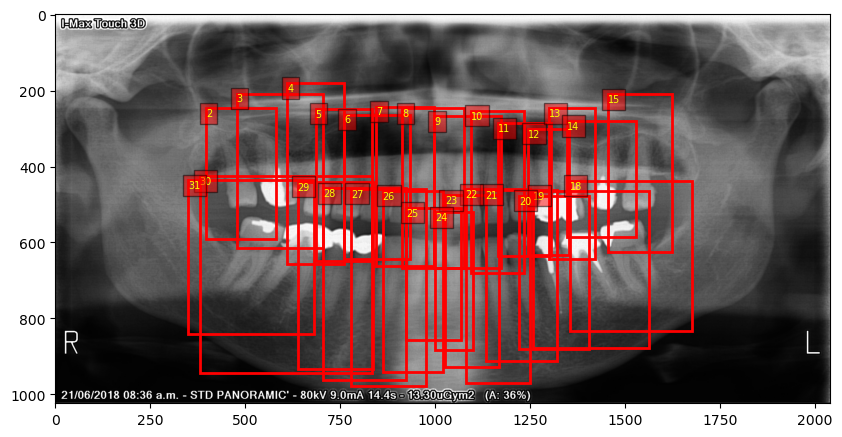

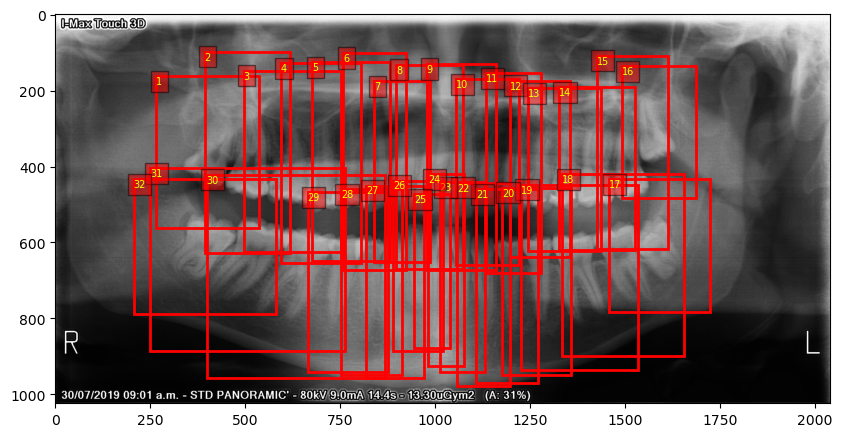

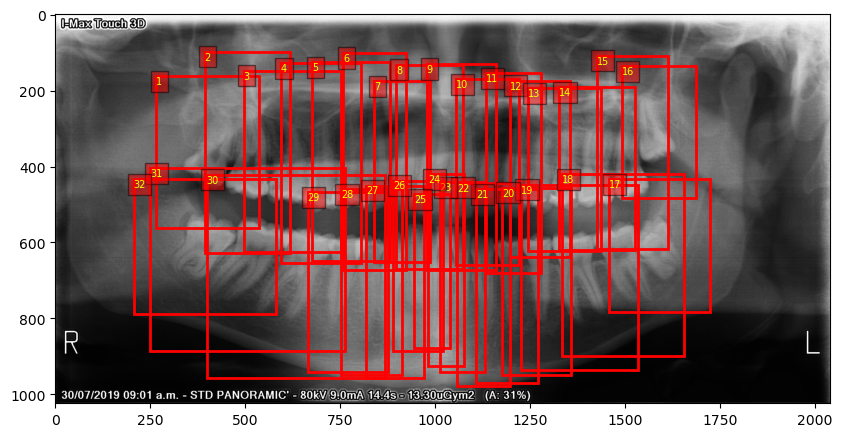

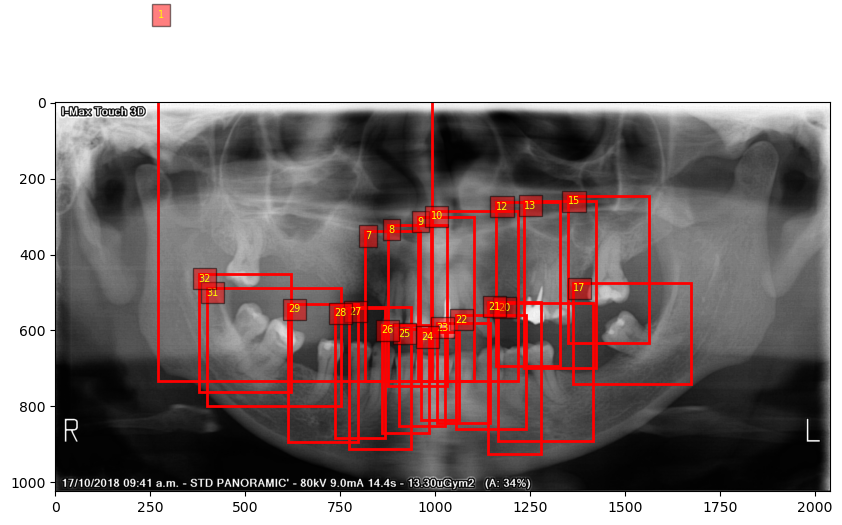

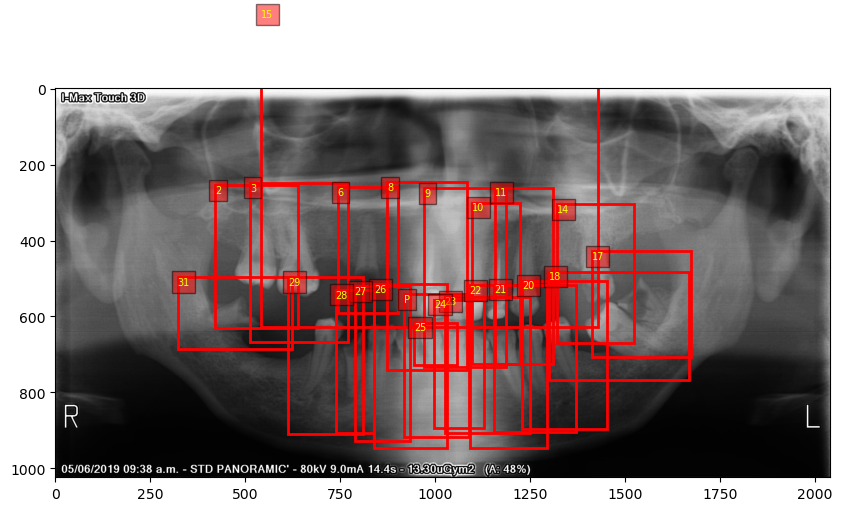

In [297]:
# Find the indexes of the rows with the largest bounding boxes
hitl_top5_bboxes = hitl_bboxes_enlarged.loc[((hitl_bboxes_enlarged['x2'] - hitl_bboxes_enlarged['x1']) * (hitl_bboxes_enlarged['y2'] - hitl_bboxes_enlarged['y1'])).sort_values().tail(5).index]

for i in range(5):
	plot_image_with_bboxes_from_dataset(hitl_bboxes_enlarged, HITL_RAW_DATASET_DIR, hitl_top5_bboxes.filename.values[i])

Here in the HITL dataset we can see that the two largest areas are errors in the annotation. We can remove those records from the dataframe and delete the corresponding images. The other three are just very large bounding boxes with a lot of context. We can keep those. Now let's look at the largest images in the Tufts dataset.

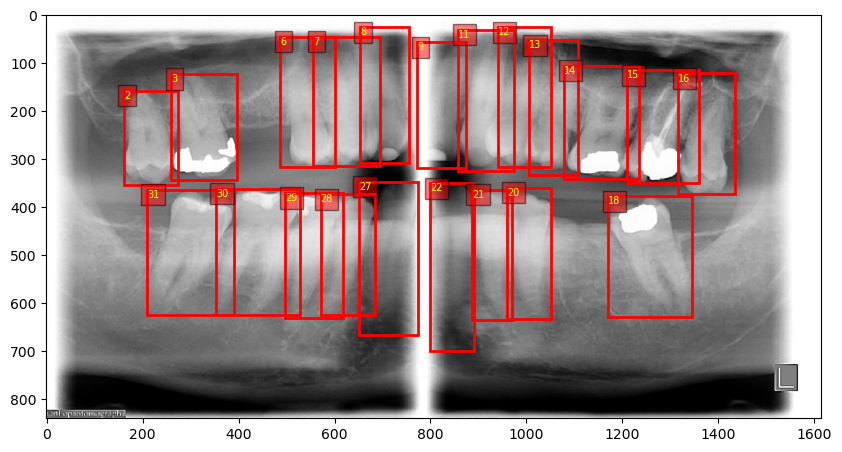

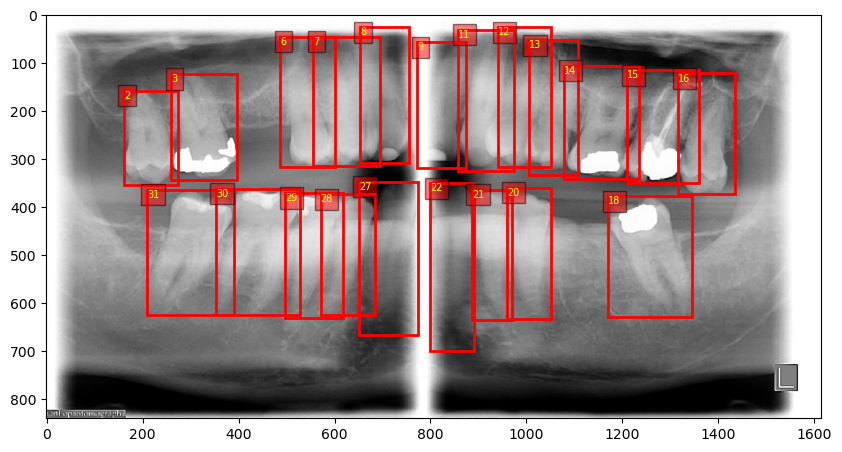

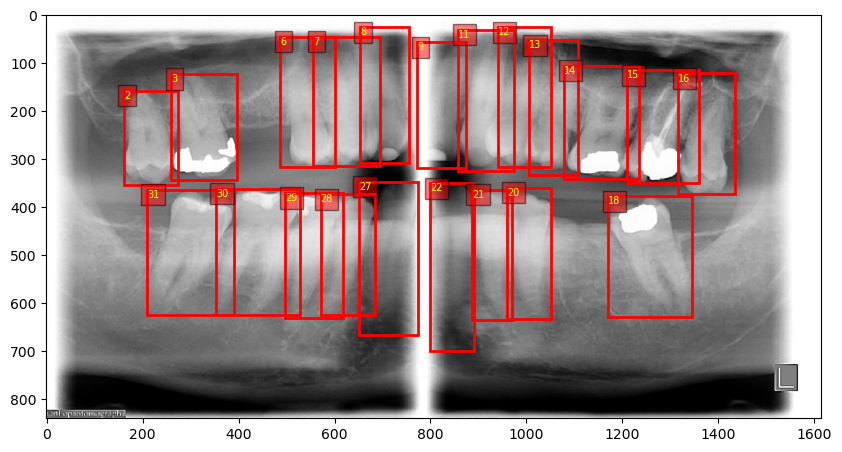

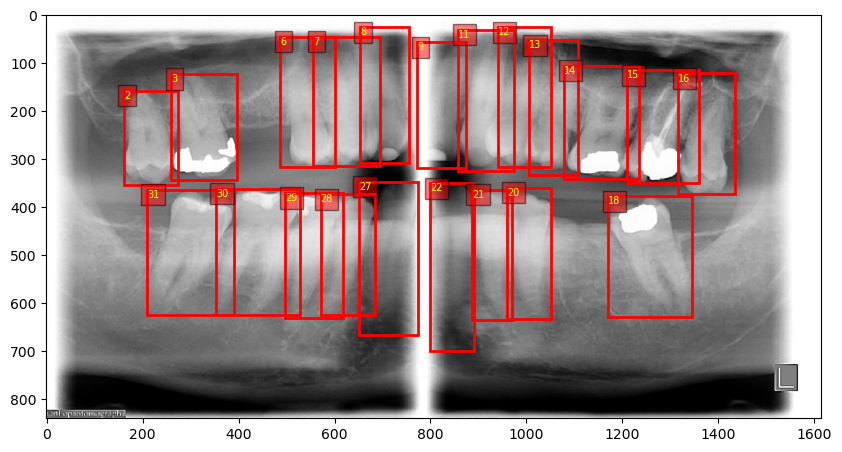

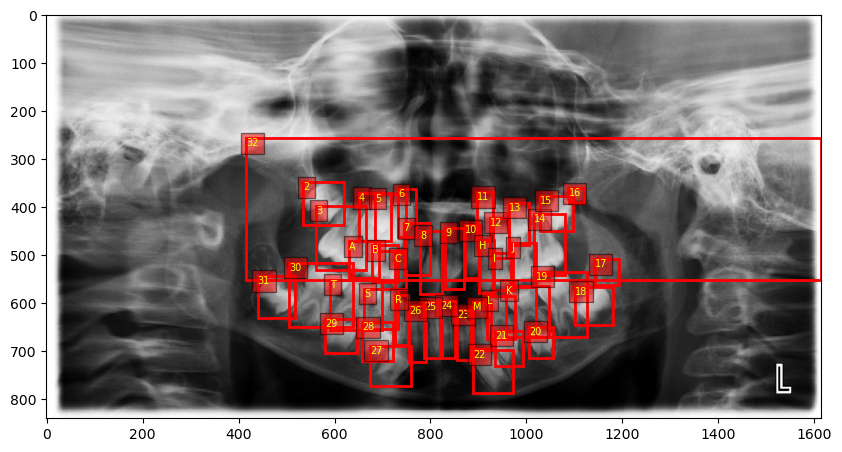

In [299]:
# Find the index of the row with the largest bounding box size
tufts_top5_bboxes = tufts_bboxes_enlarged.loc[((tufts_bboxes_enlarged['x2'] - tufts_bboxes_enlarged['x1']) * (tufts_bboxes_enlarged['y2'] - tufts_bboxes_enlarged['y1'])).sort_values().tail(5).index]

for i in range(5):
	plot_image_with_bboxes_from_dataset(tufts_bboxes_df, TUFTS_RAW_DATASET_DIR, tufts_top5_bboxes.filename.values[i])

Here we can see that the largest bounding box is again an error in the annotation, but the rest of them are just very large bounding boxes with a lot of context. We can keep those.

In [344]:
# Get the filenames and indexes that contain one of the filenames and classes form the top 2 largest bboxes
hitl_del_filenames = hitl_teeth[hitl_teeth['filename'].str.contains('|'.join(hitl_top5_bboxes.tail(2).filename.str.split('.').str[0] + "_" + hitl_top5_bboxes.tail(2)["class"].astype(str) + ".jpg"))]['filename']
tufts_del_filenames = tufts_teeth[tufts_teeth['filename'].str.contains(tufts_top5_bboxes.filename.values[4].split('.')[0] + "_" + tufts_top5_bboxes["class"].values[4] + ".jpg")]['filename']

In [350]:
hitl_teeth = hitl_teeth.drop(hitl_del_filenames.index)
tufts_teeth = tufts_teeth.drop(tufts_del_filenames.index)

for filename in hitl_del_filenames:
	os.remove(filename)

for filename in tufts_del_filenames:
	os.remove(filename)

hitl_bboxes_enlarged = hitl_bboxes_enlarged.drop(hitl_top5_bboxes.tail(2).index)
tufts_bboxes_enlarged = tufts_bboxes_enlarged.drop(tufts_top5_bboxes.index[4])

Now we can try to look at the sizes scatter plot again, without the outliers.

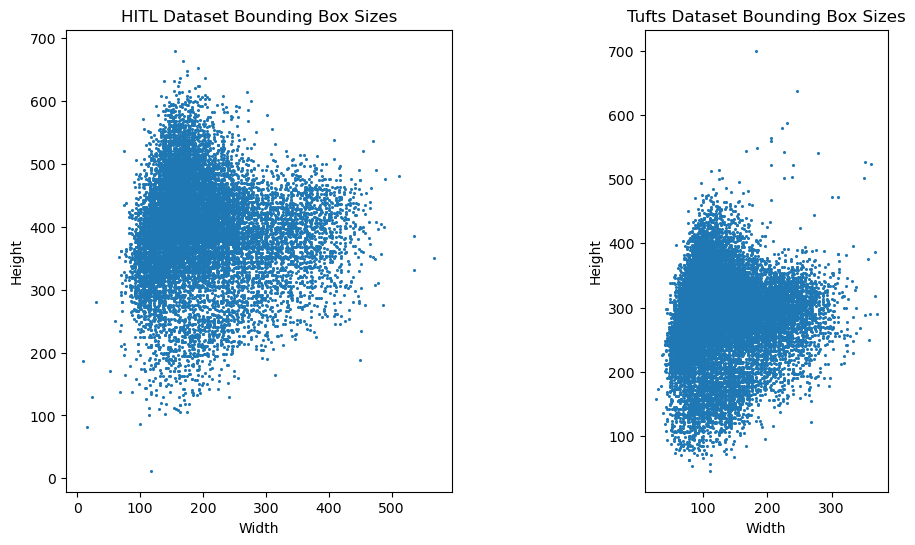

In [375]:
plot_hitl_tufts_widths_heights()

Both datasets exhibit a wide range of bounding box sizes, indicating variability in the size of the regions of interest within the images, which is even more emphasized by our enlargement. The HITL dataset shows a dense clustering of bounding boxes with widths predominantly between 100 and 300 pixels and heights mostly between 200 and 400 pixels. 
There is a noticeable spread towards larger widths and heights, indicating some images with much larger regions of interest.
- There are also instances of very small bounding boxes, as seen in the bottom left corner of the plot, suggesting some very small regions of interest or potentially noise/artifacts being mistakenly identified as objects of  interest. Those might be errors in the annotation process, which we can remove from the dataset, but we will look at them later.
- The Tufts dataset has a more concentrated distribution of bounding box sizes, with the majority having widths between 100 and 200 pixels and heights between 200 and 350 pixels.
- There is less spread towards larger bounding box sizes compared to the HITL dataset, suggesting more consistency in the size of the regions of interest.
- The Tufts dataset has fewer extreme outliers in terms of very large or very small bounding boxes.
- The HITL dataset appears to have a broader distribution of object sizes, while the Tufts dataset objects are more consistent in size.
- The HITL dataset might have more varied imaging conditions or include a wider range of objects, whereas the Tufts dataset seems to be more standardized in terms of what is being captured.

Let's look at the images with the smallest bounding boxes in both datasets. We can ignore those with area 0, because we know that those are errors in the annotation and in the cropping step we have already removed them.

In [359]:
((hitl_bboxes_enlarged['x2'] - hitl_bboxes_enlarged['x1']) * (hitl_bboxes_enlarged['y2'] - hitl_bboxes_enlarged['y1'])).replace(0, np.nan).dropna().sort_values().head(5)

4965     1312.0
12410    1416.0
12693    1860.0
5454     1920.0
5452     2964.0
dtype: float64

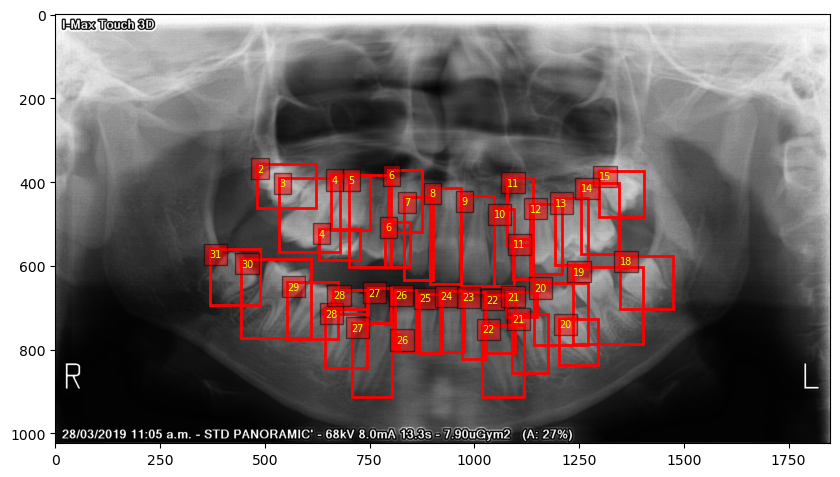

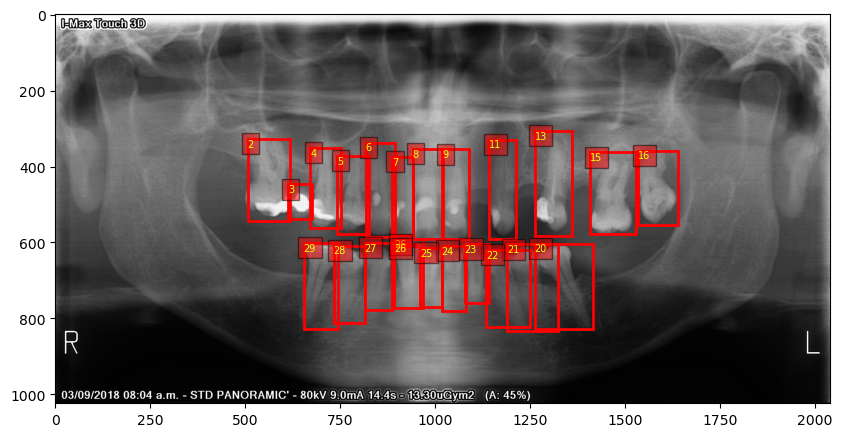

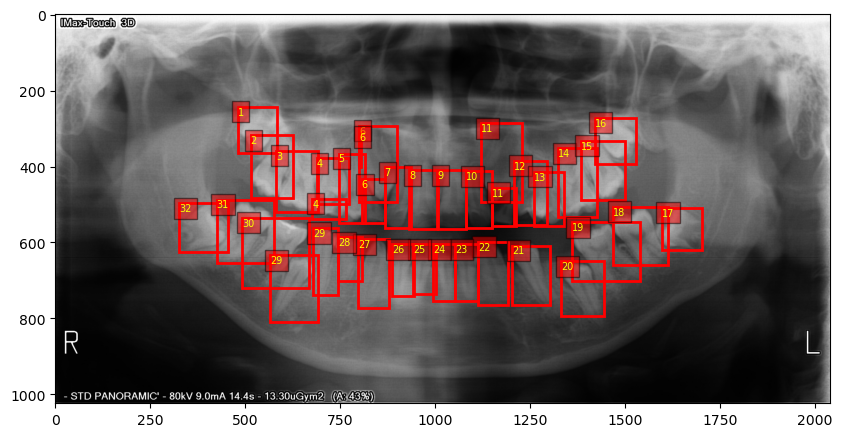

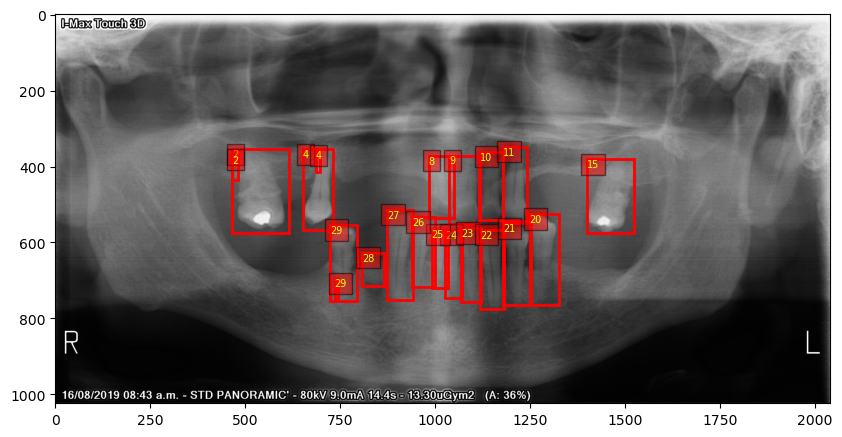

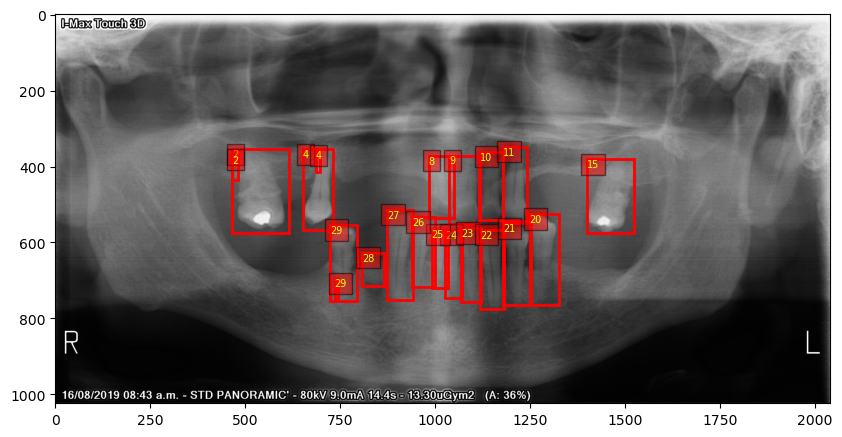

In [362]:
# Find the indexes of the rows with the largest bounding boxes
hitl_small5_bboxes = hitl_bboxes_enlarged.loc[((hitl_bboxes_enlarged['x2'] - hitl_bboxes_enlarged['x1']) * (hitl_bboxes_enlarged['y2'] - hitl_bboxes_enlarged['y1'])).replace(0, np.nan).dropna().sort_values().head(5).index]

for i in range(5):
	plot_image_with_bboxes_from_dataset(hitl_bboxes_df, HITL_RAW_DATASET_DIR, hitl_small5_bboxes.filename.values[i])

We can see that in this case only the smallest two are errors in the annotation. The rest are just very small bounding boxes with very little context. We can keep those. Now let's look at the smallest images in the Tufts dataset.

In [354]:
((tufts_bboxes_enlarged['x2'] - tufts_bboxes_enlarged['x1']) * (tufts_bboxes_enlarged['y2'] - tufts_bboxes_enlarged['y1'])).sort_values().head(5)

420      2116
23732    3588
20270    3844
16355    3844
4848     4108
dtype: int32

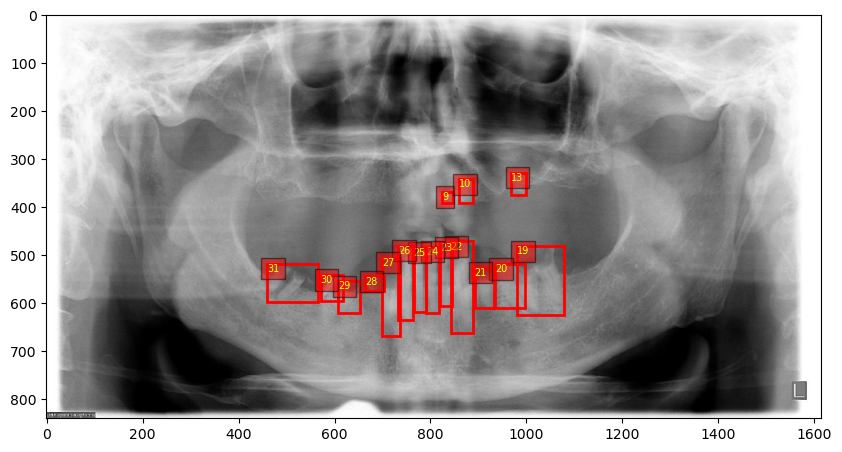

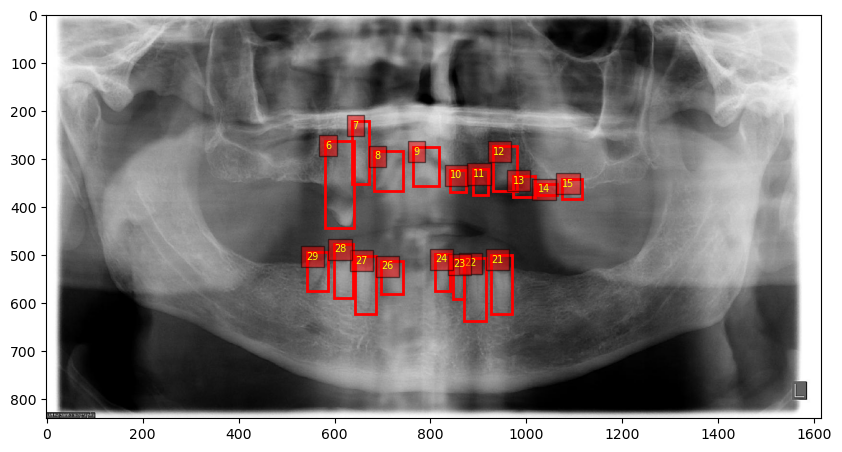

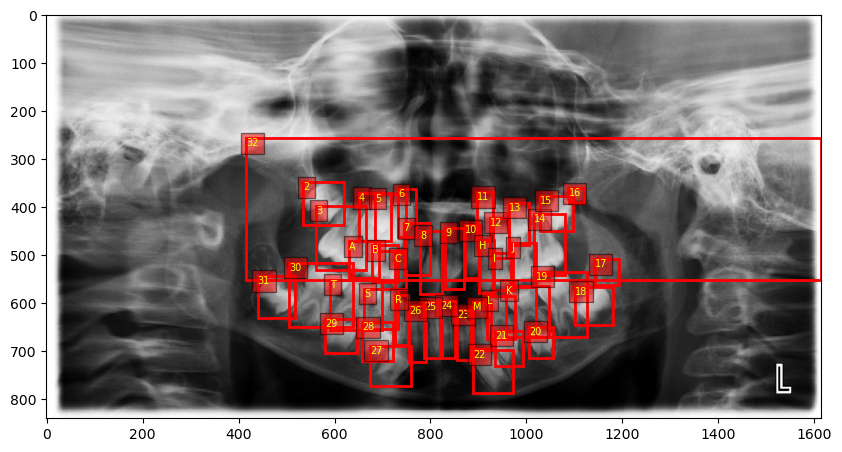

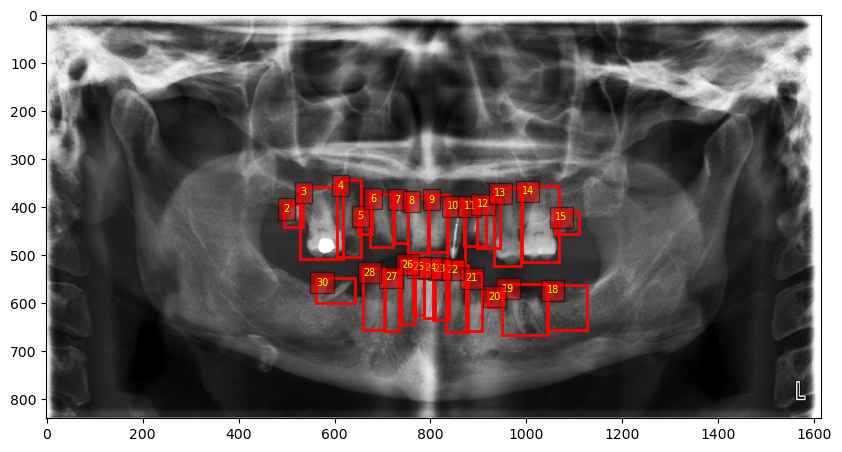

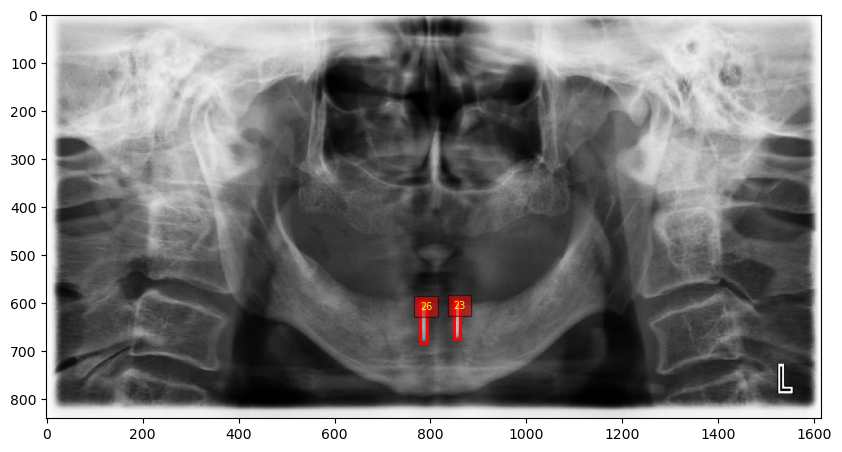

In [363]:
# Find the index of the row with the largest bounding box size
tufts_small5_bboxes = tufts_bboxes_enlarged.loc[((tufts_bboxes_enlarged['x2'] - tufts_bboxes_enlarged['x1']) * (tufts_bboxes_enlarged['y2'] - tufts_bboxes_enlarged['y1'])).replace(0, np.nan).dropna().sort_values().head(5).index]

for i in range(5):
	plot_image_with_bboxes_from_dataset(tufts_bboxes_df, TUFTS_RAW_DATASET_DIR, tufts_small5_bboxes.filename.values[i])

Here again the first four samples are errors in the annotation, but the rest are just very small bounding boxes with very little context. We can keep those.

In [367]:
# Get the filenames and indexes that contain one of the filenames and classes form the top 2 largest bboxes
hitl_del_filenames_small = hitl_teeth[hitl_teeth['filename'].str.contains('|'.join("/" + hitl_small5_bboxes.tail(2).filename.str.split('.').str[0] + "_" + hitl_small5_bboxes.tail(2)["class"].astype(str) + ".jpg"))]['filename']
tufts_del_filenames_small = tufts_teeth[tufts_teeth['filename'].str.contains('|'.join("/" + tufts_small5_bboxes.head(4).filename.str.split('.').str[0] + "_" + tufts_small5_bboxes.head(4)["class"].astype(str) + ".jpg"))]['filename']

In [373]:
hitl_teeth = hitl_teeth.drop(hitl_del_filenames_small.index)
tufts_teeth = tufts_teeth.drop(tufts_del_filenames_small.index)

for filename in hitl_del_filenames_small:
	os.remove(filename)

for filename in tufts_del_filenames_small:
	os.remove(filename)

hitl_bboxes_enlarged = hitl_bboxes_enlarged.drop(hitl_small5_bboxes.tail(2).index)
hitl_bboxes_enlarged = hitl_bboxes_enlarged.drop(hitl_bboxes_enlarged[((hitl_bboxes_enlarged['x2'] - hitl_bboxes_enlarged['x1']) * (hitl_bboxes_enlarged['y2'] - hitl_bboxes_enlarged['y1'])) == 0].index)

tufts_bboxes_enlarged = tufts_bboxes_enlarged.drop(tufts_small5_bboxes.head(4).index)
tufts_bboxes_enlarged = tufts_bboxes_enlarged.drop(tufts_bboxes_enlarged[((tufts_bboxes_enlarged['x2'] - tufts_bboxes_enlarged['x1']) * (tufts_bboxes_enlarged['y2'] - tufts_bboxes_enlarged['y1'])) == 0].index)

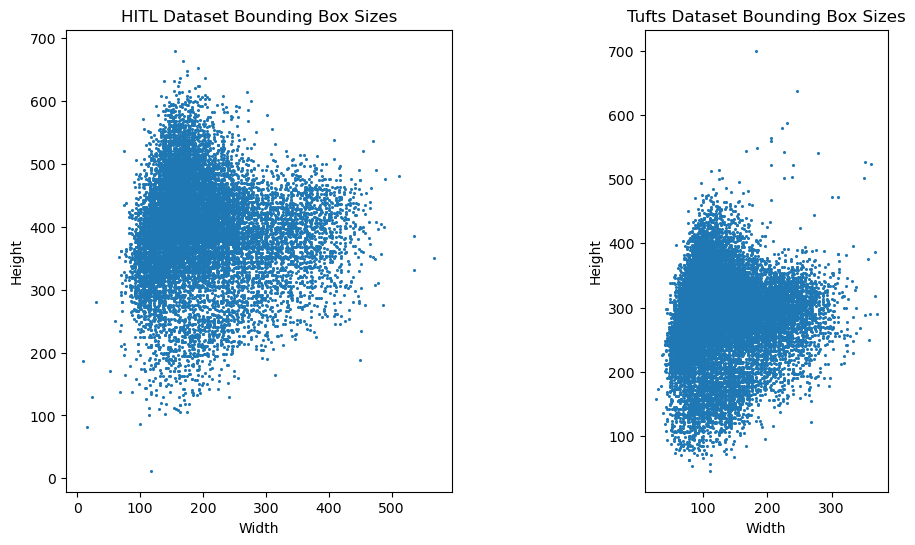

In [376]:
plot_hitl_tufts_widths_heights()

Now it appears that we have tackled most of the extreme outliers and based on manual inspection of the images we can see that the rest of them are just edge cases. Let's look at the sharpness of the images in both datasets.

In [378]:
def analyze_sharpness(img_path):
	"""
	Analyzes the sharpness of an image.

	Parameters:
	- img_path: The path of the image to analyze.

	Returns:
	- The sharpness of the image.
	"""
	image = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
	return cv2.Laplacian(image, cv2.CV_64F).var()

def analyze_sharpness_df(df):
	"""
	Analyzes the sharpness of all images in a dataframe.

	Parameters:
	- df: The dataframe containing the image filenames.

	Returns:
	- A dataframe containing the sharpness of all images.
	"""
	sharpness_df = pd.DataFrame(columns=["filename", "sharpness"])
	for index, row in tqdm(df.iterrows(), total=len(df), desc="Analyzing sharpness"):
		sharpness_df.loc[len(sharpness_df)] = [row["filename"], analyze_sharpness(row['filename'])]
	return sharpness_df

hitl_sharpness_df = analyze_sharpness_df(hitl_teeth)

Analyzing sharpness: 100%|██████████| 15282/15282 [01:43<00:00, 148.09it/s]


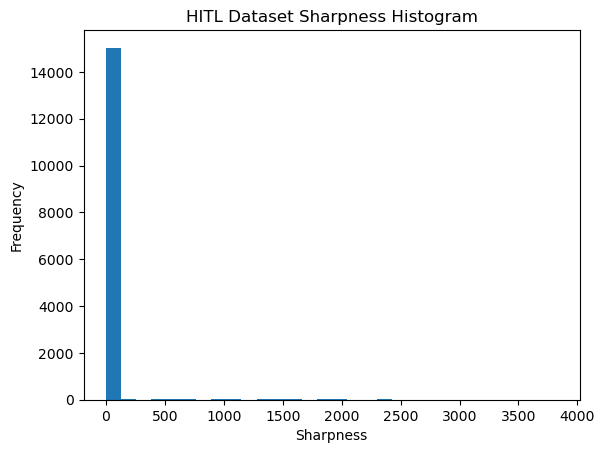

count    15282.000000
mean        42.380628
std        207.005562
min          2.452276
25%         12.707981
50%         17.246008
75%         24.928743
max       3828.119684
Name: sharpness, dtype: float64

In [394]:
plt.hist(hitl_sharpness_df["sharpness"], bins=30)
plt.title("HITL Dataset Sharpness Histogram")
plt.xlabel("Sharpness")
plt.ylabel("Frequency")
plt.show()

hitl_sharpness_df["sharpness"].describe()

The histogram and descriptive statistics show a distribution that is skewed towards the lower end of the sharpness scale. The vast majority of images have a very low sharpness value, as evidenced by the high frequency of values close to zero in the histogram and the low mean sharpness value of 42.38 The presence of a significant standard deviation (207.00) compared to the mean suggests that there is a wide range of sharpness values within the dataset, but most are clustered around a low sharpness level. The median sharpness value (17.25) is lower than the mean, reinforcing the skew towards lower sharpness levels.
Since the median is less affected by outliers, it suggests that more than half of the images have a sharpness value below 17.25, indicating a generally low sharpness across the dataset. The concentration of images with low sharpness might indicate that many images are blurry or lack detail, which could pose challenges for our image recognition task. In conclusion the HITL dataset contains images that are predominantly of low sharpness, with some outliers that are extremely sharp. Since the sharpness of the images is a very important factor for our model, we will need to do some preprocessing to improve the sharpness of the images. Let's look at the Tufts dataset.

In [399]:
tufts_sharpness_df = analyze_sharpness_df(tufts_teeth)

Analyzing sharpness: 100%|██████████| 26000/26000 [03:14<00:00, 133.64it/s]


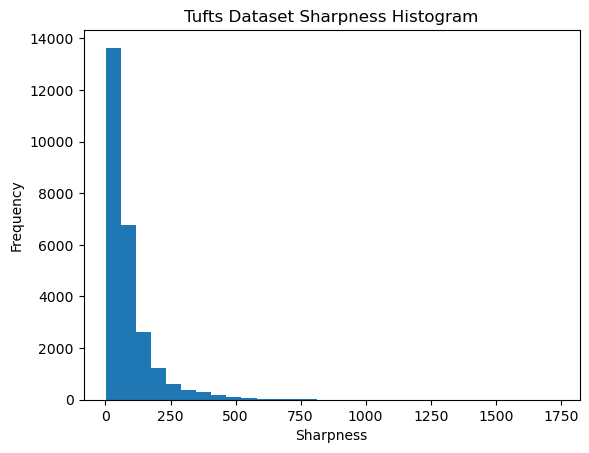

count    26000.000000
mean        90.395793
std         95.577354
min          2.749231
25%         38.713574
50%         58.090051
75%        104.515656
max       1735.834412
Name: sharpness, dtype: float64

In [401]:
plt.hist(tufts_sharpness_df["sharpness"], bins=30)
plt.title("Tufts Dataset Sharpness Histogram")
plt.xlabel("Sharpness")
plt.ylabel("Frequency")
plt.show()

tufts_sharpness_df["sharpness"].describe()

Here the mean sharpness is more than double of the other dataset. That suggests that, on average, the images in the Tufts dataset are sharper. The histogram still shows a right-skewed distribution, with a steep drop-off asss sharpness values increase. However the spread here is wider and the frequencies decrease more gradually. The standard deviation in the Tufts dataset is lower relative to its mean (95.58 compared to 90.40) than in the HITL dataset (207.00 compared to 42.38), indicating that the sharpness values in the Tufts dataset are less dispersed around the mean. The median sharpness value of the Tufts dataset is higher (58.09) than that of the HITL dataset (17.25), indicating that the central tendency of sharpness is higher in the Tufts dataset. While the Tufts dataset also has outliers (max sharpness is 1735.83), the range is not as extreme as in the HITL dataset (max sharpness is 3828.12). This might indicate fewer issues with extreme outliers in the Tufts dataset. Given the higher mean and median sharpness values, the Tufts dataset might require less preprocessing for image enhancement. The images may have more detail and require less sharpening overall. Now we can also try to analyze the brightness of the images.

In [403]:
def analyze_brightness(img_path):
	"""
	Analyzes the brightness of an image.

	Parameters:
	- img_path: The path of the image to analyze.

	Returns:
	- The brightness of the image.
	"""
	image = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
	return np.mean(image)

def analyze_brightness_df(df):
	"""
	Analyzes the brightness of all images in a dataframe.

	Parameters:
	- df: The dataframe containing the image filenames.

	Returns:
	- A dataframe containing the brightness of all images.
	"""
	brightness_df = pd.DataFrame(columns=["filename", "brightness"])
	for index, row in tqdm(df.iterrows(), total=len(df), desc="Analyzing brightness"):
		brightness_df.loc[len(brightness_df)] = [row["filename"], analyze_brightness(row['filename'])]
	return brightness_df

hitl_brightness_df = analyze_brightness_df(hitl_teeth)
tufts_brightness_df = analyze_brightness_df(tufts_teeth)

Analyzing brightness: 100%|██████████| 26000/26000 [00:43<00:00, 593.71it/s]


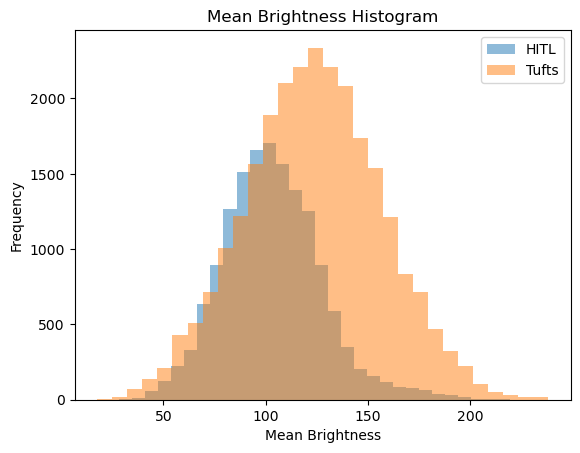

(count    15282.000000
 mean       103.350351
 std         24.280400
 min         28.333133
 25%         87.010368
 50%        101.997282
 75%        117.977744
 max        219.674508
 Name: brightness, dtype: float64,
 count    26000.000000
 mean       123.449568
 std         33.151026
 min         17.673598
 25%        101.007239
 50%        123.460931
 75%        145.744063
 max        238.164275
 Name: brightness, dtype: float64)

In [407]:

# Plot histogram for HITL dataset
plt.hist(hitl_brightness_df["brightness"], bins=30, alpha=0.5, label="HITL")
# Plot histogram for Tufts dataset
plt.hist(tufts_brightness_df["brightness"], bins=30, alpha=0.5, label="Tufts")

plt.title("Mean Brightness Histogram")
plt.xlabel("Mean Brightness")
plt.ylabel("Frequency")
plt.legend()

plt.show()

hitl_brightness_df["brightness"].describe(), tufts_brightness_df["brightness"].describe()

Both histograms exhibit a roughly normal distribution, but the Tufts dataset has a wider spread of brightness levels compared to the HITL dataset .The medians are fairly close to the means in both datasets, suggesting a symmetric distribution around the center. Tufts has a median very close to its mean (123.46), indicating a balanced distribution around the center value.
 The differences in brightness between the two datasets might necessitate normalization or standardization of brightness levels if combining datasets for training.
The higher mean brightness in the Tufts dataset might affect contrast and visibility of features differently than in the HITL dataset.
The overall higher brightness levels in the Tufts dataset could influence image analysis and feature extraction.

In [409]:
hitl_brightness_df["class"] = hitl_brightness_df["filename"].apply(lambda filename: filename.split("/")[-1].split("_")[1].split(".")[0])

We can also analyze the distributions of pixes intensities across different classes. This can reveal if certain classes have consistently brighter or darker images.

In [428]:
numeric_keys = []
alpha_keys = []

for key in grouped_brightness.groups.keys():
	try:
		numeric_keys.append(int(key))
	except ValueError:
		alpha_keys.append(key)

sorted_classes = sorted(numeric_keys) + sorted(alpha_keys)

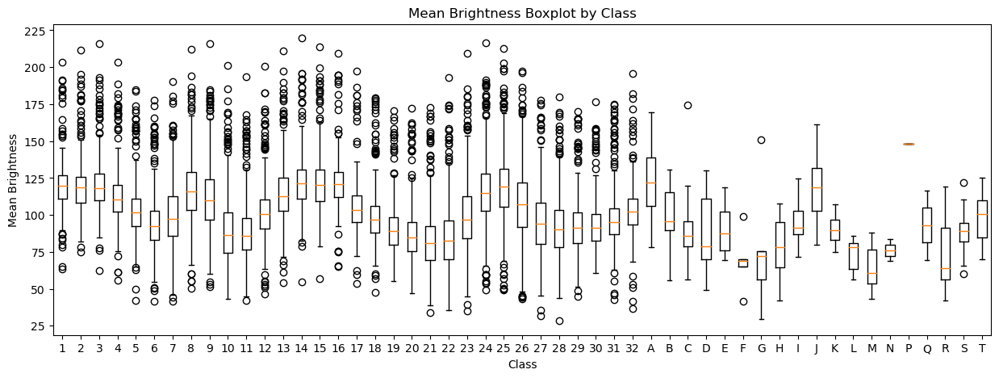

In [430]:
# Group the brightness data by class
grouped_brightness = hitl_brightness_df.groupby("class")

# Create a boxplot for each class
fig, ax = plt.subplots()
ax.boxplot([grouped_brightness.get_group(str(class_name))["brightness"] for class_name in sorted_classes])
ax.set_xticklabels(sorted_classes)
ax.set_xlabel("Class")
ax.set_ylabel("Mean Brightness")
ax.set_title("Mean Brightness Boxplot by Class")
fig.set_size_inches(15, 5)
plt.show()


There is noticeable variability in brightness across different classes, with some classes showing a wider range of brightness values than others, as indicated by the length of the boxplots.
The median brightness, indicated by the line within each box, varies across classes but does not show extreme variations. Most medians are within a moderate range of brightness levels, suggesting no class is consistently too bright or too dark across all samples.
The interquartile ranges (IQRs) for most classes are quite broad, suggesting variability in mean brightness within each class. However, the median values (indicated by the line within each box) are fairly consistent across classes, suggesting that while individual images may vary, the overall brightness by class does not differ dramatically.
Some classes show a skew in the distribution of brightness. For instance, classes like 'A', 'G', and 'S' show a longer whisker in the upper range, indicating a skew towards higher brightness levels.

While there is variability within classes, there does not seem to be a substantial difference in brightness between classes, as the medians appear to be within a similar range.
Given the spread and outliers, brightness normalization across all images might help reduce variability and improve the performance of image processing algorithms.
The presence of outliers both on the lower and upper ends suggests varying image quality that might need to be addressed during preprocessing to ensure that models are not biased by exposure levels.




### EDA Summary

Throughout the Exploratory Data Analysis (EDA) of our dental image datasets (HITL and Tufts), we have gathered valuable insights into class distribution, visual characteristics, and image size and quality:

**Class Distribution Analysis:**

- Both datasets exhibit class imbalance, with certain classes having significantly more samples than others. The HITL dataset displays a more uniform distribution among the most frequent classes, while the Tufts dataset has a steeper decline in class frequency.
- The presence of class imbalance suggests a potential need for resampling strategies, weighted loss functions, or data augmentation to ensure that machine learning models do not become biased toward overrepresented classes.

**Image Size and Quality Analysis:**

- Scatter plots of bounding box sizes from both datasets indicated a wide range of object sizes, with the HITL dataset showing more variability. This suggests that models will need to handle objects of varying scales or that normalization of object sizes during preprocessing could be beneficial.
- The sharpness analysis revealed that, on average, the Tufts dataset images are sharper than those in the HITL dataset, though both sets had outliers indicating some extremely sharp or unsharp images.
- Brightness analysis showed a higher average brightness in the Tufts dataset and a wide spread in brightness levels across both datasets. Each class within the datasets also exhibited a broad range of brightness, with numerous outliers suggesting varying image quality.


In summary, the EDA has revealed that while there is significant variability in terms of class representation, image size, sharpness, and brightness, the datasets also exhibit enough commonalities to suggest that careful preprocessing could make them suitable for training robust machine learning models. Strategies to address the identified issues include normalization of brightness and sharpness, augmentation to account for class imbalance, and potentially resizing images to a consistent scale. The insights from the EDA will guide the preprocessing steps to enhance model training and predictive performance.

## Data Preprocessing

Based on our EDA we can define the preprocessing steps, which we are going to take one by one. We will use MLFlow to document the whole process and configure a whole preprocessing pipeline.

In [432]:
mlflow.set_experiment("Teeth_Image_Preprocessing")

2023/11/21 12:01:37 INFO mlflow.tracking.fluent: Experiment with name 'Teeth_Image_Preprocessing' does not exist. Creating a new experiment.


<Experiment: artifact_location='file:///c:/Users/kaloy/Desktop/Projects/AI%20Module%202023%20%40%20SoftUni/Softuni-Data-Science/final-project/mlruns/294191336819750293', creation_time=1700560897035, experiment_id='294191336819750293', last_update_time=1700560897035, lifecycle_stage='active', name='Teeth_Image_Preprocessing', tags={}>

### 1. Resampling or Data Augmentation:
	
We should address the class imbalance identified in the datasets. We can do that by either resampling the data or augmenting it. Let's look again at the class distribution of our data.

In [696]:
combined_teeth = pd.concat([hitl_teeth, tufts_teeth])
combined_teeth["class"].value_counts()

class
22    1517
27    1512
25    1501
23    1495
24    1494
26    1488
28    1421
11    1409
6     1408
9     1400
8     1396
21    1395
10    1375
7     1373
20    1342
29    1306
12    1306
15    1285
2     1271
5     1248
14    1247
3     1247
4     1238
13    1208
31    1205
18    1196
30    1126
19    1117
17     701
32     696
16     685
1      681
Name: count, dtype: int64

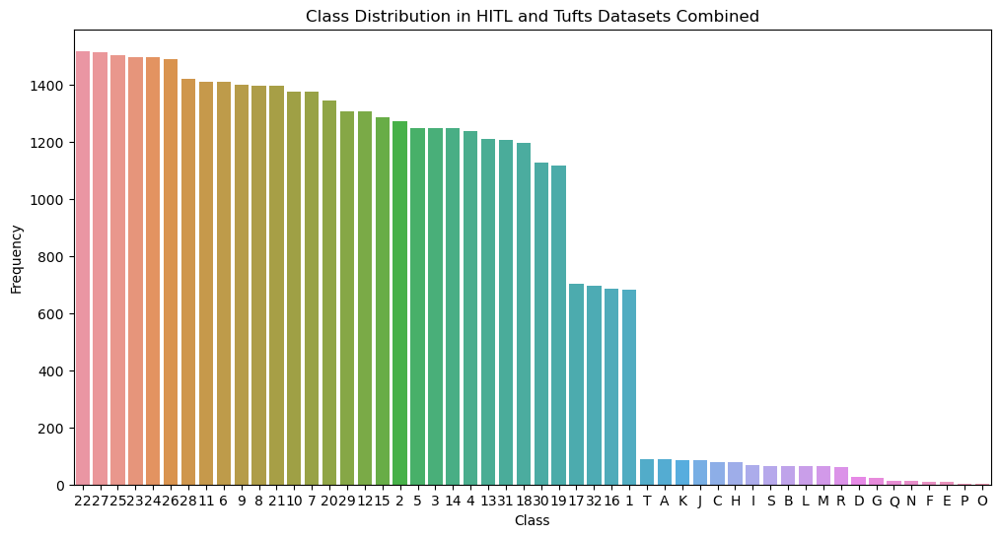

In [446]:
class_counts_combined = combined_teeth['class'].value_counts()

plt.figure(figsize=(12, 6))
sns.barplot(x=class_counts_combined.index, y=class_counts_combined.values)
plt.title('Class Distribution in HITL and Tufts Datasets Combined')
plt.xlabel('Class')
plt.ylabel('Frequency')
plt.show()

The class distribution plot for the combined HITL and Tufts datasets shows that milk teeth classes are significantly underrepresented compared to permanent teeth classes. The scarcity of samples for milk teeth would likely lead to poor model performance on these classes due to insufficient data to learn meaningful patterns, leading to overfitting and unreliable predictions. Given the stark class imbalance, even advanced resampling or augmentation techniques may not suffice to address the deficiency of milk teeth data effectively. Therefore, removing these classes can streamline the model's training process, reduce complexity, and ensure more reliable and interpretable results for the well-represented classes. This action is further justified by the need to allocate resources efficiently and to maintain the ethical standards required for potential clinical applications, where accurate predictions are critical. Any patterns potentially learned from the milk teeth samples may not be representative of the broader population and could lead to erroneous predictions and a very biased model. Therefore, we will remove the milk teeth classes from both datasets.

In [482]:
# Log the initial class distribution to MLflow
mlflow.start_run(run_name="Remove_Milk_Teeth")
for class_label, count in class_counts_combined.items():
  mlflow.log_metric(f"initial_combined_count_{class_label}", count)

As a formal threshold we can use the following rule of thumb: if a class has less than 0.5% of the total samples, we can remove it. In our case this turns out to be:

In [457]:
removal_threshold = len(combined_teeth) * 0.005
removal_threshold

206.41

Now we can preform the actual removal of the milk teeth classes and log the results in MLFlow.

In [464]:
# Remove milk teeth from enlarged dataframes
tufts_bboxes_enlarged = tufts_bboxes_enlarged[~tufts_bboxes_enlarged["class"].str.isalpha()]
hitl_bboxes_enlarged = hitl_bboxes_enlarged[~hitl_bboxes_enlarged["class"].astype(str).str.isalpha()]

# Remove milk teeth from _teeth dataframes
hitl_teeth = hitl_teeth[~hitl_teeth['class'].str.isalpha()]
tufts_teeth = tufts_teeth[~tufts_teeth['class'].str.isalpha()]


# Filter out milk teeth classes from combined dataframe
combined_milk_teeth_mask = combined_teeth['class'].str.isalpha()

# Delete files corresponding to milk teeth classes
for index, row in combined_teeth[combined_milk_teeth_mask].iterrows():
	file_path = row['filename']
	os.remove(file_path)

mlflow.log_param("removed_classes", class_counts_combined.index.str.isalpha().sum())
mlflow.log_param("removed_samples", len(combined_teeth[combined_milk_teeth_mask]))

# Remove milk teeth from combined dataframe
combined_teeth = combined_teeth[~combined_milk_teeth_mask]

In [488]:
for class_label, count in class_counts_combined[class_counts_combined.index.str.isalpha()].items():
  mlflow.log_metric(f"removed_count_{class_label}", count)

Let's look at and log the new class distribution.

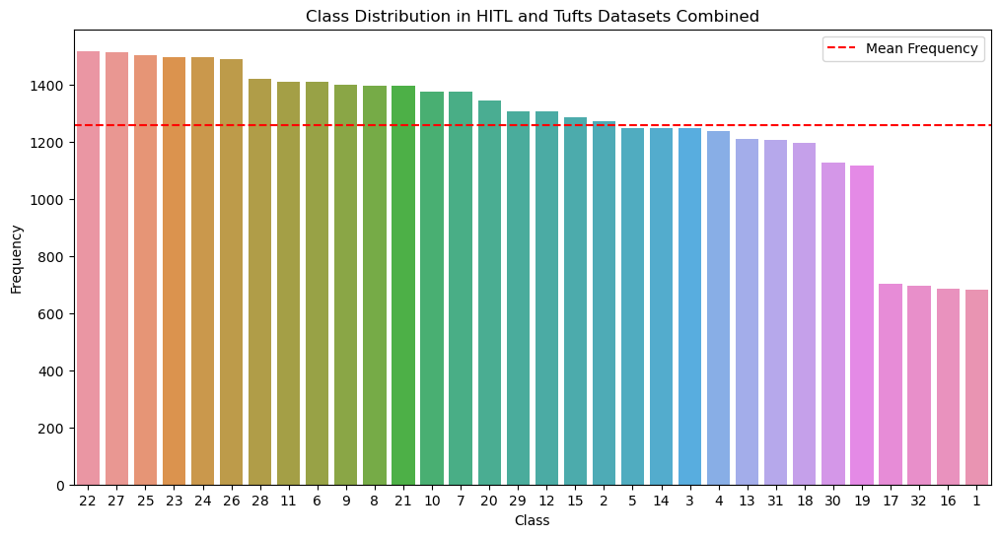

In [497]:
new_counts_combined = combined_teeth['class'].value_counts()

for class_label, count in new_counts_combined.items():
	mlflow.log_metric(f"post_removal_count_{class_label}", count)

plt.figure(figsize=(12, 6))
sns.barplot(x=new_counts_combined.index, y=new_counts_combined.values)
plt.axhline(y = new_counts_combined.mean(), color = 'r', linestyle = '--', label="Mean Frequency")
plt.title('Class Distribution in HITL and Tufts Datasets Combined')
plt.xlabel('Class')
plt.ylabel('Frequency')
plt.legend()
plt.show()
mlflow.end_run()

Now here we still have a class imbalance, but it is not as severe as before - it is something we can work with. We can try to address it by augmenting the data, so that all classes have close to the same amount of samples. But first we need to read the images from their files.

In [531]:
raw_teeth_images = pd.concat([hitl_teeth, tufts_teeth])
raw_teeth_images["image"] = raw_teeth_images["filename"].apply(lambda filename: cv2.imread(filename, cv2.IMREAD_GRAYSCALE))

We can now apply proper augmentations to all of the classes, which have a number of samples less than the mean number of samples per class. We will use the `albumentations` library for that. We will use the following augmentations: 
- Random Crops (up to 10% of the image)
- Random Gaussian Blur in 30% of the cases with sigma between 0 and 0.05
- Linear Contrast between 0.85 and 1.3
- Additive Gaussian Noise with mean 0 and std 0.05 * 255
- Affine Transformations:
	- scale between 0.95 and 1.05
	- translation between -0.05 and 0.05
	- rotation between -5 and 5 degrees
	- shear between -5 and 5 degrees

We don't have any flippings, because the orientation of the tooth is key for it's class. That is why also the rotation and sheer is very minimal. Let's go over the augmentations one by one to see if they are ok.

In [632]:
mlflow.start_run(run_name = "Image_Augmentation")
augmentations_seq = iaa.Sequential([
    iaa.Crop(percent=(0, 0.1)),  # random crops
])

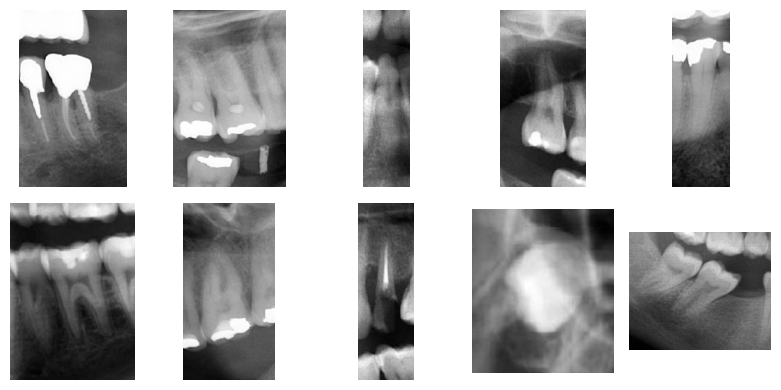

In [600]:
def test_augmentation(seq, images):
	# Create a grid of subplots
	fig, axes = plt.subplots(nrows=2, ncols=5, figsize=(8, 4))

	images = seq(images=images)
	# Flatten the axes array for easy iteration
	axes = axes.flatten()

	# Iterate over the augmented images and plot them in subplots
	for i, image in enumerate(images):
		axes[i].imshow(image.squeeze(), cmap='gray')
		axes[i].axis('off')

	# Adjust the spacing between subplots
	plt.tight_layout()

	# Show the plot
	plt.show()

aug_samples = list(raw_teeth_images.sample(10).image.apply(lambda image: np.expand_dims(image, axis=-1)).values)
test_augmentation(augmentations_seq, aug_samples)

We can see that a 0.1 crop is barely noticeable, so we can safely increase it to 0.2.

In [633]:
augmentations_seq[0] = iaa.Crop(percent=(0, 0.2))
mlflow.log_param("crop_percent", 0.2)

Now let's take a look at the gaussian blur.

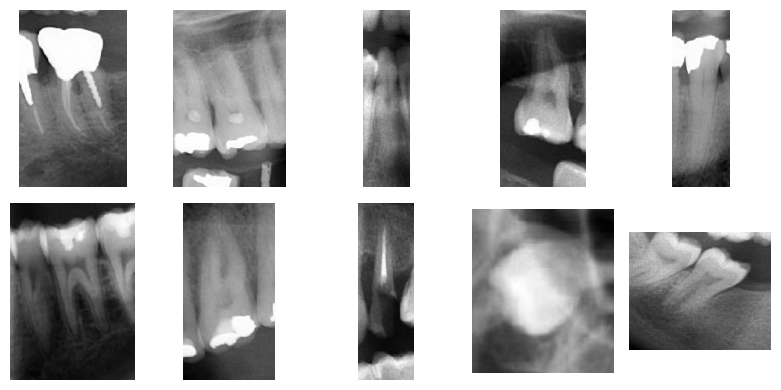

In [634]:
augmentations_seq.append(iaa.Sometimes(0.3, iaa.GaussianBlur(sigma=(0, 0.05))))
test_augmentation(augmentations_seq, aug_samples)

We can see that the gaussian blur is very subtle, but still noticeable on some of the samples, so we can keep that.

In [622]:
mlflow.log_param("blur_percentage", 0.3)
mlflow.log_param("blur_sigma", 0.05)

0.05

The next augmentation is the contrast one.

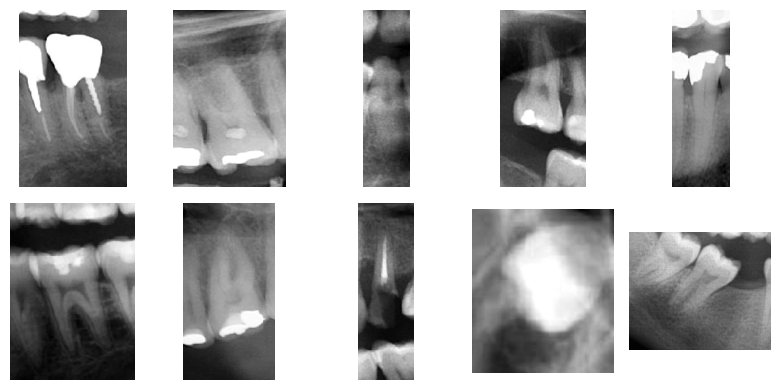

In [635]:
augmentations_seq.append(iaa.LinearContrast((0.85, 1.3)))
test_augmentation(augmentations_seq, aug_samples)

Here the contrast settings are are a bit strong on the upper boundary, so we can decrease it to 1.15 - symetrically to the lower boundary.

In [636]:
augmentations_seq[2] = iaa.LinearContrast((0.85, 1.15))

In [623]:
mlflow.log_param("contrast_min", 0.85)
mlflow.log_param("contrast_max", 1.15)

1.15

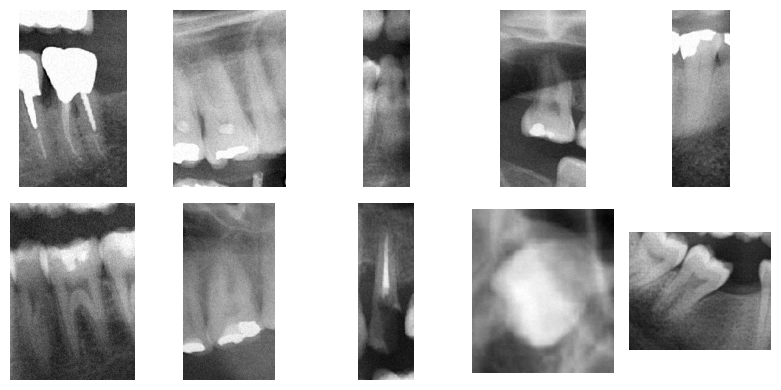

In [637]:
augmentations_seq.append(iaa.AdditiveGaussianNoise(loc=0, scale=(0.0, 0.05*255), per_channel=0.5))
test_augmentation(augmentations_seq, aug_samples)

The gaussian noise is also very subtle, so we can keep it.

In [625]:
mlflow.log_param("noise_loc", 0)
mlflow.log_param("noise_scale", (0.0, 0.05*255))
mlflow.log_param("noise_per_channel", 0.5)

0.5

Finally let's look at the affine transformation:

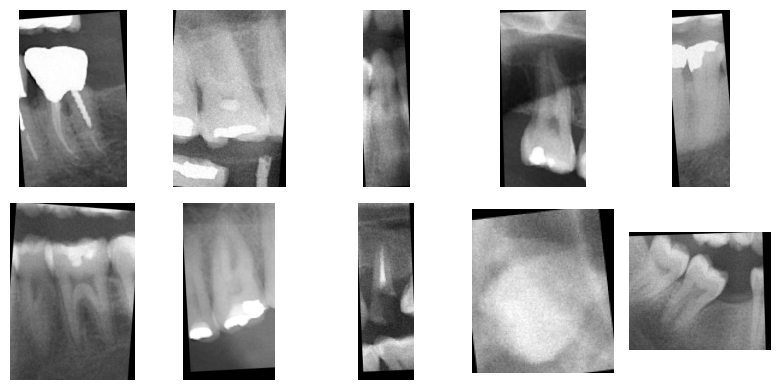

In [638]:
augmentations_seq.append(
    iaa.Affine(
        scale={"x": (0.95, 1.05), "y": (0.95, 1.05)},
        translate_percent={"x": (-0.05, 0.05), "y": (-0.05, 0.05)},
        rotate=(-5, 5),
        shear=(-5, 5)
    )
)
test_augmentation(augmentations_seq, aug_samples)

The transformations look okay, but we can limit the rotation by a few more degrees, so that it is more subtle.

In [640]:
augmentations_seq[4] = iaa.Affine(
        scale={"x": (0.95, 1.05), "y": (0.95, 1.05)},
        translate_percent={"x": (-0.05, 0.05), "y": (-0.05, 0.05)},
        rotate=(-3, 3),
        shear=(-5, 5)
    )
mlflow.log_param("affine_scale_x", (0.95, 1.05))
mlflow.log_param("affine_scale_y", (0.95, 1.05))
mlflow.log_param("affine_translate_x", (-0.05, 0.05))
mlflow.log_param("affine_translate_y", (-0.05, 0.05))
mlflow.log_param("affine_rotate", (-3, 3))
mlflow.log_param("affine_shear", (-5, 5))

(-5, 5)

Now that we have the finished augmentation sequence, we can use it to oversample the minority classes. We will do that by augmenting the minority classes until they reach the mean number of samples per class and log the results in MLFlow.

In [641]:
mlflow.end_run()

First let's log the mean number of samples per class.

In [642]:
mlflow.start_run(run_name="Data_Augmentation_Balancing")

# Assuming 'df' is your DataFrame with 'images' and 'class' columns
mean_sample_size = new_counts_combined.mean()

# Log the mean sample size
mlflow.log_metric("mean_sample_size", mean_sample_size)

Now we can define the augmentation function, which will increase the sample size by a given `target_size`

In [684]:
def augment_class(class_group, target_size, augmentations_seq):
	"""
	Augments a class group to match the target size.

	Parameters:
	- class_group: A series of images from the same class.
	- target_size: The target size of the group.
	- augmentations_seq: The augmentation sequence to apply to the images.

	Returns:
		- The augmented class group.
	"""
	additional_samples = int(target_size - len(class_group))
	if additional_samples <= 0:
		return class_group
	
	augmented_images = []
	samples_to_augment = class_group.sample(additional_samples)
	images_to_augment = list(samples_to_augment.image.apply(lambda image: np.expand_dims(image, axis=-1)).values)
	augmented_images = augmentations_seq(images=images_to_augment)
	augmented_df = pd.DataFrame({
	    'image': augmented_images.apply(lambda image: image.squeeze()),
	    'class': class_group.iloc[0]['class']
	})
	
	return pd.concat([class_group, augmented_df])

augment_class(raw_teeth_images.groupby('class').get_group("1"), mean_sample_size, augmentations_seq)

,filename,class,image
21,./data/humans_in_the_loop/d2/img/cropped/10_1.jpg,1,"[[84, 86, 88, 87, 84, 85, 90, 94, 91, 94, 90, ..."
65,./data/humans_in_the_loop/d2/img/cropped/101_1...,1,"[[142, 142, 143, 144, 145, 145, 145, 146, 144,..."
80,./data/humans_in_the_loop/d2/img/cropped/102_1...,1,"[[44, 42, 41, 43, 44, 45, 45, 46, 46, 46, 46, ..."
139,./data/humans_in_the_loop/d2/img/cropped/104_1...,1,"[[78, 77, 76, 77, 78, 78, 79, 80, 77, 79, 81, ..."
191,./data/humans_in_the_loop/d2/img/cropped/106_1...,1,"[[134, 137, 139, 139, 140, 139, 138, 139, 142,..."
...,...,...,...
573,NaN,1,"[[[0], [0], [0], [0], [0], [0], [0], [0], [0],..."
574,NaN,1,"[[[0], [0], [0], [0], [0], [0], [0], [0], [0],..."
575,NaN,1,"[[[0], [0], [0], [0], [0], [0], [0], [0], [0],..."
576,NaN,1,"[[[81], [116], [116], [113], [119], [127], [12..."


The above function takes a class in our dataframe and expands it ot have a given `target_size`. We can now use it to augment all of the classes, which have a number of samples less than the mean number of samples per class.

In [687]:
# Create an empty list to store the augmented dataframes
augmented_dataframes = []

# Iterate over each class label and its corresponding group in the dataframe
for class_label, group in raw_teeth_images.groupby('class'):
	# Log the size of the group before augmentation
	pre_augmentation_size = len(group)
	mlflow.log_metric(f"pre_augmentation_size_class_{class_label}", pre_augmentation_size)
	
	# Check if the size of the group is less than the mean sample size
	if pre_augmentation_size < mean_sample_size:
		# Augment the class group to match the mean sample size
		augmented_class_df = augment_class(group, mean_sample_size, augmentations_seq)
		
		# Log the size of the augmented class group
		post_augmentation_size = len(augmented_class_df)
		mlflow.log_metric(f"post_augmentation_size_class_{class_label}", post_augmentation_size)
		
		# Append the augmented class dataframe to the list of augmented dataframes
		augmented_dataframes.append(augmented_class_df)
	else:
		# If the size of the group is already greater than or equal to the mean sample size,
		# append the original group to the list of augmented dataframes
		augmented_dataframes.append(group)
  
# Concatenate all the augmented dataframes into a single dataframe
augmented_teeth_images = pd.concat(augmented_dataframes)

# Shuffle the augmented dataframe and reset the index
augmented_teeth_images = shuffle(augmented_teeth_images).reset_index(drop=True)

# End the MLflow run
mlflow.end_run()

Now we can look at the new distribution of the classes after the augmentation.

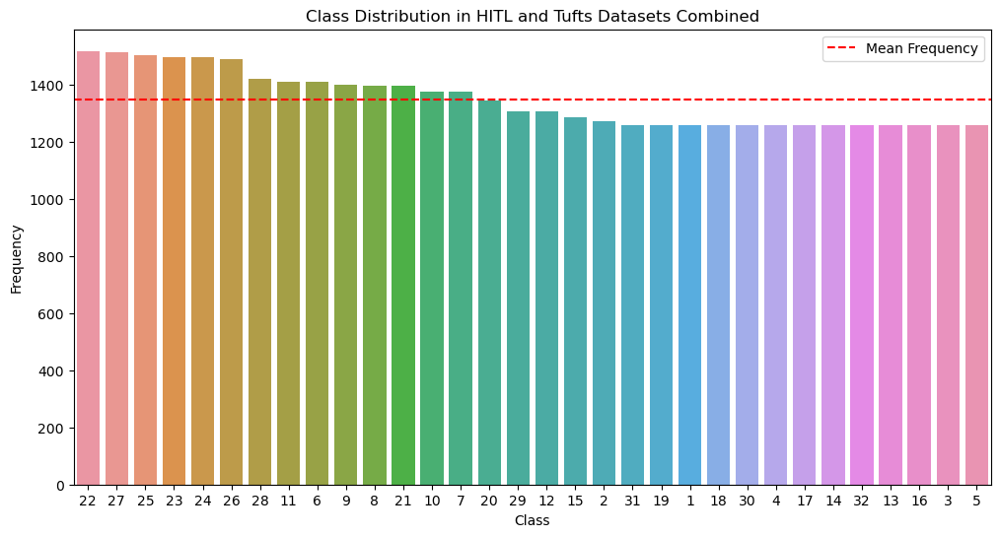

In [697]:
augmented_counts = augmented_teeth_images['class'].value_counts()

plt.figure(figsize=(12, 6))
sns.barplot(x=augmented_counts.index, y=augmented_counts.values)
plt.axhline(y = augmented_counts.mean(), color = 'r', linestyle = '--', label="Mean Frequency")
plt.title('Class Distribution in HITL and Tufts Datasets Combined')
plt.xlabel('Class')
plt.ylabel('Frequency')
plt.legend()
plt.show()

This distribution is a lot more balanced than the previous one. We can now save the augmented dataframes into separate files, so that we can load them later without having to read the data again.

In [944]:
# Define the file path for saving the pickled dataframe
file_path = './data/augmented_teeth_images.pkl'

# Pickle the augmented_teeth_images dataframe
with open(file_path, 'wb') as file:
	pickle.dump(augmented_teeth_images, file)

Now we can finally move on to the next preprocessing step: 

### 2. Resizing and standardization

To resize the images properly we need to choose a size, which will be the same for all of them. We can do that by looking at the distribution of the image sizes.

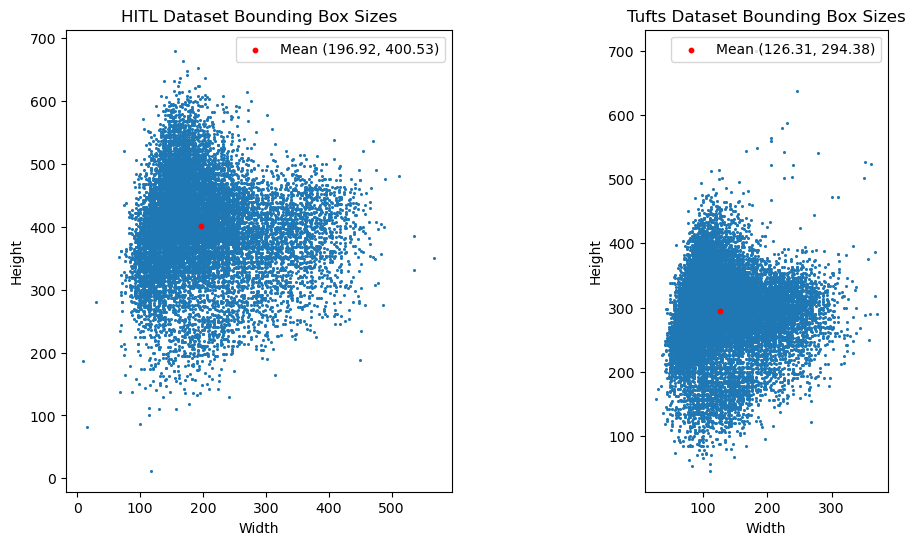

Tufts Dataset width and height statistics:
Widths: 
 count    25254.000000
mean       126.313614
std         50.765842
min         26.000000
25%         90.000000
50%        112.000000
75%        152.000000
max        370.000000
dtype: float64
Heights: 
 count    25254.000000
mean       294.378475
std         56.646724
min         46.000000
25%        266.000000
50%        300.000000
75%        328.000000
max        700.000000
dtype: float64
HITL Dataset width and height statistics:
Widths: 
 count    15035.000000
mean       196.921583
std         73.028112
min         10.000000
25%        146.000000
50%        178.000000
75%        228.000000
max        568.000000
dtype: float64
Heights: 
 count    15035.000000
mean       400.527835
std         75.462836
min         12.000000
25%        356.000000
50%        404.000000
75%        450.000000
max        680.000000
dtype: float64


In [523]:
tufts_widths, tufts_heights = tufts_bboxes_enlarged['x2'] - tufts_bboxes_enlarged['x1'], tufts_bboxes_enlarged['y2'] - tufts_bboxes_enlarged['y1']
hitl_widths, hitl_heights = hitl_bboxes_enlarged['x2'] - hitl_bboxes_enlarged['x1'], hitl_bboxes_enlarged['y2'] - hitl_bboxes_enlarged['y1']

plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.scatter(hitl_widths, hitl_heights, s=1.5)
plt.scatter(hitl_widths.mean(), hitl_heights.mean(), color="red", s=10, label=f"Mean ({hitl_widths.mean():.2f}, {hitl_heights.mean():.2f})")
plt.gca().set_aspect('equal', adjustable='box')
plt.title('HITL Dataset Bounding Box Sizes')
plt.xlabel('Width')
plt.ylabel('Height')
plt.legend()
plt.subplot(1, 2, 2)
plt.scatter(tufts_widths, tufts_heights, s=1.5)
plt.scatter(tufts_widths.mean(), tufts_heights.mean(), color="red", s=10, label="Mean ({:.2f}, {:.2f})".format(tufts_widths.mean(), tufts_heights.mean()))
plt.gca().set_aspect('equal', adjustable='box')
plt.title('Tufts Dataset Bounding Box Sizes')
plt.xlabel('Width')
plt.ylabel('Height')
plt.legend()
plt.show()

print("Tufts Dataset width and height statistics:")
print("Widths: \n", tufts_widths.describe())
print("Heights: \n", tufts_heights.describe())
print("HITL Dataset width and height statistics:")
print("Widths: \n", hitl_widths.describe())
print("Heights: \n", hitl_heights.describe())

**Width Consideration:**

The mean width of the Tufts dataset is approximately 126 pixels, and the HITL dataset is about 197 pixels. Since the HITL dataset has a larger mean and also a larger standard deviation, choosing a width closer to this dataset's mean would likely preserve more information across both datasets.
The median width (which is less affected by outliers) is 112 pixels for Tufts and 178 pixels for HITL. Considering the median is beneficial as it ensures that at least half the images in each dataset will not need to be enlarged, which can introduce blurriness.

**Height Consideration:**

The mean height for the Tufts dataset is around 294 pixels, and for the HITL dataset, it's approximately 401 pixels. Again, the HITL dataset demonstrates a larger dimension, suggesting a standard height closer to this mean might be more inclusive.
The median heights are 300 pixels for Tufts and 404 pixels for HITL. This suggests that a height just above 300 pixels would be a conservative choice that minimizes the need for upscaling.

**Computational Efficiency:**

Smaller images are faster to process and require less memory, which can be an important consideration if computational resources are limited.

**Resolution for Model Training:**

Machine learning models require sufficient resolution to learn features effectively. However, they also benefit from uniformity in input dimensions.
Based on these considerations, a good approach is to choose a size that is close to the median values while maintaining the aspect ratio. For instance, we might choose a width of around 150-180 pixels and a height of around 300-350 pixels. This would accommodate the bulk of our images without significant downscaling, while still being efficient for computation.

**So our final choice will be:**

- Width: 160 pixels (accommodates the majority of Tufts images without upscaling and minimizes downscaling for HITL images).
- Height: 320 pixels (close to the median for both datasets and maintains a reasonable aspect ratio when paired with the chosen width).

In [698]:
mlflow.start_run(run_name="Image_resizing")
mlflow.log_param("width", 160)
mlflow.log_param("height", 320)

320

Resizing will be the first step in our preprocessing pipeline. We will use the `cv2` library to resize the images.

In [108]:
preprocessing_pipeline = Pipeline([])

In [7]:
def resize_images(images, size=(160, 320)):
	"""
	Resizes an images to a given size.

	Parameters:
	- images: The image to resize.
	- size: The size to resize the image to.

	Returns:
	- The resized images.
	"""
	return np.array([cv2.resize(image, size) for image in images])

preprocessing_pipeline.steps.append(("resize", FunctionTransformer(resize_images, validate=False)))

The above function takes a list of images and resizes them appropriately. We have added it as the first step in our data preprocessing pipeline. Let's test it on some sample images.

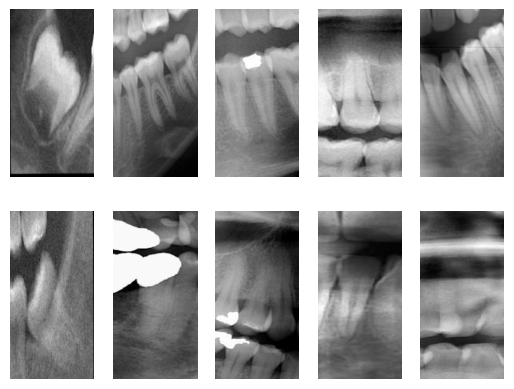

In [857]:
# Select a sample of 10 images from your dataset
sample_images = augmented_teeth_images['image'].sample(10).values

# Apply the preprocessing pipeline to the sample images
preprocessed_images = preprocessing_pipeline.transform(sample_images)

# Display the preprocessed images
for i, image in enumerate(preprocessed_images):
	plt.subplot(2, 5, i+1)
	plt.imshow(image, cmap='gray')
	plt.axis('off')

plt.show()
mlflow.end_run()

As we can see the resizing works correctly. Now we can work on the standardization of the images. It is preferred to use standardization instead of normalization, because it is more suitable for maximizing the effectiveness of PCA (which will be later discussed) and it will ensure that all pixels contribute equally to the analysis, regardless of their original variance. The only drawback here is that we lose the interpretability of the pixel values, but that is not a problem for us. We will use the `sklearn` library to standardize the images. But before we do that we need to flatten them into a 1D array.

In [6]:
def flatten_image(x):
  return x.reshape(x.shape[0], -1)

preprocessing_pipeline.steps.append(("flatten", FunctionTransformer(flatten_image)))
preprocessing_pipeline.steps.append(("standardization", StandardScaler()))

### 3. Contrast and Brightness Normalization

Next, we want to normalize the brightness levels across the dataset to reduce some variability. And also to adjust the contrast where necessary, especially for the images that are either too bright or too dark.
Brightness normalization typically involves adjusting the intensity of the pixels so that the image achieves a certain average brightness level. Contrast normalization, on the other hand, involves enhancing the differences in intensity between the different parts of the image. To do this we will need to define a custom sklearn transformer, which will do the normalizations, based on some predefined values.

In [5]:
class BrightnessContrastNormalizer(BaseEstimator, TransformerMixin):
    def __init__(self, brightness=0, contrast=0):
        # brightness range can be [-255,255], contrast range can be [-127,127]
        self.brightness = brightness
        self.contrast = contrast

    def fit(self, X, y=None):
        return self

    def transform(self, X, y=None):
        normalized_images = []
        for img in X:
            if self.brightness != 0:
                if self.brightness > 0:
                    shadow = self.brightness
                    highlight = 255
                else:
                    shadow = 0
                    highlight = 255 + self.brightness
                alpha_b = (highlight - shadow) / 255
                gamma_b = shadow

                img = cv2.addWeighted(img, alpha_b, img, 0, gamma_b)

            if self.contrast != 0:
                f = 131 * (self.contrast + 127) / (127 * (131 - self.contrast))
                alpha_c = f
                gamma_c = 127 * (1 - f)

                img = cv2.addWeighted(img, alpha_c, img, 0, gamma_c)

            normalized_images.append(img)

        return np.array(normalized_images)

In [921]:
mlflow.start_run(run_name="Brightness_Contrast_Normalization")

<ActiveRun: >

We can add the transformer to a test pipeline in order to see if it works correctly and so that we will be able to tune its parameters. Let's start with brightness = 10 and contrast = 30.

In [9]:
test_pipeline = Pipeline([
  ("resize", FunctionTransformer(resize_images, validate=False)),
  ('brightness_contrast_normalizer', BrightnessContrastNormalizer(brightness=10, contrast=30))
])

mlflow.log_metric("brightness", 10)
mlflow.log_metric("contrast", 30)

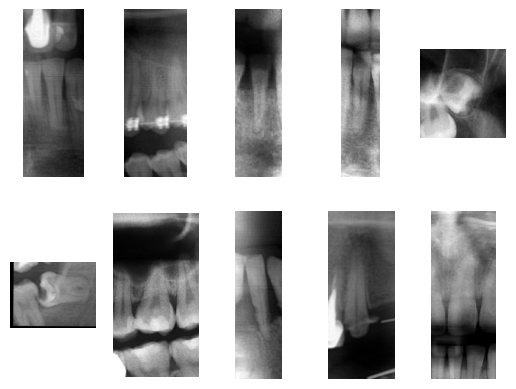

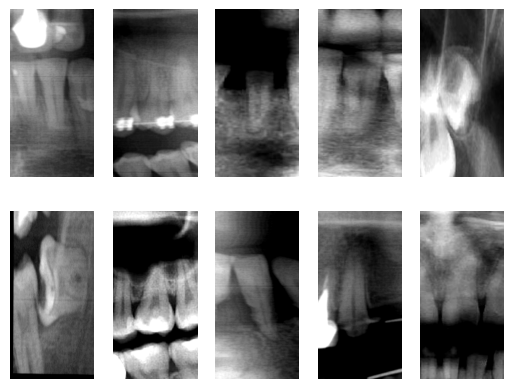

In [840]:
bc_images = test_pipeline.fit_transform(sample_images)

def display_10_images(images):
	for i, image in enumerate(images):
		plt.subplot(2, 5, i+1)
		plt.imshow(image, cmap='gray')
		plt.axis('off')
	plt.show()
  

display_10_images(sample_images)
display_10_images(bc_images)

As we can see the brightness might be a bit too low. Let's try with 60.

In [923]:
test_pipeline.steps[1] = ('brightness_contrast_normalizer', BrightnessContrastNormalizer(brightness=60, contrast=30))

mlflow.log_metric("brightness", 60)

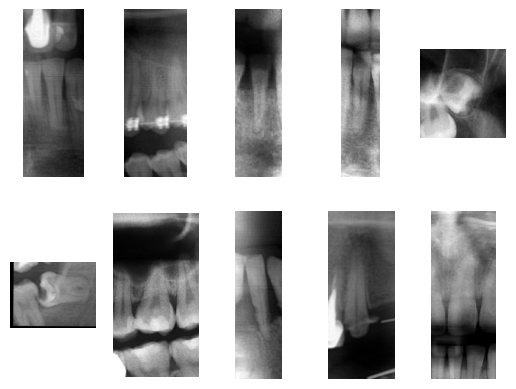

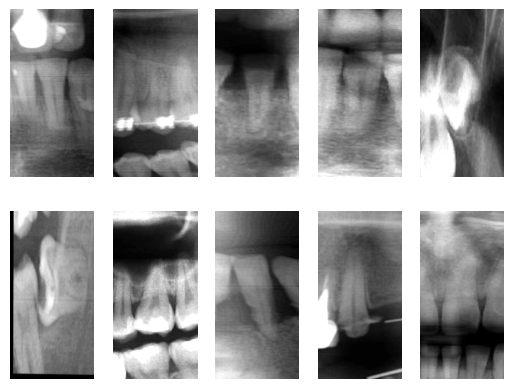

In [842]:
bc_images = test_pipeline.fit_transform(sample_images)  

display_10_images(sample_images)
display_10_images(bc_images)

Now this might be a bit too bright, but still better than the previous iteration. We will set it to 45. Now let's look at the contrast. Let's try to increase it to 60, to see how that looks.

In [12]:
test_pipeline.steps[1] = ('brightness_contrast_normalizer', BrightnessContrastNormalizer(brightness=45, contrast=60))

mlflow.log_metric("brightness", 45)
mlflow.log_metric("contrast", 60)

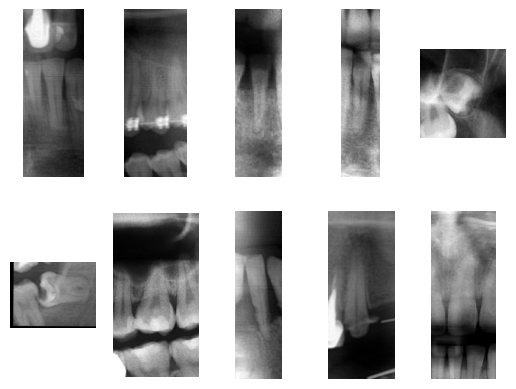

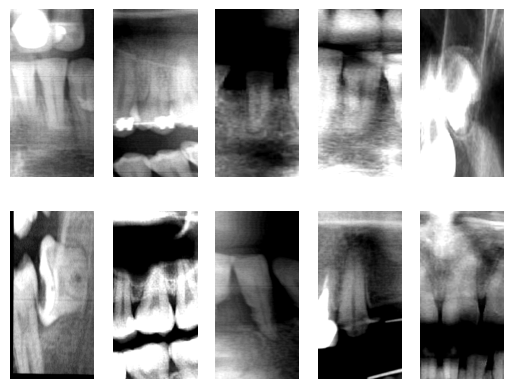

In [844]:
bc_images = test_pipeline.fit_transform(sample_images)  

display_10_images(sample_images)
display_10_images(bc_images)

Here the contrast is too high, we can now try to make it lower - 0.

In [10]:
test_pipeline.steps[1] = ('brightness_contrast_normalizer', BrightnessContrastNormalizer(brightness=45, contrast=0))

mlflow.log_metric("contrast", 0)

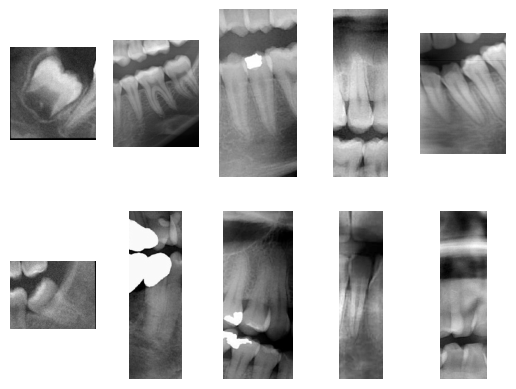

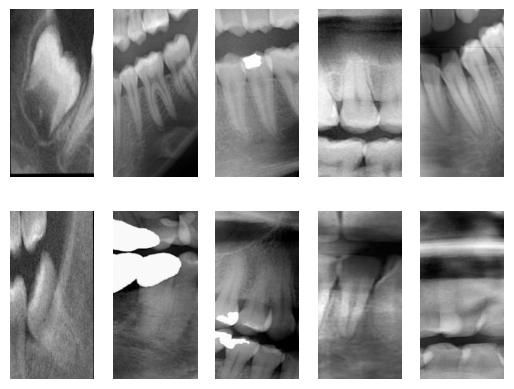

In [932]:
bc_images = test_pipeline.fit_transform(sample_images)  

display_10_images(sample_images)
display_10_images(bc_images)

Those are the best results so far. Now we can add the transformer to our pipeline. Now because this transformation is designed to work with 2D images with values between 0 and 255, we need to add it to the pipeline before the normalizer, so that it can work correctly.

In [111]:
preprocessing_pipeline.steps.insert(1, ("brightness_contrast_normalizer", BrightnessContrastNormalizer(brightness=45, contrast=0)))
mlflow.end_run()

### 4. Training, Validation and Test Split

Before we continue with the dimensionality reduction part of the preprocessing, we will need to split the data into training, validation and test sets. We will use the `train_test_split` function from `sklearn` to do that. Our dataset is fairly large, so we can afford to preform Cross Validation, which will make efficient use of it. This is why for now we will do a standard train-test split, which will be 70-15-15. We will use the `random_state` parameter to ensure reproducibility of the results.

In [8]:
augmented_teeth_images = joblib.load("./data/augmented_teeth_images.pkl")
preprocessing_pipeline = joblib.load("./preprocessing_pipeline.pkl")

In [9]:
augmented_teeth_df_train, augmented_teeth_df_temp = train_test_split(augmented_teeth_images, test_size=0.3, random_state=42, stratify=augmented_teeth_images["class"])
augmented_teeth_df_val, augmented_teeth_df_test = train_test_split(augmented_teeth_df_temp, test_size=0.5, random_state=42, stratify=augmented_teeth_df_temp["class"])

### 5. Dimensionality reduction

Each image in our dataset is represented by 320x160 pixels. This amounts to 51200 features. With tens of thousands of features per image, the computational complexity for training machine learning models increases significantly. This can lead to longer training times and higher computational resource requirements. High-dimensional data can lead to models that overfit, especially if the number of training samples is not sufficiently large compared to the number of features. This is known as the curse of dimensionality. To address this issue, we can reduce the dimensionality of our data by extracting features that capture the most important information. This can be done using dimensionality reduction techniques such as Principal Component Analysis (PCA). Reducing the dimensionality can help in removing noise and redundant information, potentially leading to improved model accuracy and generalization. Lower-dimensional representations of our data can also be more easily visualized and interpreted, helping in understanding the underlying patterns and relationships. PCA can be used to capture the most important information in our data by identifying the directions of maximum variance. It then projects the data onto these directions, resulting in a lower-dimensional representation of the data. The number of principal components (PCs) to keep can be specified as a hyperparameter. We can use the scikit-learn PCA implementation to perform dimensionality reduction on our data as the next step in our preprocessing pipeline.

Now we can apply PCA to our standardized flattened data without specifying the number of components. This will give us the explained variance ratio for each component, which we can later analyze. Because we have a lot of data, we will use the `IncrementalPCA` class, which will allow us to use the `partial_fit` method to fit the model in batches. This will allow us to save memory and time. But we need to choose an appropriate batch size. Let's try with 1000 as a start. This also means that we can get at most 1000 components with our PCA.

In [117]:
initial_incremental_pca = IncrementalPCA()
mlflow.start_run(run_name="PCA")
scaled_teeth_images_train = preprocessing_pipeline.fit_transform(augmented_teeth_df_train['image'])

In [31]:
batch_size = 1000
mlflow.log_param("batch_size", batch_size)

for i in tqdm(range(0, len(scaled_teeth_images_train), batch_size), desc="Fitting Incremental PCA"):
	initial_incremental_pca.partial_fit(scaled_teeth_images_train[i:i+batch_size])

Fitting Incremental PCA:   0%|          | 0/37 [00:00<?, ?it/s]

Fitting Incremental PCA: 100%|██████████| 37/37 [13:36<00:00, 22.07s/it]


Now that we have fitted our pca model, we can look at the explained variance ratio for each component.

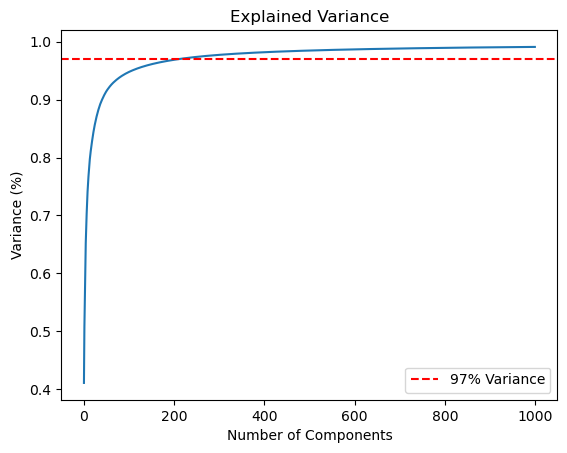

In [32]:
plt.figure()
plt.plot(np.cumsum(initial_incremental_pca.explained_variance_ratio_))
plt.axhline(y=0.97, color='r', linestyle='--', label="97% Variance")
plt.xlabel('Number of Components')
plt.ylabel('Variance (%)') # for each component
plt.title('Explained Variance')
plt.legend()
plt.show()

A good rule of thumb is to choose the number of components based on the "elbow" method. This means that we choose the number of components, where the explained variance ratio stops increasing significantly and the above curve starts to plateau. In our case this is around 100 components. But as we can see the explained variance ratio is still increasing, so we can try to increase the number of components to 250, which should get us around 97% explained variance ratio.

In [33]:
mlflow.log_param("n_components", 250)

250

In [34]:
mlflow.log_param("explained_variance_ratio", initial_incremental_pca.explained_variance_ratio_[:250].sum())

0.9738281700066835

So now we can refit our PCA model with the our chosen optimal number of components - 250. And also as the last fit ran without a problem, we can try to increase the batch size so that we have 15 equal batches (previously we had almost 30).

In [134]:
mlflow.end_run()

In [135]:
mlflow.start_run(run_name="Incremental PCA 250 components")
batch_number = 15
mlflow.log_param("batch_number", batch_number)
# We add one so that we can be sure that we have enough batches to cover the entire dataset
batch_size = len(scaled_teeth_images_train) // batch_number + 1
mlflow.log_param("batch_size", batch_size)

2010

In [142]:
optimal_incremental_pca = IncrementalPCA(n_components=250)

for i in tqdm(range(0, len(scaled_teeth_images_train), batch_size), desc="Fitting Incremental PCA"):
	optimal_incremental_pca.partial_fit(scaled_teeth_images_train[i:i+batch_size])

Fitting Incremental PCA: 100%|██████████| 15/15 [06:43<00:00, 26.93s/it]


In [143]:
mlflow.log_param("num_components", 250)
mlflow.log_param("explainned_variance_ratio", optimal_incremental_pca.explained_variance_ratio_.sum())

0.9733809740381912

Okay now we can add our PCA to the preprocessing pipeline.

In [146]:
preprocessing_pipeline.steps.append(("pca", optimal_incremental_pca))
mlflow.end_run()

And also let's save our fitted preprocessing pipeline.

In [149]:
joblib.dump(preprocessing_pipeline, './preprocessing_pipeline.pkl')

['./preprocessing_pipeline.pkl']

## Model Selection
### 1. Evaluation Metrics
For our classification task, accuracy might be a primary metric since all of our classes have similar importance, similar frequency and the number of classes is relatively high - 32. However it is not the only metric we should consider. We should also look at the precision and recall for each class, because we want to make sure that our model is not biased towards any of the classes. We can also look at the F1 score, which is a combination of precision and recall. Another thing which might be useful to consider is a confusion matrix, which will reveal to us which classes the model is confusing with each other.

In [152]:
mlflow.set_experiment("Teeth_Classification")

<Experiment: artifact_location='file:///c:/Users/kaloy/Desktop/Projects/AI%20Module%202023%20%40%20SoftUni/Softuni-Data-Science/final-project/mlruns/322438148740133692', creation_time=1700732170171, experiment_id='322438148740133692', last_update_time=1700732170171, lifecycle_stage='active', name='Teeth_Classification', tags={}>

### 2. Candidate Models
- **Logistic Regression**: It can serve as our baseline model. Even with high-dimensional data, it can be trained efficiently and can be used as a benchmark for more complex models.
- **Random Forest**: It is a good choice for classification tasks as they can handle a large number of features efficiently and can be parallelized for faster processing. It provides insights into which principal components are most influential in classification, which can be valuable for understanding your model. Due to the ensemble nature of Random Forests, they are less prone to overfitting, especially with a large number of trees.
- **Support Vector Machines**: SVMs are particularly effective in high-dimensional spaces. They can be very versatile, because of their ability to use different. However they can be very slow, so we will have to be careful with the hyperparameters we choose. It can also be parallelized, which will help with efficiency.

Because of our high number of features, simpler models will most likely struggle to capture the complex relationships in our data. Therefore we will focus on more sophisticated models.

### 3. Baseline model - Logistic Regression

For our baseline model we will train a simple Logistic regression model using cross-validation and grid search to find the best preforming candidate. This will give us a solid point for comparison with the other models. We will use the `LogisticRegression` class from `sklearn` to do that. We will use the `random_state` parameter to ensure reproducibility of the results. For our task the default Logistic regression score is very suitable, so for now we are going to use that for our grid search. We will use as a solver `sag`, which uses Stochastic Average Gradient descent. SAG is an optimization algorithm that combines the benefits of stochastic gradient descent with the stability of average gradient methods. It is particularly useful for large-scale optimization problems where SGD may be slow or unstable. We will also set the maximum number of iterations to 1000, so that we can be sure that the model will converge. We will use the `GridSearchCV` class from `sklearn` to do the grid search. The hyperparameter, which we will tune is C - the inverse of the regularization strength. Let's try with the following values: 0.001, 0.01, 0.1, 1, 10, 100, 1000. We will use 5-fold cross-validation to evaluate the models.

In [10]:
images_train = preprocessing_pipeline.transform(augmented_teeth_df_train['image'].values)
images_val = preprocessing_pipeline.transform(augmented_teeth_df_val['image'].values)
images_test = preprocessing_pipeline.transform(augmented_teeth_df_test['image'].values)

In [185]:
mlflow.start_run(run_name = "Logistic Regression Grid Search")
param_grid = {
    'C': [0.001, 0.01, 0.1, 1, 10, 100],  # Regularization strength
}
mlflow.log_param("param_grid", param_grid)
mlflow.log_param("solver", "sag")
mlflow.log_param("max_iter", 1000)
mlflow.log_param("multi_class", "multinomial")

log_reg = LogisticRegression(solver="sag", max_iter=1000, multi_class="multinomial", n_jobs=-1)
log_reg_grid_search = GridSearchCV(log_reg, param_grid, cv=5, verbose=10, n_jobs=-1)

In [186]:
log_reg_grid_search.fit(images_train, augmented_teeth_df_train["class"])

Fitting 5 folds for each of 6 candidates, totalling 30 fits


c:\Users\kaloy\Anaconda3\envs\teeth_project\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


GridSearchCV(cv=5,
             estimator=LogisticRegression(max_iter=1000,
                                          multi_class='multinomial', n_jobs=-1,
                                          solver='sag'),
             n_jobs=-1, param_grid={'C': [0.001, 0.01, 0.1, 1, 10, 100]},
             verbose=10)

Okay now that we have finished our grid search we can look at the results.

In [187]:
log_reg_grid_search.best_estimator_

LogisticRegression(C=0.001, max_iter=1000, multi_class='multinomial', n_jobs=-1,
                   solver='sag')

In [188]:
log_reg_grid_search.best_score_

0.6488285826644344

As expected the best score of the Linear regression isn't very high - almost 65%, but it is a good baseline for comparison. Now we can plot the mean test scores for each tested value of C, so that we can see how the model preforms with different amounts of regularization.

In [207]:
mlflow.log_metric("best_score", log_reg_grid_search.best_score_)
mlflow.log_param("best_params", log_reg_grid_search.best_params_)

{'C': 0.001}

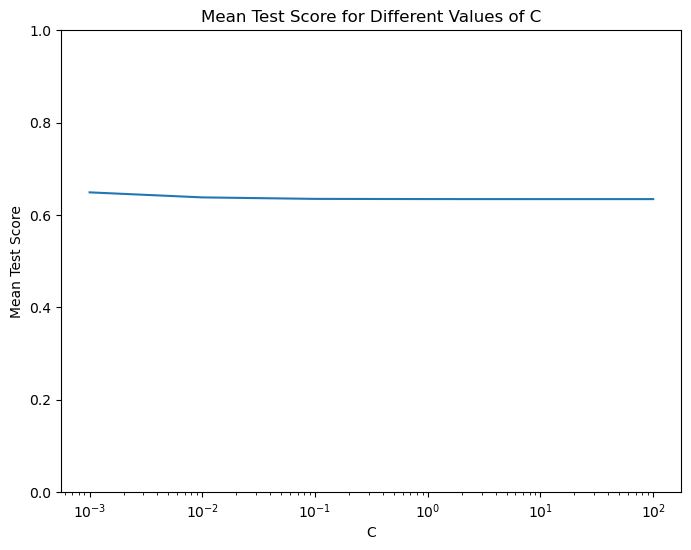

In [208]:
mean_scores = log_reg_grid_search.cv_results_['mean_test_score']

# Get the values of C
C_values = log_reg_grid_search.cv_results_['param_C']

# Create a DataFrame with the mean scores and corresponding C values
df_scores = pd.DataFrame({'C': C_values, 'Mean Test Score': mean_scores})

# Plot the box plot
plt.figure(figsize=(8, 6))
plt.plot(C_values.data, mean_scores)
plt.xscale("log")
plt.ylim([0.0, 1.0])
plt.xlabel('C')
plt.ylabel('Mean Test Score')
plt.title('Mean Test Score for Different Values of C')
plt.show()

In [191]:
log_reg_grid_search.cv_results_["std_test_score"]

array([0.00796321, 0.00873807, 0.00825652, 0.0080937 , 0.00817508,
       0.00817508])

Here we can see that the model preforms best with the smallest value of C - 0.001 and the highest amount of regularization, but the difference between the best and the worst score is not very big. This suggests that the model is somewhat robust to changes in the regularization strength. The standard deviation in the test scores is quite low, indicating consistent performance across the different cross-val folds. Let's save this model for later use.

In [192]:
joblib.dump(log_reg_grid_search.best_estimator_, './log_reg_best_estimator.pkl')
mlflow.log_artifact('./log_reg_best_estimator.pkl')

Let's look at some more metrics for our best model and this time use the validation set.

In [259]:
best_log_reg = log_reg_grid_search.best_estimator_
log_reg_val_acc = best_log_reg.score(images_val, augmented_teeth_df_val["class"])
log_reg_val_acc

0.6652732621148785

In [194]:
best_log_reg.score(images_train, augmented_teeth_df_train["class"])

0.7126268993431093

Here we can see that the model preforms considerably worse (~5%) on the validation data. This indicates that it has a problem with unseen data and overfits the training set to some degree. But the model still has a relatively small accuracy on the training set, which can be a sign of high bias.

In [236]:
best_log_reg_predictions = best_log_reg.predict(images_val)
best_log_reg_classification_report = classification_report(augmented_teeth_df_val["class"], best_log_reg_predictions, output_dict=True)	

best_log_reg_classification_report_df = pd.DataFrame(best_log_reg_classification_report).T
best_log_reg_classification_report_df = best_log_reg_classification_report_df.drop(["accuracy", "macro avg", "weighted avg"], axis=0)
best_log_reg_classification_report_df = best_log_reg_classification_report_df.sort_values(by="f1-score", ascending=False).round(2)
best_log_reg_classification_report_df

,precision,recall,f1-score,support
9,0.76,0.81,0.78,210.0
8,0.78,0.78,0.78,209.0
22,0.68,0.78,0.73,227.0
27,0.72,0.73,0.72,227.0
19,0.78,0.67,0.72,189.0
30,0.74,0.69,0.71,189.0
28,0.72,0.70,0.71,213.0
3,0.73,0.68,0.71,189.0
29,0.69,0.69,0.69,196.0
18,0.68,0.69,0.69,189.0


From the plot below and the table above we can see that the classes can be generally split into three groups based on their performance:
- High-Performance Classes (F1-score >= 0.70):
Classes 8, 9, 22, 27, 19, 30, 28 and 3 show strong performance with F1-scores equal to or above 0.70. This indicates a good balance of precision and recall. Notably, the first two classes - 8 and 9 have the highest F1-score (0.78), suggesting that the model is particularly effective at classifying them. This is to be expected, because they are very common in the dataset, have a lot of samples and are very distinct from the other classes - they are the incisors. The third and fourth best classes are 22 and 27. This is probably because they are the lower canines, which have a very distinct shape and are very unique - there is only one of them in each quadrant of the mouth. 
- Moderate-Performance Classes (F1-score >= 0.65 and < 0.70)
- Low-Performance Classes (F1-score < 0.65):
The worst preforming class - 13 is interesting, because it is a premolar. The second to fifth worst preforming classes - 1, 16, 17 and 32 are the wisdom teeth. This is to be expected, because they are less common in people than incisors and canines. And they are part of the teeth that we oversampled using augmentation, so the model generally has less data to learn from them. 

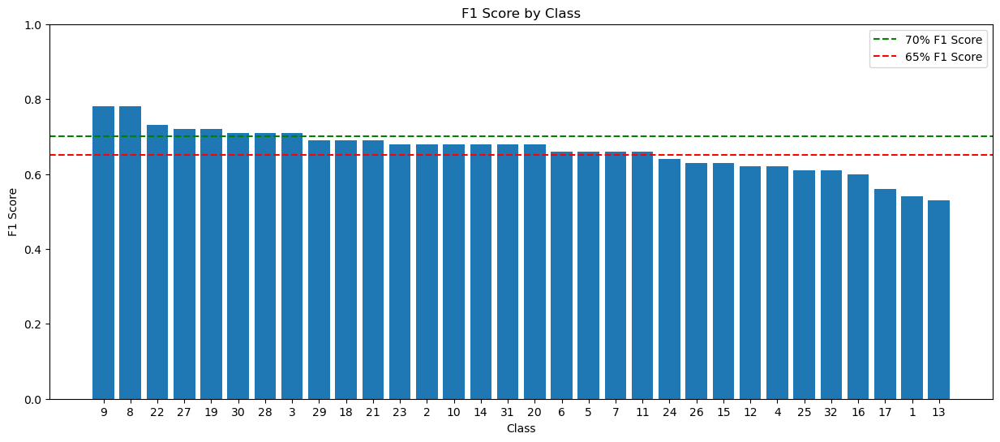

In [241]:
# F1 scores by class
f1_scores = best_log_reg_classification_report_df['f1-score']

# Class labels
class_labels = best_log_reg_classification_report_df.index

# Plotting the F1 scores
plt.figure(figsize=(15, 6))
plt.bar(class_labels, f1_scores)
plt.xlabel('Class')
plt.ylabel('F1 Score')
plt.title('F1 Score by Class')
plt.axhline(0.7, color='g', linestyle='--', label="70% F1 Score")
plt.axhline(0.65, color='r', linestyle='--', label="65% F1 Score")
plt.legend()
plt.ylim([0.0, 1.0])
plt.show()


Let's now look at the confusion matrix for this model.

In [249]:
import json

confusion_matrix_data = confusion_matrix(augmented_teeth_df_val["class"], best_log_reg_predictions, labels=sorted(augmented_teeth_df_val["class"].unique()))

# Convert the confusion matrix data to a JSON string
confusion_matrix_json = json.dumps(confusion_matrix_data.tolist())

# Save the JSON string to a file
with open('C:\\Users\\kaloy\\Downloads\\confusion_matrix.json', 'w') as file:
	file.write(confusion_matrix_json)


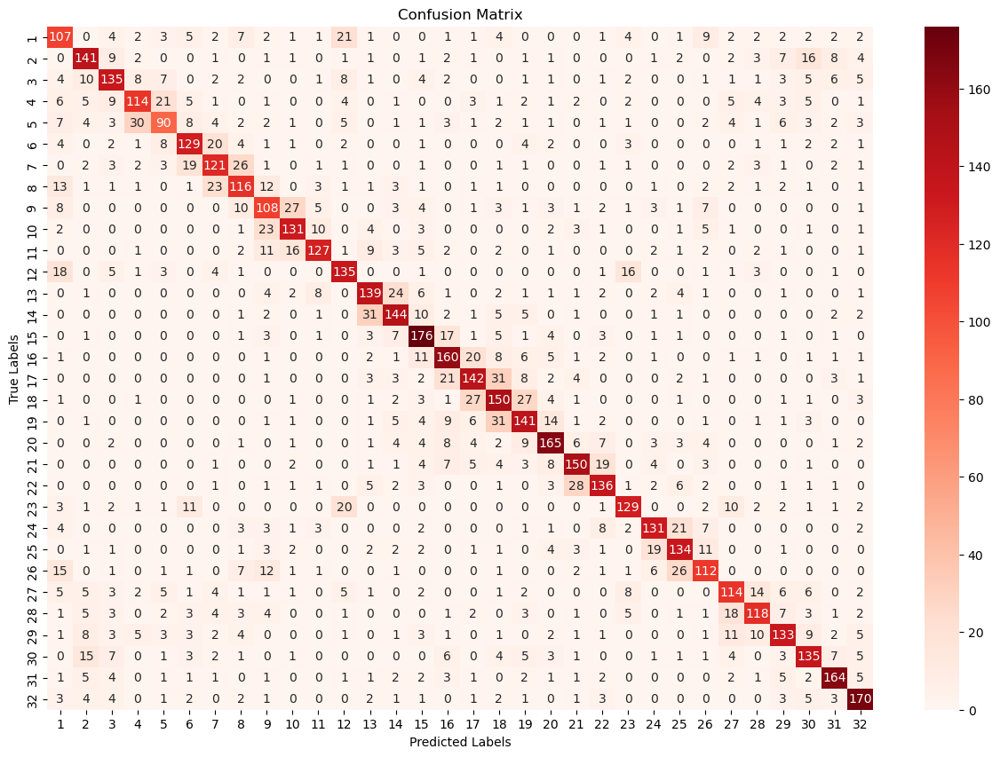

In [250]:
def display_confustion_matrix(class_labels, actual, predicted):
	"""
	Displays a confusion matrix.
	
	Parameters:
	- class_labels: The class labels.
	- actual: The actual class labels.
 	- predicted: The predicted class labels.
	"""
 
	# Compute the confusion matrix
	confusion_mat = confusion_matrix(actual, predicted, labels=sorted(class_labels))

	# Convert labels to numbers
	label_numbers = [int(label) for label in class_labels]

	# Sort the label numbers
	sorted_label_numbers = sorted(label_numbers)

	# Convert the sorted label numbers back to strings
	sorted_labels = [str(label) for label in sorted_label_numbers]

	# Plot the confusion matrix
	plt.figure(figsize=(15, 10))
	sns.heatmap(confusion_mat, annot=True, fmt='d', cmap='Reds', xticklabels=sorted_labels, yticklabels=sorted_labels)
	plt.xlabel('Predicted Labels')
	plt.ylabel('True Labels')
	plt.title('Confusion Matrix')
	plt.show()

display_confustion_matrix(augmented_teeth_df_val["class"].unique(), augmented_teeth_df_val["class"], best_log_reg_predictions)

Here high values along the diagonal are good and indicate correct classifications. As expected the most confusion is observed between teeth neighbors. For example we can see that tooth number 5 and 4 get confused a lot, which is to be expected, because they are right next to each other. The same goes for 6 and 7, 7 and 8, 9 and 10, 13 and 14, 16 and 17, 17 and 18, 18 and 19, 21 and 22, 24 and 25, 25 and 26, 27 and 28. Let's see what some other models can achieve.

In [196]:
mlflow.end_run()

### 4. Random Forest Classifier
Now that we have looked at the baseline model, we can move on to the more complex ones. We will start with the Random Forest Classifier. We will use the `RandomForestClassifier` class from `sklearn` to do that. Due to the large size of our dataset, we will try to limit our hyperparameter tuning here. The most important hyperparameters for the Random Forest Classifier is the number of trees, because the model generally adapts more easily to the data. But because of the size of our dataset we need to be careful about the balance between model performance and computational efficiency. It is also important to set the `max_depth` of the trees, because if we don't do that, the model will most probably overfit. A good starting point here is to look at $log_2(n\_samples)$ which in our case equal around 15. This is because if all the features in the dataset are independent one of our trees would need to have a depth of 15 to be able to distinguish between all of them. This time we will make use of the `RandomizedSearchCV` class from `sklearn` to do the hyperparameter tuning. We will use the following distributions for the hyperparameters:
- `n_estimators`: uniform distribution between 50 and 1000
- `max_depth`: uniform distribution between 5 and 20

In [253]:
mlflow.set_experiment("Teeth_Classification")
mlflow.start_run(run_name = "Random Forest Grid Search")

<ActiveRun: >

In [261]:
param_grid = {
	'n_estimators': [50, 100, 200, 300, 500, 1000],  # Number of trees
	'max_depth': [5, 10, 15, 20]  # Maximum depth of trees
}

mlflow.log_param("n_estimators", param_grid['n_estimators'])
mlflow.log_param("max_depth", param_grid['max_depth'])
mlflow.log_param("cv", 3)
mlflow.log_param("n_iter", 10)

rand_forest = RandomForestClassifier(n_jobs=-1, verbose=10)
rand_forest_grid_search = RandomizedSearchCV(rand_forest, param_grid, cv=3, verbose=10, n_jobs=-1, n_iter=10)

10

In [201]:
rand_forest_grid_search.fit(images_train, augmented_teeth_df_train["class"])

Fitting 3 folds for each of 10 candidates, totalling 30 fits


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.


building tree 1 of 1000
building tree 2 of 1000
building tree 3 of 1000
building tree 4 of 1000
building tree 5 of 1000
building tree 6 of 1000
building tree 7 of 1000
building tree 8 of 1000
building tree 9 of 1000
building tree 10 of 1000
building tree 11 of 1000
building tree 12 of 1000
building tree 13 of 1000
building tree 14 of 1000
building tree 15 of 1000
building tree 16 of 1000
building tree 17 of 1000


[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    3.8s


building tree 18 of 1000
building tree 19 of 1000
building tree 20 of 1000
building tree 21 of 1000
building tree 22 of 1000


[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    4.5s


building tree 23 of 1000
building tree 24 of 1000
building tree 25 of 1000
building tree 26 of 1000
building tree 27 of 1000
building tree 28 of 1000
building tree 29 of 1000building tree 30 of 1000

building tree 31 of 1000
building tree 32 of 1000
building tree 33 of 1000
building tree 34 of 1000


[Parallel(n_jobs=-1)]: Done  17 tasks      | elapsed:    8.9s


building tree 35 of 1000
building tree 36 of 1000
building tree 37 of 1000
building tree 38 of 1000


[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:   12.1s


building tree 39 of 1000
building tree 40 of 1000
building tree 41 of 1000
building tree 42 of 1000
building tree 43 of 1000
building tree 44 of 1000
building tree 45 of 1000
building tree 46 of 1000
building tree 47 of 1000
building tree 48 of 1000
building tree 49 of 1000


[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   15.8s


building tree 50 of 1000
building tree 51 of 1000
building tree 52 of 1000
building tree 53 of 1000
building tree 54 of 1000
building tree 55 of 1000
building tree 56 of 1000
building tree 57 of 1000
building tree 58 of 1000
building tree 59 of 1000
building tree 60 of 1000


[Parallel(n_jobs=-1)]: Done  48 tasks      | elapsed:   19.3s


building tree 61 of 1000
building tree 62 of 1000
building tree 63 of 1000
building tree 64 of 1000
building tree 65 of 1000
building tree 66 of 1000
building tree 67 of 1000
building tree 68 of 1000
building tree 69 of 1000
building tree 70 of 1000
building tree 71 of 1000
building tree 72 of 1000
building tree 73 of 1000


[Parallel(n_jobs=-1)]: Done  61 tasks      | elapsed:   24.5s


building tree 74 of 1000
building tree 75 of 1000
building tree 76 of 1000
building tree 77 of 1000
building tree 78 of 1000
building tree 79 of 1000
building tree 80 of 1000
building tree 81 of 1000
building tree 82 of 1000
building tree 83 of 1000
building tree 84 of 1000
building tree 85 of 1000
building tree 86 of 1000
building tree 87 of 1000
building tree 88 of 1000


[Parallel(n_jobs=-1)]: Done  74 tasks      | elapsed:   29.5s


building tree 89 of 1000
building tree 90 of 1000
building tree 91 of 1000
building tree 92 of 1000
building tree 93 of 1000
building tree 94 of 1000
building tree 95 of 1000
building tree 96 of 1000
building tree 97 of 1000
building tree 98 of 1000
building tree 99 of 1000
building tree 100 of 1000
building tree 101 of 1000
building tree 102 of 1000
building tree 103 of 1000


[Parallel(n_jobs=-1)]: Done  89 tasks      | elapsed:   34.6s


building tree 104 of 1000
building tree 105 of 1000
building tree 106 of 1000
building tree 107 of 1000
building tree 108 of 1000
building tree 109 of 1000
building tree 110 of 1000
building tree 111 of 1000
building tree 112 of 1000
building tree 113 of 1000
building tree 114 of 1000
building tree 115 of 1000
building tree 116 of 1000


[Parallel(n_jobs=-1)]: Done 104 tasks      | elapsed:   39.6s


building tree 117 of 1000
building tree 118 of 1000
building tree 119 of 1000
building tree 120 of 1000
building tree 121 of 1000
building tree 122 of 1000
building tree 123 of 1000
building tree 124 of 1000
building tree 125 of 1000
building tree 126 of 1000
building tree 127 of 1000
building tree 128 of 1000
building tree 129 of 1000
building tree 130 of 1000
building tree 131 of 1000
building tree 132 of 1000
building tree 133 of 1000
building tree 134 of 1000


[Parallel(n_jobs=-1)]: Done 121 tasks      | elapsed:   45.9s


building tree 135 of 1000
building tree 136 of 1000
building tree 137 of 1000
building tree 138 of 1000
building tree 139 of 1000
building tree 140 of 1000
building tree 141 of 1000
building tree 142 of 1000
building tree 143 of 1000
building tree 144 of 1000
building tree 145 of 1000
building tree 146 of 1000
building tree 147 of 1000
building tree 148 of 1000
building tree 149 of 1000
building tree 150 of 1000


[Parallel(n_jobs=-1)]: Done 138 tasks      | elapsed:   51.5s


building tree 151 of 1000
building tree 152 of 1000
building tree 153 of 1000
building tree 154 of 1000
building tree 155 of 1000
building tree 156 of 1000
building tree 157 of 1000
building tree 158 of 1000
building tree 159 of 1000
building tree 160 of 1000
building tree 161 of 1000
building tree 162 of 1000
building tree 163 of 1000
building tree 164 of 1000
building tree 165 of 1000
building tree 166 of 1000
building tree 167 of 1000
building tree 168 of 1000
building tree 169 of 1000


[Parallel(n_jobs=-1)]: Done 157 tasks      | elapsed:   58.1s


building tree 170 of 1000
building tree 171 of 1000
building tree 172 of 1000
building tree 173 of 1000
building tree 174 of 1000
building tree 175 of 1000
building tree 176 of 1000
building tree 177 of 1000
building tree 178 of 1000
building tree 179 of 1000
building tree 180 of 1000
building tree 181 of 1000
building tree 182 of 1000
building tree 183 of 1000
building tree 184 of 1000
building tree 185 of 1000
building tree 186 of 1000
building tree 187 of 1000
building tree 188 of 1000


[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:  1.1min


building tree 189 of 1000
building tree 190 of 1000
building tree 191 of 1000
building tree 192 of 1000
building tree 193 of 1000
building tree 194 of 1000
building tree 195 of 1000
building tree 196 of 1000
building tree 197 of 1000
building tree 198 of 1000
building tree 199 of 1000
building tree 200 of 1000
building tree 201 of 1000
building tree 202 of 1000
building tree 203 of 1000
building tree 204 of 1000
building tree 205 of 1000
building tree 206 of 1000
building tree 207 of 1000
building tree 208 of 1000
building tree 209 of 1000
building tree 210 of 1000


[Parallel(n_jobs=-1)]: Done 197 tasks      | elapsed:  1.2min


building tree 211 of 1000
building tree 212 of 1000
building tree 213 of 1000
building tree 214 of 1000
building tree 215 of 1000
building tree 216 of 1000
building tree 217 of 1000
building tree 218 of 1000
building tree 219 of 1000
building tree 220 of 1000
building tree 221 of 1000
building tree 222 of 1000
building tree 223 of 1000
building tree 224 of 1000
building tree 225 of 1000
building tree 226 of 1000
building tree 227 of 1000
building tree 228 of 1000
building tree 229 of 1000
building tree 230 of 1000
building tree 231 of 1000


[Parallel(n_jobs=-1)]: Done 218 tasks      | elapsed:  1.3min


building tree 232 of 1000
building tree 233 of 1000
building tree 234 of 1000
building tree 235 of 1000
building tree 236 of 1000
building tree 237 of 1000
building tree 238 of 1000
building tree 239 of 1000
building tree 240 of 1000
building tree 241 of 1000
building tree 242 of 1000
building tree 243 of 1000
building tree 244 of 1000
building tree 245 of 1000
building tree 246 of 1000
building tree 247 of 1000
building tree 248 of 1000
building tree 249 of 1000
building tree 250 of 1000
building tree 251 of 1000
building tree 252 of 1000
building tree 253 of 1000


[Parallel(n_jobs=-1)]: Done 241 tasks      | elapsed:  1.5min


building tree 254 of 1000
building tree 255 of 1000
building tree 256 of 1000
building tree 257 of 1000
building tree 258 of 1000
building tree 259 of 1000
building tree 260 of 1000
building tree 261 of 1000
building tree 262 of 1000
building tree 263 of 1000
building tree 264 of 1000
building tree 265 of 1000
building tree 266 of 1000
building tree 267 of 1000
building tree 268 of 1000
building tree 269 of 1000
building tree 270 of 1000
building tree 271 of 1000
building tree 272 of 1000
building tree 273 of 1000
building tree 274 of 1000
building tree 275 of 1000
building tree 276 of 1000


[Parallel(n_jobs=-1)]: Done 264 tasks      | elapsed:  1.6min


building tree 277 of 1000
building tree 278 of 1000
building tree 279 of 1000
building tree 280 of 1000
building tree 281 of 1000
building tree 282 of 1000
building tree 283 of 1000
building tree 284 of 1000
building tree 285 of 1000
building tree 286 of 1000
building tree 287 of 1000
building tree 288 of 1000
building tree 289 of 1000
building tree 290 of 1000
building tree 291 of 1000
building tree 292 of 1000
building tree 293 of 1000
building tree 294 of 1000
building tree 295 of 1000
building tree 296 of 1000
building tree 297 of 1000
building tree 298 of 1000
building tree 299 of 1000
building tree 300 of 1000
building tree 301 of 1000


[Parallel(n_jobs=-1)]: Done 289 tasks      | elapsed:  1.7min


building tree 302 of 1000
building tree 303 of 1000
building tree 304 of 1000
building tree 305 of 1000
building tree 306 of 1000
building tree 307 of 1000
building tree 308 of 1000
building tree 309 of 1000
building tree 310 of 1000
building tree 311 of 1000
building tree 312 of 1000
building tree 313 of 1000
building tree 314 of 1000
building tree 315 of 1000
building tree 316 of 1000
building tree 317 of 1000
building tree 318 of 1000
building tree 319 of 1000
building tree 320 of 1000
building tree 321 of 1000
building tree 322 of 1000
building tree 323 of 1000
building tree 324 of 1000
building tree 325 of 1000
building tree 326 of 1000


[Parallel(n_jobs=-1)]: Done 314 tasks      | elapsed:  1.9min


building tree 327 of 1000
building tree 328 of 1000
building tree 329 of 1000
building tree 330 of 1000
building tree 331 of 1000
building tree 332 of 1000
building tree 333 of 1000
building tree 334 of 1000
building tree 335 of 1000
building tree 336 of 1000
building tree 337 of 1000
building tree 338 of 1000
building tree 339 of 1000
building tree 340 of 1000
building tree 341 of 1000
building tree 342 of 1000
building tree 343 of 1000
building tree 344 of 1000
building tree 345 of 1000
building tree 346 of 1000
building tree 347 of 1000
building tree 348 of 1000
building tree 349 of 1000
building tree 350 of 1000
building tree 351 of 1000
building tree 352 of 1000
building tree 353 of 1000


[Parallel(n_jobs=-1)]: Done 341 tasks      | elapsed:  2.0min


building tree 354 of 1000
building tree 355 of 1000
building tree 356 of 1000
building tree 357 of 1000
building tree 358 of 1000
building tree 359 of 1000
building tree 360 of 1000
building tree 361 of 1000
building tree 362 of 1000
building tree 363 of 1000
building tree 364 of 1000
building tree 365 of 1000
building tree 366 of 1000
building tree 367 of 1000
building tree 368 of 1000
building tree 369 of 1000
building tree 370 of 1000
building tree 371 of 1000
building tree 372 of 1000
building tree 373 of 1000
building tree 374 of 1000
building tree 375 of 1000
building tree 376 of 1000
building tree 377 of 1000
building tree 378 of 1000
building tree 379 of 1000
building tree 380 of 1000


[Parallel(n_jobs=-1)]: Done 368 tasks      | elapsed:  2.2min


building tree 381 of 1000
building tree 382 of 1000
building tree 383 of 1000
building tree 384 of 1000
building tree 385 of 1000
building tree 386 of 1000
building tree 387 of 1000
building tree 388 of 1000
building tree 389 of 1000
building tree 390 of 1000
building tree 391 of 1000
building tree 392 of 1000
building tree 393 of 1000
building tree 394 of 1000
building tree 395 of 1000
building tree 396 of 1000
building tree 397 of 1000
building tree 398 of 1000
building tree 399 of 1000
building tree 400 of 1000
building tree 401 of 1000
building tree 402 of 1000
building tree 403 of 1000
building tree 404 of 1000
building tree 405 of 1000
building tree 406 of 1000
building tree 407 of 1000
building tree 408 of 1000
building tree 409 of 1000


[Parallel(n_jobs=-1)]: Done 397 tasks      | elapsed:  2.4min


building tree 410 of 1000
building tree 411 of 1000
building tree 412 of 1000
building tree 413 of 1000
building tree 414 of 1000
building tree 415 of 1000
building tree 416 of 1000
building tree 417 of 1000
building tree 418 of 1000
building tree 419 of 1000
building tree 420 of 1000
building tree 421 of 1000
building tree 422 of 1000
building tree 423 of 1000
building tree 424 of 1000
building tree 425 of 1000
building tree 426 of 1000
building tree 427 of 1000
building tree 428 of 1000
building tree 429 of 1000
building tree 430 of 1000
building tree 431 of 1000
building tree 432 of 1000
building tree 433 of 1000
building tree 434 of 1000
building tree 435 of 1000
building tree 436 of 1000
building tree 437 of 1000
building tree 438 of 1000


[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:  2.5min


building tree 439 of 1000
building tree 440 of 1000
building tree 441 of 1000
building tree 442 of 1000
building tree 443 of 1000
building tree 444 of 1000
building tree 445 of 1000
building tree 446 of 1000
building tree 447 of 1000
building tree 448 of 1000
building tree 449 of 1000
building tree 450 of 1000
building tree 451 of 1000
building tree 452 of 1000
building tree 453 of 1000
building tree 454 of 1000
building tree 455 of 1000
building tree 456 of 1000
building tree 457 of 1000
building tree 458 of 1000
building tree 459 of 1000
building tree 460 of 1000
building tree 461 of 1000
building tree 462 of 1000
building tree 463 of 1000
building tree 464 of 1000
building tree 465 of 1000
building tree 466 of 1000
building tree 467 of 1000
building tree 468 of 1000
building tree 469 of 1000


[Parallel(n_jobs=-1)]: Done 457 tasks      | elapsed:  2.7min


building tree 470 of 1000
building tree 471 of 1000
building tree 472 of 1000
building tree 473 of 1000
building tree 474 of 1000
building tree 475 of 1000
building tree 476 of 1000
building tree 477 of 1000
building tree 478 of 1000
building tree 479 of 1000
building tree 480 of 1000
building tree 481 of 1000
building tree 482 of 1000
building tree 483 of 1000
building tree 484 of 1000
building tree 485 of 1000
building tree 486 of 1000
building tree 487 of 1000
building tree 488 of 1000
building tree 489 of 1000
building tree 490 of 1000
building tree 491 of 1000
building tree 492 of 1000
building tree 493 of 1000
building tree 494 of 1000
building tree 495 of 1000
building tree 496 of 1000
building tree 497 of 1000
building tree 498 of 1000
building tree 499 of 1000
building tree 500 of 1000
building tree 501 of 1000
building tree 502 of 1000


[Parallel(n_jobs=-1)]: Done 488 tasks      | elapsed:  2.9min


building tree 503 of 1000
building tree 504 of 1000
building tree 505 of 1000
building tree 506 of 1000
building tree 507 of 1000
building tree 508 of 1000
building tree 509 of 1000
building tree 510 of 1000
building tree 511 of 1000
building tree 512 of 1000
building tree 513 of 1000
building tree 514 of 1000
building tree 515 of 1000
building tree 516 of 1000
building tree 517 of 1000
building tree 518 of 1000
building tree 519 of 1000
building tree 520 of 1000
building tree 521 of 1000
building tree 522 of 1000
building tree 523 of 1000
building tree 524 of 1000
building tree 525 of 1000
building tree 526 of 1000
building tree 527 of 1000
building tree 528 of 1000
building tree 529 of 1000
building tree 530 of 1000
building tree 531 of 1000
building tree 532 of 1000
building tree 533 of 1000


[Parallel(n_jobs=-1)]: Done 521 tasks      | elapsed:  3.1min


building tree 534 of 1000
building tree 535 of 1000
building tree 536 of 1000
building tree 537 of 1000
building tree 538 of 1000
building tree 539 of 1000
building tree 540 of 1000
building tree 541 of 1000
building tree 542 of 1000
building tree 543 of 1000
building tree 544 of 1000
building tree 545 of 1000
building tree 546 of 1000
building tree 547 of 1000
building tree 548 of 1000
building tree 549 of 1000
building tree 550 of 1000
building tree 551 of 1000
building tree 552 of 1000
building tree 553 of 1000
building tree 554 of 1000
building tree 555 of 1000
building tree 556 of 1000
building tree 557 of 1000
building tree 558 of 1000
building tree 559 of 1000
building tree 560 of 1000
building tree 561 of 1000
building tree 562 of 1000
building tree 563 of 1000
building tree 564 of 1000
building tree 565 of 1000
building tree 566 of 1000


[Parallel(n_jobs=-1)]: Done 554 tasks      | elapsed:  3.3min


building tree 567 of 1000
building tree 568 of 1000
building tree 569 of 1000
building tree 570 of 1000
building tree 571 of 1000
building tree 572 of 1000
building tree 573 of 1000
building tree 574 of 1000
building tree 575 of 1000
building tree 576 of 1000
building tree 577 of 1000
building tree 578 of 1000
building tree 579 of 1000
building tree 580 of 1000
building tree 581 of 1000
building tree 582 of 1000
building tree 583 of 1000
building tree 584 of 1000
building tree 585 of 1000
building tree 586 of 1000
building tree 587 of 1000
building tree 588 of 1000
building tree 589 of 1000
building tree 590 of 1000
building tree 591 of 1000
building tree 592 of 1000
building tree 593 of 1000
building tree 594 of 1000
building tree 595 of 1000
building tree 596 of 1000
building tree 597 of 1000
building tree 598 of 1000
building tree 599 of 1000
building tree 600 of 1000
building tree 601 of 1000
building tree 602 of 1000


[Parallel(n_jobs=-1)]: Done 589 tasks      | elapsed:  3.5min


building tree 603 of 1000
building tree 604 of 1000
building tree 605 of 1000
building tree 606 of 1000
building tree 607 of 1000
building tree 608 of 1000
building tree 609 of 1000
building tree 610 of 1000
building tree 611 of 1000
building tree 612 of 1000
building tree 613 of 1000
building tree 614 of 1000
building tree 615 of 1000
building tree 616 of 1000
building tree 617 of 1000
building tree 618 of 1000
building tree 619 of 1000
building tree 620 of 1000
building tree 621 of 1000
building tree 622 of 1000
building tree 623 of 1000
building tree 624 of 1000
building tree 625 of 1000
building tree 626 of 1000
building tree 627 of 1000
building tree 628 of 1000
building tree 629 of 1000building tree 630 of 1000

building tree 631 of 1000
building tree 632 of 1000
building tree 633 of 1000
building tree 634 of 1000
building tree 635 of 1000
building tree 636 of 1000


[Parallel(n_jobs=-1)]: Done 624 tasks      | elapsed:  3.7min


building tree 637 of 1000
building tree 638 of 1000
building tree 639 of 1000
building tree 640 of 1000
building tree 641 of 1000
building tree 642 of 1000
building tree 643 of 1000
building tree 644 of 1000
building tree 645 of 1000
building tree 646 of 1000
building tree 647 of 1000
building tree 648 of 1000
building tree 649 of 1000
building tree 650 of 1000
building tree 651 of 1000
building tree 652 of 1000
building tree 653 of 1000
building tree 654 of 1000
building tree 655 of 1000
building tree 656 of 1000
building tree 657 of 1000
building tree 658 of 1000
building tree 659 of 1000
building tree 660 of 1000building tree 661 of 1000

building tree 662 of 1000
building tree 663 of 1000
building tree 664 of 1000
building tree 665 of 1000
building tree 666 of 1000
building tree 667 of 1000
building tree 668 of 1000
building tree 669 of 1000
building tree 670 of 1000
building tree 671 of 1000
building tree 672 of 1000
building tree 673 of 1000


[Parallel(n_jobs=-1)]: Done 661 tasks      | elapsed:  3.9min


building tree 674 of 1000
building tree 675 of 1000
building tree 676 of 1000
building tree 677 of 1000
building tree 678 of 1000
building tree 679 of 1000
building tree 680 of 1000
building tree 681 of 1000
building tree 682 of 1000
building tree 683 of 1000
building tree 684 of 1000
building tree 685 of 1000
building tree 686 of 1000
building tree 687 of 1000
building tree 688 of 1000
building tree 689 of 1000
building tree 690 of 1000
building tree 691 of 1000
building tree 692 of 1000
building tree 693 of 1000
building tree 694 of 1000
building tree 695 of 1000
building tree 696 of 1000
building tree 697 of 1000
building tree 698 of 1000
building tree 699 of 1000
building tree 700 of 1000
building tree 701 of 1000
building tree 702 of 1000
building tree 703 of 1000
building tree 704 of 1000
building tree 705 of 1000
building tree 706 of 1000
building tree 707 of 1000
building tree 708 of 1000
building tree 709 of 1000
building tree 710 of 1000


[Parallel(n_jobs=-1)]: Done 698 tasks      | elapsed:  4.1min


building tree 711 of 1000
building tree 712 of 1000
building tree 713 of 1000
building tree 714 of 1000
building tree 715 of 1000
building tree 716 of 1000
building tree 717 of 1000
building tree 718 of 1000
building tree 719 of 1000
building tree 720 of 1000
building tree 721 of 1000
building tree 722 of 1000
building tree 723 of 1000
building tree 724 of 1000
building tree 725 of 1000
building tree 726 of 1000
building tree 727 of 1000
building tree 728 of 1000
building tree 729 of 1000
building tree 730 of 1000
building tree 731 of 1000
building tree 732 of 1000
building tree 733 of 1000
building tree 734 of 1000
building tree 735 of 1000
building tree 736 of 1000
building tree 737 of 1000
building tree 738 of 1000
building tree 739 of 1000
building tree 740 of 1000
building tree 741 of 1000
building tree 742 of 1000
building tree 743 of 1000
building tree 744 of 1000
building tree 745 of 1000
building tree 746 of 1000
building tree 747 of 1000
building tree 748 of 1000
building tre

[Parallel(n_jobs=-1)]: Done 737 tasks      | elapsed:  4.3min


building tree 750 of 1000
building tree 751 of 1000
building tree 752 of 1000
building tree 753 of 1000
building tree 754 of 1000
building tree 755 of 1000
building tree 756 of 1000
building tree 757 of 1000
building tree 758 of 1000
building tree 759 of 1000
building tree 760 of 1000
building tree 761 of 1000
building tree 762 of 1000
building tree 763 of 1000
building tree 764 of 1000
building tree 765 of 1000
building tree 766 of 1000
building tree 767 of 1000
building tree 768 of 1000
building tree 769 of 1000
building tree 770 of 1000
building tree 771 of 1000
building tree 772 of 1000
building tree 773 of 1000
building tree 774 of 1000
building tree 775 of 1000
building tree 776 of 1000
building tree 777 of 1000
building tree 778 of 1000
building tree 779 of 1000
building tree 780 of 1000
building tree 781 of 1000
building tree 782 of 1000
building tree 783 of 1000
building tree 784 of 1000
building tree 785 of 1000
building tree 786 of 1000
building tree 787 of 1000
building tre

[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed:  4.5min


building tree 790 of 1000
building tree 791 of 1000
building tree 792 of 1000
building tree 793 of 1000
building tree 794 of 1000
building tree 795 of 1000
building tree 796 of 1000
building tree 797 of 1000
building tree 798 of 1000
building tree 799 of 1000
building tree 800 of 1000
building tree 801 of 1000
building tree 802 of 1000
building tree 803 of 1000
building tree 804 of 1000
building tree 805 of 1000
building tree 806 of 1000
building tree 807 of 1000
building tree 808 of 1000
building tree 809 of 1000
building tree 810 of 1000
building tree 811 of 1000
building tree 812 of 1000
building tree 813 of 1000
building tree 814 of 1000
building tree 815 of 1000
building tree 816 of 1000
building tree 817 of 1000
building tree 818 of 1000
building tree 819 of 1000
building tree 820 of 1000
building tree 821 of 1000
building tree 822 of 1000
building tree 823 of 1000
building tree 824 of 1000
building tree 825 of 1000
building tree 826 of 1000
building tree 827 of 1000
building tre

[Parallel(n_jobs=-1)]: Done 817 tasks      | elapsed:  4.8min


building tree 830 of 1000
building tree 831 of 1000
building tree 832 of 1000
building tree 833 of 1000
building tree 834 of 1000
building tree 835 of 1000
building tree 836 of 1000
building tree 837 of 1000
building tree 838 of 1000
building tree 839 of 1000
building tree 840 of 1000
building tree 841 of 1000
building tree 842 of 1000
building tree 843 of 1000
building tree 844 of 1000
building tree 845 of 1000
building tree 846 of 1000
building tree 847 of 1000
building tree 848 of 1000
building tree 849 of 1000
building tree 850 of 1000
building tree 851 of 1000
building tree 852 of 1000
building tree 853 of 1000
building tree 854 of 1000
building tree 855 of 1000
building tree 856 of 1000
building tree 857 of 1000
building tree 858 of 1000
building tree 859 of 1000
building tree 860 of 1000
building tree 861 of 1000
building tree 862 of 1000
building tree 863 of 1000
building tree 864 of 1000
building tree 865 of 1000
building tree 866 of 1000
building tree 867 of 1000
building tre

[Parallel(n_jobs=-1)]: Done 858 tasks      | elapsed:  5.0min


building tree 871 of 1000
building tree 872 of 1000
building tree 873 of 1000
building tree 874 of 1000
building tree 875 of 1000
building tree 876 of 1000
building tree 877 of 1000
building tree 878 of 1000
building tree 879 of 1000
building tree 880 of 1000
building tree 881 of 1000
building tree 882 of 1000
building tree 883 of 1000
building tree 884 of 1000
building tree 885 of 1000
building tree 886 of 1000
building tree 887 of 1000
building tree 888 of 1000
building tree 889 of 1000
building tree 890 of 1000
building tree 891 of 1000
building tree 892 of 1000
building tree 893 of 1000
building tree 894 of 1000
building tree 895 of 1000
building tree 896 of 1000
building tree 897 of 1000
building tree 898 of 1000
building tree 899 of 1000
building tree 900 of 1000
building tree 901 of 1000
building tree 902 of 1000
building tree 903 of 1000
building tree 904 of 1000
building tree 905 of 1000
building tree 906 of 1000
building tree 907 of 1000
building tree 908 of 1000
building tre

[Parallel(n_jobs=-1)]: Done 901 tasks      | elapsed:  5.3min


building tree 914 of 1000
building tree 915 of 1000
building tree 916 of 1000
building tree 917 of 1000
building tree 918 of 1000
building tree 919 of 1000
building tree 920 of 1000
building tree 921 of 1000
building tree 922 of 1000
building tree 923 of 1000
building tree 924 of 1000
building tree 925 of 1000
building tree 926 of 1000
building tree 927 of 1000
building tree 928 of 1000
building tree 929 of 1000
building tree 930 of 1000
building tree 931 of 1000
building tree 932 of 1000
building tree 933 of 1000
building tree 934 of 1000
building tree 935 of 1000
building tree 936 of 1000
building tree 937 of 1000
building tree 938 of 1000
building tree 939 of 1000
building tree 940 of 1000
building tree 941 of 1000
building tree 942 of 1000
building tree 943 of 1000
building tree 944 of 1000
building tree 945 of 1000
building tree 946 of 1000
building tree 947 of 1000
building tree 948 of 1000
building tree 949 of 1000
building tree 950 of 1000
building tree 951 of 1000
building tre

[Parallel(n_jobs=-1)]: Done 944 tasks      | elapsed:  5.5min


building tree 957 of 1000
building tree 958 of 1000
building tree 959 of 1000
building tree 960 of 1000
building tree 961 of 1000
building tree 962 of 1000
building tree 963 of 1000
building tree 964 of 1000
building tree 965 of 1000
building tree 966 of 1000
building tree 967 of 1000
building tree 968 of 1000
building tree 969 of 1000
building tree 970 of 1000
building tree 971 of 1000
building tree 972 of 1000
building tree 973 of 1000
building tree 974 of 1000
building tree 975 of 1000
building tree 976 of 1000
building tree 977 of 1000
building tree 978 of 1000
building tree 979 of 1000
building tree 980 of 1000
building tree 981 of 1000
building tree 982 of 1000
building tree 983 of 1000
building tree 984 of 1000
building tree 985 of 1000
building tree 986 of 1000
building tree 987 of 1000
building tree 988 of 1000
building tree 989 of 1000
building tree 990 of 1000
building tree 991 of 1000
building tree 992 of 1000
building tree 993 of 1000
building tree 994 of 1000
building tre

[Parallel(n_jobs=-1)]: Done 1000 out of 1000 | elapsed:  5.8min finished


RandomizedSearchCV(cv=3,
                   estimator=RandomForestClassifier(n_jobs=-1, verbose=10),
                   n_jobs=-1,
                   param_distributions={'max_depth': [5, 10, 15, 20],
                                        'n_estimators': [50, 100, 200, 300, 500,
                                                         1000]},
                   verbose=10)

Let's now look at our best estimator and it's score:

In [206]:
rand_forest_grid_search.best_estimator_, rand_forest_grid_search.best_score_

(RandomForestClassifier(max_depth=20, n_estimators=1000, n_jobs=-1, verbose=10),
 0.6192686207362551)

In [218]:
joblib.dump(rand_forest_grid_search.best_estimator_, './rand_forest_best_estimator.pkl')

['./rand_forest_best_estimator.pkl']

As we can see the best model turned out to be with 1000 trees and a max depth of 20. This indicates that our problem benefits form more complex models. However more complexity also means more computational resources and time. Also we have to be cautios of overfitting, especially with very deep trees. 

In [255]:
rand_forest_train_acc = rand_forest_grid_search.best_estimator_.score(images_train, augmented_teeth_df_train["class"])
rand_forest_val_acc = rand_forest_grid_search.best_estimator_.score(images_val, augmented_teeth_df_val["class"])

[Parallel(n_jobs=12)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=12)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=12)]: Done   8 tasks      | elapsed:    0.0s
[Parallel(n_jobs=12)]: Done  17 tasks      | elapsed:    0.1s
[Parallel(n_jobs=12)]: Done  26 tasks      | elapsed:    0.1s
[Parallel(n_jobs=12)]: Done  37 tasks      | elapsed:    0.2s
[Parallel(n_jobs=12)]: Done  48 tasks      | elapsed:    0.3s
[Parallel(n_jobs=12)]: Done  61 tasks      | elapsed:    0.4s
[Parallel(n_jobs=12)]: Done  74 tasks      | elapsed:    0.5s
[Parallel(n_jobs=12)]: Done  89 tasks      | elapsed:    0.6s
[Parallel(n_jobs=12)]: Done 104 tasks      | elapsed:    0.7s
[Parallel(n_jobs=12)]: Done 121 tasks      | elapsed:    0.9s
[Parallel(n_jobs=12)]: Done 138 tasks      | elapsed:    1.0s
[Parallel(n_jobs=12)]: Done 157 tasks      | elapsed:    1.2s


[Parallel(n_jobs=12)]: Done 176 tasks      | elapsed:    1.3s
[Parallel(n_jobs=12)]: Done 197 tasks      | elapsed:    1.5s
[Parallel(n_jobs=12)]: Done 218 tasks      | elapsed:    1.6s
[Parallel(n_jobs=12)]: Done 241 tasks      | elapsed:    1.8s
[Parallel(n_jobs=12)]: Done 264 tasks      | elapsed:    2.0s
[Parallel(n_jobs=12)]: Done 289 tasks      | elapsed:    2.3s
[Parallel(n_jobs=12)]: Done 314 tasks      | elapsed:    2.5s
[Parallel(n_jobs=12)]: Done 341 tasks      | elapsed:    2.7s
[Parallel(n_jobs=12)]: Done 368 tasks      | elapsed:    2.9s
[Parallel(n_jobs=12)]: Done 397 tasks      | elapsed:    3.2s
[Parallel(n_jobs=12)]: Done 426 tasks      | elapsed:    3.4s
[Parallel(n_jobs=12)]: Done 457 tasks      | elapsed:    3.6s
[Parallel(n_jobs=12)]: Done 488 tasks      | elapsed:    3.9s
[Parallel(n_jobs=12)]: Done 521 tasks      | elapsed:    4.2s
[Parallel(n_jobs=12)]: Done 554 tasks      | elapsed:    4.4s
[Parallel(n_jobs=12)]: Done 589 tasks      | elapsed:    4.7s
[Paralle

In [256]:
rand_forest_train_acc, rand_forest_val_acc

(1.0, 0.6398823347267378)

Let's also log our results in mlflow.

In [40]:
mlflow.log_artifact('./rand_forest_best_estimator.pkl')
mlflow.log_param("bet_n_estimators", 1000)
mlflow.log_param("best_max_depth", 20)
mlflow.log_metric("training accuracy", rand_forest_train_acc)
mlflow.log_metric("validation accuracy", rand_forest_val_acc)
mlflow.end_run()

From the training set score we can see that the model has "successfully" overfitted the training data and perfectly learned it. This is not a good sign as it means that the model has very very high variance (~37%). A more realistic measure is the one on the validation set. We can maybe consider using a simpler model (smaller number of trees and less depth) which should result in less variance. Let's plot the results of the other models from our grid search to see how they preformed. 

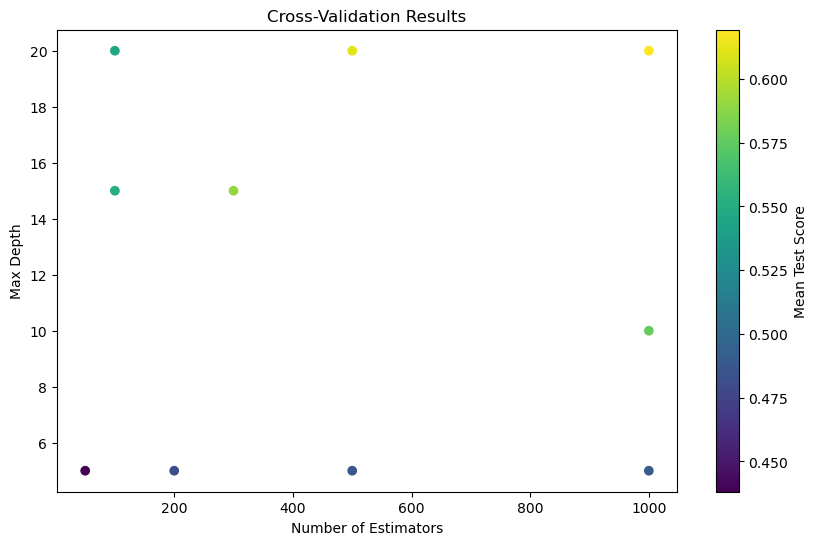

In [260]:
def display_rand_forest_gridsearch_results(cv_results):
	param_n_estimators = cv_results['param_n_estimators']
	param_max_depth = cv_results['param_max_depth']
	mean_test_score = cv_results['mean_test_score']

	# Plotting the results
	plt.figure(figsize=(10, 6))
	plt.scatter(param_n_estimators, param_max_depth, c=mean_test_score, cmap='viridis')
	plt.colorbar(label='Mean Test Score')
	plt.xlabel('Number of Estimators')
	plt.ylabel('Max Depth')
	plt.title('Cross-Validation Results')
	plt.show()

display_rand_forest_gridsearch_results(rand_forest_grid_search.cv_results_)

We see here that the model with half as much trees and max depth of 20 has a very similar score. This means that we can safely use it instead of the best model, because it should be less prone to overfitting. Let's try to refit another grid search, which is less prone to overfitting and see how it preforms on the validation set. Here we will only look at three options for numbers of trees - 200, 350, 500 and depths 10, 15, 20. We will use 3-fold cross-validation to evaluate the models.

In [12]:
param_grid = {
	'n_estimators': [200, 350, 500],  # Number of trees
	'max_depth': [5, 13, 20]  # Maximum depth of trees
}

mlflow.set_experiment("Teeth_Classification")
mlflow.start_run(run_name = "Random Forest Grid Search with Regularization")

mlflow.log_param("n_estimators", param_grid['n_estimators'])
mlflow.log_param("max_depth", param_grid['max_depth'])
mlflow.log_param("cv", 3)

rand_forest = RandomForestClassifier(n_jobs=-1, verbose=10)
rand_forest_grid_search = GridSearchCV(rand_forest, param_grid, cv=3, verbose=10, n_jobs=-1)

In [13]:
rand_forest_grid_search.fit(images_train, augmented_teeth_df_train["class"])

Fitting 3 folds for each of 9 candidates, totalling 27 fits


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.


building tree 1 of 500
building tree 2 of 500
building tree 3 of 500
building tree 4 of 500
building tree 5 of 500
building tree 6 of 500
building tree 7 of 500
building tree 8 of 500
building tree 9 of 500
building tree 10 of 500
building tree 11 of 500
building tree 12 of 500
building tree 13 of 500
building tree 14 of 500
building tree 15 of 500
building tree 16 of 500


[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    3.6s


building tree 17 of 500
building tree 18 of 500
building tree 19 of 500
building tree 20 of 500


[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    4.4s


building tree 21 of 500
building tree 22 of 500
building tree 23 of 500
building tree 24 of 500
building tree 25 of 500
building tree 26 of 500
building tree 27 of 500
building tree 28 of 500
building tree 29 of 500
building tree 30 of 500


[Parallel(n_jobs=-1)]: Done  17 tasks      | elapsed:    8.6s


building tree 31 of 500
building tree 32 of 500
building tree 33 of 500
building tree 34 of 500
building tree 35 of 500
building tree 36 of 500
building tree 37 of 500
building tree 38 of 500
building tree 39 of 500


[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:   12.1s


building tree 40 of 500
building tree 41 of 500
building tree 42 of 500
building tree 43 of 500
building tree 44 of 500
building tree 45 of 500
building tree 46 of 500
building tree 47 of 500
building tree 48 of 500
building tree 49 of 500
building tree 50 of 500
building tree 51 of 500


[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:   16.2s


building tree 52 of 500
building tree 53 of 500
building tree 54 of 500
building tree 55 of 500
building tree 56 of 500
building tree 57 of 500
building tree 58 of 500
building tree 59 of 500
building tree 60 of 500


[Parallel(n_jobs=-1)]: Done  48 tasks      | elapsed:   18.8s


building tree 61 of 500
building tree 62 of 500
building tree 63 of 500
building tree 64 of 500
building tree 65 of 500
building tree 66 of 500
building tree 67 of 500
building tree 68 of 500
building tree 69 of 500
building tree 70 of 500
building tree 71 of 500
building tree 72 of 500
building tree 73 of 500
building tree 74 of 500
building tree 75 of 500
building tree 76 of 500


[Parallel(n_jobs=-1)]: Done  61 tasks      | elapsed:   24.2s


building tree 77 of 500
building tree 78 of 500
building tree 79 of 500
building tree 80 of 500
building tree 81 of 500
building tree 82 of 500
building tree 83 of 500
building tree 84 of 500
building tree 85 of 500
building tree 86 of 500


[Parallel(n_jobs=-1)]: Done  74 tasks      | elapsed:   28.4s


building tree 87 of 500
building tree 88 of 500
building tree 89 of 500
building tree 90 of 500
building tree 91 of 500
building tree 92 of 500
building tree 93 of 500
building tree 94 of 500
building tree 95 of 500
building tree 96 of 500
building tree 97 of 500
building tree 98 of 500
building tree 99 of 500
building tree 100 of 500
building tree 101 of 500


[Parallel(n_jobs=-1)]: Done  89 tasks      | elapsed:   33.5s


building tree 102 of 500
building tree 103 of 500
building tree 104 of 500
building tree 105 of 500
building tree 106 of 500
building tree 107 of 500
building tree 108 of 500
building tree 109 of 500
building tree 110 of 500
building tree 111 of 500
building tree 112 of 500
building tree 113 of 500
building tree 114 of 500
building tree 115 of 500
building tree 116 of 500


[Parallel(n_jobs=-1)]: Done 104 tasks      | elapsed:   38.8s


building tree 117 of 500
building tree 118 of 500
building tree 119 of 500
building tree 120 of 500
building tree 121 of 500
building tree 122 of 500
building tree 123 of 500
building tree 124 of 500
building tree 125 of 500
building tree 126 of 500
building tree 127 of 500
building tree 128 of 500
building tree 129 of 500
building tree 130 of 500
building tree 131 of 500
building tree 132 of 500
building tree 133 of 500
building tree 134 of 500


[Parallel(n_jobs=-1)]: Done 121 tasks      | elapsed:   44.8s


building tree 135 of 500
building tree 136 of 500
building tree 137 of 500
building tree 138 of 500
building tree 139 of 500
building tree 140 of 500
building tree 141 of 500
building tree 142 of 500
building tree 143 of 500
building tree 144 of 500
building tree 145 of 500
building tree 146 of 500
building tree 147 of 500
building tree 148 of 500
building tree 149 of 500
building tree 150 of 500
building tree 151 of 500
building tree 152 of 500


[Parallel(n_jobs=-1)]: Done 138 tasks      | elapsed:   51.4s


building tree 153 of 500
building tree 154 of 500
building tree 155 of 500
building tree 156 of 500
building tree 157 of 500
building tree 158 of 500
building tree 159 of 500
building tree 160 of 500
building tree 161 of 500
building tree 162 of 500
building tree 163 of 500
building tree 164 of 500
building tree 165 of 500
building tree 166 of 500
building tree 167 of 500
building tree 168 of 500
building tree 169 of 500


[Parallel(n_jobs=-1)]: Done 157 tasks      | elapsed:   57.1s


building tree 170 of 500
building tree 171 of 500
building tree 172 of 500
building tree 173 of 500
building tree 174 of 500
building tree 175 of 500
building tree 176 of 500
building tree 177 of 500
building tree 178 of 500
building tree 179 of 500
building tree 180 of 500
building tree 181 of 500
building tree 182 of 500
building tree 183 of 500
building tree 184 of 500
building tree 185 of 500
building tree 186 of 500
building tree 187 of 500
building tree 188 of 500
building tree 189 of 500


[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:  1.1min


building tree 190 of 500
building tree 191 of 500
building tree 192 of 500
building tree 193 of 500
building tree 194 of 500
building tree 195 of 500
building tree 196 of 500
building tree 197 of 500
building tree 198 of 500
building tree 199 of 500
building tree 200 of 500
building tree 201 of 500
building tree 202 of 500
building tree 203 of 500
building tree 204 of 500
building tree 205 of 500
building tree 206 of 500
building tree 207 of 500
building tree 208 of 500
building tree 209 of 500


[Parallel(n_jobs=-1)]: Done 197 tasks      | elapsed:  1.2min


building tree 210 of 500
building tree 211 of 500
building tree 212 of 500
building tree 213 of 500
building tree 214 of 500
building tree 215 of 500
building tree 216 of 500
building tree 217 of 500
building tree 218 of 500
building tree 219 of 500
building tree 220 of 500
building tree 221 of 500
building tree 222 of 500
building tree 223 of 500
building tree 224 of 500
building tree 225 of 500
building tree 226 of 500
building tree 227 of 500
building tree 228 of 500
building tree 229 of 500
building tree 230 of 500


[Parallel(n_jobs=-1)]: Done 218 tasks      | elapsed:  1.3min


building tree 231 of 500
building tree 232 of 500
building tree 233 of 500
building tree 234 of 500
building tree 235 of 500
building tree 236 of 500
building tree 237 of 500
building tree 238 of 500
building tree 239 of 500
building tree 240 of 500
building tree 241 of 500
building tree 242 of 500
building tree 243 of 500
building tree 244 of 500
building tree 245 of 500
building tree 246 of 500
building tree 247 of 500
building tree 248 of 500
building tree 249 of 500
building tree 250 of 500
building tree 251 of 500
building tree 252 of 500
building tree 253 of 500


[Parallel(n_jobs=-1)]: Done 241 tasks      | elapsed:  1.5min


building tree 254 of 500
building tree 255 of 500
building tree 256 of 500
building tree 257 of 500
building tree 258 of 500
building tree 259 of 500
building tree 260 of 500
building tree 261 of 500
building tree 262 of 500
building tree 263 of 500
building tree 264 of 500
building tree 265 of 500
building tree 266 of 500
building tree 267 of 500
building tree 268 of 500
building tree 269 of 500
building tree 270 of 500
building tree 271 of 500
building tree 272 of 500
building tree 273 of 500
building tree 274 of 500
building tree 275 of 500
building tree 276 of 500


[Parallel(n_jobs=-1)]: Done 264 tasks      | elapsed:  1.6min


building tree 277 of 500
building tree 278 of 500
building tree 279 of 500
building tree 280 of 500
building tree 281 of 500
building tree 282 of 500
building tree 283 of 500
building tree 284 of 500
building tree 285 of 500
building tree 286 of 500
building tree 287 of 500
building tree 288 of 500
building tree 289 of 500
building tree 290 of 500
building tree 291 of 500
building tree 292 of 500
building tree 293 of 500
building tree 294 of 500
building tree 295 of 500
building tree 296 of 500
building tree 297 of 500
building tree 298 of 500
building tree 299 of 500
building tree 300 of 500
building tree 301 of 500


[Parallel(n_jobs=-1)]: Done 289 tasks      | elapsed:  1.7min


building tree 302 of 500
building tree 303 of 500
building tree 304 of 500
building tree 305 of 500
building tree 306 of 500
building tree 307 of 500
building tree 308 of 500
building tree 309 of 500
building tree 310 of 500
building tree 311 of 500
building tree 312 of 500
building tree 313 of 500
building tree 314 of 500
building tree 315 of 500
building tree 316 of 500
building tree 317 of 500
building tree 318 of 500
building tree 319 of 500
building tree 320 of 500
building tree 321 of 500
building tree 322 of 500
building tree 323 of 500
building tree 324 of 500
building tree 325 of 500
building tree 326 of 500
building tree 327 of 500


[Parallel(n_jobs=-1)]: Done 314 tasks      | elapsed:  1.9min


building tree 328 of 500
building tree 329 of 500
building tree 330 of 500
building tree 331 of 500
building tree 332 of 500
building tree 333 of 500
building tree 334 of 500
building tree 335 of 500
building tree 336 of 500
building tree 337 of 500
building tree 338 of 500
building tree 339 of 500
building tree 340 of 500
building tree 341 of 500
building tree 342 of 500
building tree 343 of 500
building tree 344 of 500
building tree 345 of 500
building tree 346 of 500
building tree 347 of 500
building tree 348 of 500
building tree 349 of 500
building tree 350 of 500
building tree 351 of 500
building tree 352 of 500
building tree 353 of 500


[Parallel(n_jobs=-1)]: Done 341 tasks      | elapsed:  2.0min


building tree 354 of 500
building tree 355 of 500
building tree 356 of 500
building tree 357 of 500
building tree 358 of 500
building tree 359 of 500
building tree 360 of 500
building tree 361 of 500
building tree 362 of 500
building tree 363 of 500
building tree 364 of 500
building tree 365 of 500
building tree 366 of 500
building tree 367 of 500
building tree 368 of 500
building tree 369 of 500
building tree 370 of 500
building tree 371 of 500
building tree 372 of 500
building tree 373 of 500
building tree 374 of 500
building tree 375 of 500
building tree 376 of 500
building tree 377 of 500
building tree 378 of 500
building tree 379 of 500
building tree 380 of 500


[Parallel(n_jobs=-1)]: Done 368 tasks      | elapsed:  2.2min


building tree 381 of 500
building tree 382 of 500
building tree 383 of 500
building tree 384 of 500
building tree 385 of 500
building tree 386 of 500
building tree 387 of 500
building tree 388 of 500
building tree 389 of 500
building tree 390 of 500
building tree 391 of 500
building tree 392 of 500
building tree 393 of 500
building tree 394 of 500
building tree 395 of 500
building tree 396 of 500
building tree 397 of 500
building tree 398 of 500
building tree 399 of 500
building tree 400 of 500
building tree 401 of 500
building tree 402 of 500
building tree 403 of 500
building tree 404 of 500
building tree 405 of 500
building tree 406 of 500
building tree 407 of 500
building tree 408 of 500
building tree 409 of 500
building tree 410 of 500
building tree 411 of 500


[Parallel(n_jobs=-1)]: Done 397 tasks      | elapsed:  2.4min


building tree 412 of 500
building tree 413 of 500
building tree 414 of 500
building tree 415 of 500
building tree 416 of 500
building tree 417 of 500
building tree 418 of 500
building tree 419 of 500
building tree 420 of 500
building tree 421 of 500
building tree 422 of 500
building tree 423 of 500
building tree 424 of 500
building tree 425 of 500
building tree 426 of 500
building tree 427 of 500
building tree 428 of 500
building tree 429 of 500
building tree 430 of 500
building tree 431 of 500
building tree 432 of 500
building tree 433 of 500
building tree 434 of 500
building tree 435 of 500
building tree 436 of 500
building tree 437 of 500
building tree 438 of 500
building tree 439 of 500


[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:  2.5min


building tree 440 of 500
building tree 441 of 500
building tree 442 of 500
building tree 443 of 500
building tree 444 of 500
building tree 445 of 500
building tree 446 of 500
building tree 447 of 500
building tree 448 of 500
building tree 449 of 500
building tree 450 of 500
building tree 451 of 500
building tree 452 of 500
building tree 453 of 500
building tree 454 of 500
building tree 455 of 500
building tree 456 of 500
building tree 457 of 500
building tree 458 of 500
building tree 459 of 500
building tree 460 of 500
building tree 461 of 500
building tree 462 of 500
building tree 463 of 500
building tree 464 of 500
building tree 465 of 500
building tree 466 of 500
building tree 467 of 500
building tree 468 of 500
building tree 469 of 500


[Parallel(n_jobs=-1)]: Done 457 tasks      | elapsed:  2.7min


building tree 470 of 500
building tree 471 of 500
building tree 472 of 500
building tree 473 of 500
building tree 474 of 500
building tree 475 of 500
building tree 476 of 500
building tree 477 of 500
building tree 478 of 500
building tree 479 of 500
building tree 480 of 500
building tree 481 of 500
building tree 482 of 500
building tree 483 of 500
building tree 484 of 500
building tree 485 of 500
building tree 486 of 500
building tree 487 of 500
building tree 488 of 500
building tree 489 of 500
building tree 490 of 500
building tree 491 of 500
building tree 492 of 500
building tree 493 of 500
building tree 494 of 500
building tree 495 of 500
building tree 496 of 500
building tree 497 of 500
building tree 498 of 500
building tree 499 of 500
building tree 500 of 500


[Parallel(n_jobs=-1)]: Done 500 out of 500 | elapsed:  2.9min finished


GridSearchCV(cv=3, estimator=RandomForestClassifier(n_jobs=-1, verbose=10),
             n_jobs=-1,
             param_grid={'max_depth': [10, 15, 20],
                         'n_estimators': [200, 350, 500]},
             verbose=10)

In [16]:
rand_forest_grid_search.best_estimator_, rand_forest_grid_search.best_score_

(RandomForestClassifier(max_depth=20, n_estimators=500, n_jobs=-1, verbose=10),
 0.6072255383772701)

The best model turned out to be with 500 trees and a max depth of 20. This is still the most complex one, which means that it most probably overfits the training data. Let's look at the training and validation scores.

In [27]:
new_rand_forest_train_acc = rand_forest_grid_search.best_estimator_.score(images_train, augmented_teeth_df_train["class"])
new_rand_forest_val_acc = rand_forest_grid_search.best_estimator_.score(images_val, augmented_teeth_df_val["class"])
mlflow.log_metric("training accuracy", new_rand_forest_train_acc)
mlflow.log_metric("validation accuracy", new_rand_forest_val_acc)

[Parallel(n_jobs=12)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=12)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=12)]: Done   8 tasks      | elapsed:    0.0s
[Parallel(n_jobs=12)]: Done  17 tasks      | elapsed:    0.1s
[Parallel(n_jobs=12)]: Done  26 tasks      | elapsed:    0.1s
[Parallel(n_jobs=12)]: Done  37 tasks      | elapsed:    0.2s
[Parallel(n_jobs=12)]: Done  48 tasks      | elapsed:    0.3s
[Parallel(n_jobs=12)]: Done  61 tasks      | elapsed:    0.4s
[Parallel(n_jobs=12)]: Done  74 tasks      | elapsed:    0.5s
[Parallel(n_jobs=12)]: Done  89 tasks      | elapsed:    0.6s
[Parallel(n_jobs=12)]: Done 104 tasks      | elapsed:    0.7s
[Parallel(n_jobs=12)]: Done 121 tasks      | elapsed:    0.8s


[Parallel(n_jobs=12)]: Done 138 tasks      | elapsed:    1.0s
[Parallel(n_jobs=12)]: Done 157 tasks      | elapsed:    1.1s
[Parallel(n_jobs=12)]: Done 176 tasks      | elapsed:    1.2s
[Parallel(n_jobs=12)]: Done 197 tasks      | elapsed:    1.4s
[Parallel(n_jobs=12)]: Done 218 tasks      | elapsed:    1.5s
[Parallel(n_jobs=12)]: Done 241 tasks      | elapsed:    1.7s
[Parallel(n_jobs=12)]: Done 264 tasks      | elapsed:    1.9s
[Parallel(n_jobs=12)]: Done 289 tasks      | elapsed:    2.1s
[Parallel(n_jobs=12)]: Done 314 tasks      | elapsed:    2.3s
[Parallel(n_jobs=12)]: Done 341 tasks      | elapsed:    2.5s
[Parallel(n_jobs=12)]: Done 368 tasks      | elapsed:    2.8s
[Parallel(n_jobs=12)]: Done 397 tasks      | elapsed:    3.0s
[Parallel(n_jobs=12)]: Done 426 tasks      | elapsed:    3.2s
[Parallel(n_jobs=12)]: Done 457 tasks      | elapsed:    3.4s
[Parallel(n_jobs=12)]: Done 500 out of 500 | elapsed:    3.7s finished
[Parallel(n_jobs=12)]: Using backend ThreadingBackend with 12

(1.0, 0.6279609846725499)

Let's log the results of this experiment in MLFlow.

In [36]:
joblib.dump(rand_forest_grid_search.best_estimator_, './rand_forest_best_estimator_2.pkl')
mlflow.log_artifact( './rand_forest_best_estimator_2.pkl')

In [37]:
mlflow.log_param("best_n_estimators", rand_forest_grid_search.best_params_['n_estimators'])
mlflow.log_param("best_max_depth", rand_forest_grid_search.best_params_['max_depth'])

20

In [28]:
new_rand_forest_train_acc, new_rand_forest_val_acc

(1.0, 0.6279609846725499)

Yes, here we can see again that the model is overfitting. Let's try to look at the grid search results of different models by their parameters and try to train a more regular model.

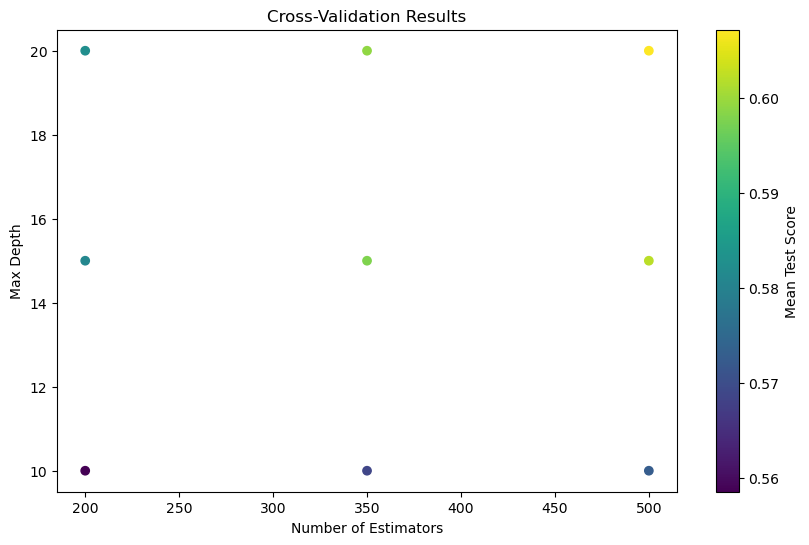

In [32]:
display_rand_forest_gridsearch_results(rand_forest_grid_search.cv_results_)

Based on these results we can again try to train a new model which is a bit simpler in hopes that it should generalize better and not just perfectly learn the training set. Let's try with the middle one in this case - 350 trees and max depth of 15. Let's look at the training and validation scores.

In [38]:
mlflow.end_run()
mlflow.start_run(run_name = "Random Forest 15 Deep")

In [43]:
rand_forest_15_deep = RandomForestClassifier(n_estimators=350, max_depth=15, n_jobs=-1)
mlflow.log_param("n_estimators", 350)
mlflow.log_param("max_depth", 15)
rand_forest_15_deep.fit(images_train, augmented_teeth_df_train["class"])

RandomForestClassifier(max_depth=15, n_estimators=350, n_jobs=-1)

In [46]:
rand_forest_15_deep_train_score = rand_forest_15_deep.score(images_train, augmented_teeth_df_train["class"])
rand_forest_15_deep_val_score = rand_forest_15_deep.score(images_val, augmented_teeth_df_val["class"])
rand_forest_15_deep_train_score, rand_forest_15_deep_val_score

(0.9942936765974388, 0.6121690664189503)

In [47]:
mlflow.log_metric("training accuracy", rand_forest_15_deep_train_score)
mlflow.log_metric("validation accuracy", rand_forest_15_deep_val_score)

Still here our model overfits a lot, but it is a bit better than the previous one. Let's try to simplify it even more so that we get minimal variance, while maintaining a good validation score. Another experiment we can setup is one with 10 depth and 200 estimators.

In [48]:
mlflow.end_run()
mlflow.start_run(run_name = "Random Forest 10 Deep")

<ActiveRun: >

In [49]:
rand_forest_10_deep = RandomForestClassifier(n_estimators=200, max_depth=10, n_jobs=-1)
mlflow.log_param("n_estimators", 200)
mlflow.log_param("max_depth", 10)
rand_forest_10_deep.fit(images_train, augmented_teeth_df_train["class"])

RandomForestClassifier(max_depth=10, n_estimators=200, n_jobs=-1)

In [50]:
rand_forest_10_deep_train_score = rand_forest_10_deep.score(images_train, augmented_teeth_df_train["class"])
rand_forest_10_deep_val_score = rand_forest_10_deep.score(images_val, augmented_teeth_df_val["class"])
rand_forest_10_deep_train_score, rand_forest_10_deep_val_score

(0.8640103510052418, 0.5699024616813748)

In [51]:
mlflow.log_metric("training accuracy", rand_forest_10_deep_train_score)
mlflow.log_metric("validation accuracy", rand_forest_10_deep_val_score)

And now we get some drop also in the preformace of the model on the validation set. Let's try to increase the depth a bit and also decrease the number of trees.

In [56]:
mlflow.end_run()
mlflow.start_run(run_name = "Random Forest 13 Deep with 150 estimators")

<ActiveRun: >

In [39]:
rand_forest_13_deep = RandomForestClassifier(n_estimators=150, max_depth=13, n_jobs=-1)
mlflow.log_param("n_estimators", 150)
mlflow.log_param("max_depth", 13)
rand_forest_13_deep.fit(images_train, augmented_teeth_df_train["class"])

rand_forest_13_deep_train_score = rand_forest_13_deep.score(images_train, augmented_teeth_df_train["class"])
rand_forest_13_deep_val_score = rand_forest_13_deep.score(images_val, augmented_teeth_df_val["class"])

mlflow.log_metric("training accuracy", rand_forest_13_deep_train_score)
mlflow.log_metric("validation accuracy", rand_forest_13_deep_val_score)

rand_forest_13_deep_train_score, rand_forest_13_deep_val_score

(0.9750514232632208, 0.5877070753986685)

So here we see that the model still manages to overfit, while also increasing its validation score. Maybe we can try to decrease the number of trees even more and see how that affects it.

In [60]:
mlflow.end_run()
mlflow.start_run(run_name = "Random Forest 15 Deep with 70 estimators")

<ActiveRun: >

In [61]:
rand_forest_15_deep_70 = RandomForestClassifier(n_estimators=70, max_depth=15, n_jobs=-1)
mlflow.log_param("n_estimators", 70)
mlflow.log_param("max_depth", 15)
rand_forest_15_deep_70.fit(images_train, augmented_teeth_df_train["class"])

rand_forest_15_deep_70_train_score = rand_forest_15_deep_70.score(images_train, augmented_teeth_df_train["class"])
rand_forest_15_deep_70_val_score = rand_forest_15_deep_70.score(images_val, augmented_teeth_df_val["class"])

mlflow.log_metric("training accuracy", rand_forest_15_deep_70_train_score)
mlflow.log_metric("validation accuracy", rand_forest_15_deep_70_val_score)

rand_forest_15_deep_70_train_score, rand_forest_15_deep_70_val_score

(0.9911751045053414, 0.5601486298188574)

In [67]:
mlflow.end_run()

So the results, which we got with the random and grid searches preformed the best on the validation set, but didn't manage to learn the features. They just overfitted the training data and the models either are too simple to learn anything or not capable enough. If we continue to simplify the model it will just become more and more biased and with a lower validation score and capacity. If we increase the capacity it just overfits more. So for now we will stick with our best classifier - `rand_forest_15_deep`

### 5. SVM

When it comes to classifying images, such as your tooth X-ray images, Support Vector Machines (SVMs) are a powerful and versatile choice. And as we can see above our task can benefit from an even more complex model due to the large number of features. SVMs are particularly effective in high-dimensional spaces, which is the case with our data. They can also be very versatile, because of their ability to use different kernels.

Let's start with a linear SVM and see how it preforms . Linear SVM is particularly effective when the number of features is large compared to the number of samples, which is not the case in our task after PCA reduction, but it is still worth a try. Here we will focus on optimizing the `C` parameter, which controls the amount of regularization applied on the model. We will start with the default `C` value as a baseline.

In [14]:
linear_svm_base = SVC(verbose=10, kernel="linear", C=1)
linear_svm_base.fit(images_train, augmented_teeth_df_train["class"])

[LibSVM]

SVC(C=1, kernel='linear', verbose=10)

In [68]:
linear_svm_base.score(images_train, augmented_teeth_df_train["class"]), linear_svm_base.score(images_val, augmented_teeth_df_val["class"])

(0.9144051489615819, 0.6186716209939619)

We can see that the model largely overfits the training data and has around 30% variance. But it still manages to achieve a good score on the validation set. Let's try to tune the `C` parameter and see if we can improve the results. We will decrease it in hopes of reducing the variance.

In [21]:
linear_svm_C = [0.1, 0.01, 0.001, 0.0001, 0.00001]
for C in linear_svm_C:
	linear_svm_reg = SVC(verbose=10, kernel="linear", C=C)
	mlflow.start_run(run_name = f"Linear SVM C={C}")
	mlflow.log_param("C", C)
	with joblib.parallel_backend('threading', n_jobs=-1):
		linear_svm_reg.fit(images_train, augmented_teeth_df_train["class"])
	train_score = linear_svm_reg.score(images_train, augmented_teeth_df_train["class"])
	val_score = linear_svm_reg.score(images_val, augmented_teeth_df_val["class"])
	mlflow.log_metric("training accuracy", train_score)
	mlflow.log_metric("validation accuracy", val_score)
	mlflow.end_run()
	print(f"Linear SVM C={C} train score: {train_score}, val score: {val_score}")

Linear SVM C=0.1 train score: 0.9029261495587553, val score: 0.6225421891933736
Linear SVM C=0.01 train score: 0.8738968880631677, val score: 0.6409660938225732
Linear SVM C=0.001 train score: 0.8140800212328313, val score: 0.6761108530732312
Linear SVM C=0.0001 train score: 0.7474951894366665, val score: 0.6895804304071838
Linear SVM C=0.00001 train score: 0.6620662198925088, val score: 0.6449914847499613


We can see that the model does in fact benefit from a smaller `C` value and finally manages to reduce the variance and achieve a better validation score. The best result we got was probably with `C=0.001`. This is because, while it still has some variance (of around 5-6%) it preforms a lot better on the validation set than the model with `C=0.0001`.

In [28]:
best_linear_svm = SVC(verbose=10, kernel="linear", C=0.0001)
best_linear_svm.fit(images_train, augmented_teeth_df_train["class"])

In [32]:
best_linear_svm_predictions = best_linear_svm.predict(images_val)
best_linear_svm_classification_report = classification_report(augmented_teeth_df_val["class"], best_linear_svm_predictions, output_dict=True)
print(classification_report(augmented_teeth_df_val["class"], best_linear_svm_predictions))

              precision    recall  f1-score   support

           1       0.55      0.66      0.60       189
          10       0.63      0.75      0.68       206
          11       0.62      0.68      0.65       211
          12       0.65      0.62      0.64       196
          13       0.55      0.53      0.54       189
          14       0.68      0.71      0.70       189
          15       0.60      0.64      0.62       193
          16       0.62      0.62      0.62       189
          17       0.58      0.68      0.63       189
          18       0.68      0.71      0.70       189
          19       0.78      0.65      0.71       189
           2       0.67      0.71      0.69       191
          20       0.64      0.70      0.67       201
          21       0.71      0.71      0.71       209
          22       0.72      0.78      0.75       227
          23       0.65      0.67      0.66       224
          24       0.61      0.61      0.61       224
          25       0.60    

We can now try to optimize a Kernel SVM to see if it can achieve better results than the linear one. It's main benefits include:
- Handling Non-linearity: If the data is not linearly separable, which might be the case given the complexity of medical images, kernel SVM can map the inputs into a higher-dimensional space where a linear separation is possible.
- Flexibility: Different kernels (like RBF, polynomial, sigmoid) can model complex relationships.

Here we will focus on the RBF kernel and try to optimize it's `C` and `gamma` hyperparameters. We will start with the default values as a baseline just to get a feel for it and train the model on a subset of the data, because it can be very computationally expensive.

- C (Regularization Parameter): As with Linear SVM, it controls the trade-off between smooth decision boundary and classifying training points correctly.
- Gamma: It defines how far the influence of a single training example reaches. Low values mean ‘far’ and high values mean ‘close’. It can be seen as the inverse of the radius of influence of samples selected by the model as support vectors.

In [33]:
# Perform stratified split
X_train_sample, _, y_train_sample, _ = train_test_split(images_train, augmented_teeth_df_train["class"], train_size=10000, stratify=augmented_teeth_df_train["class"])

kernel_svm = SVC(verbose=10, kernel="rbf", C=1, gamma="scale")
kernel_svm.fit(X_train_sample, y_train_sample)

[LibSVM]

SVC(C=1, verbose=10)

In [34]:
kernel_svm.score(X_train_sample, y_train_sample), kernel_svm.score(images_val, augmented_teeth_df_val["class"])

(0.7958, 0.616039634618362)

As we can see the base model has a relatively moderate variance compared to earlier models, which we looked at. We can try the models from now on with a bit less regularization: `C=10`, just to see how capable they are. But the variance is still is around 20%. It can benefit from some optimization. First we'll start by optimizing the `gamma` parameter, as it is more important than `C` for the RBF kernel. The default `scale` value is defined as $1 / (n\_features * var(X))$. This works out to be:

In [ ]:
1 / (250 * images_train.var())

2.006063747611926e-05

Based on this we will do experiments with the following values for `gamma`: $1.0*10^{-1}, 1.0*10^{-2}, 1.0*10^{-3}, 1.0*10^{-4}, 7.0*10^{-5}, 1.0*10^{-6}$.

In [36]:
kernel_svm_gamma = [1.00e-01, 1.00e-02, 1.00e-03, 1.00e-04, 7.00e-05, 1.00e-06]

for gamma in kernel_svm_gamma:
	mlflow.start_run(run_name = f"Kernel SVM gamma={gamma}")
	mlflow.log_param("gamma", gamma)
	mlflow.log_param("C", 10)
	kernel_svm_test = SVC(verbose=10, kernel="rbf", C=10, gamma=gamma)
	with joblib.parallel_backend('threading', n_jobs=-1):
		kernel_svm_test.fit(X_train_sample, y_train_sample)
	train_score = kernel_svm_test.score(X_train_sample, y_train_sample)
	val_score = kernel_svm_test.score(images_val, augmented_teeth_df_val["class"])
	mlflow.log_metric("training accuracy", train_score)
	mlflow.log_metric("validation accuracy", val_score)
	mlflow.end_run()
	print(f"Kernel SVM gamma={gamma} train score: {train_score}, val score: {val_score}")

Kernel SVM gamma=0.1 train score: 1.0, val score: 0.036228518346493266
Kernel SVM gamma=0.01 train score: 1.0, val score: 0.036073695618516796
Kernel SVM gamma=0.001 train score: 1.0, val score: 0.0730763276048924
Kernel SVM gamma=0.0001 train score: 0.9999668237011479, val score: 0.6339990710636322
Kernel SVM gamma=7e-05 train score: 0.999668237011479, val score: 0.6737885121535842
Kernel SVM gamma=1e-06 train score: 0.7096742087452724, val score: 0.6778139030809723


We can see that the best model is the one with the smallest gamma. This is because kernel SVMs are complex as is our data and they benefit from a lot of regularization. The model has a relatively small variance, but still some bias. The difference in training score between the last two models is substantial, which means that most probably decreasing `gamma` even more will result in our model severely underfitting. Let's try to optimize the `C` parameter now.

In [42]:
optimal_gamma = 1e-06
kernel_svm_C = [0.1, 1, 100, 1000]
optimal_ksvms = []

for C in kernel_svm_C:
	mlflow.start_run(run_name = f"Kernel SVM gamma={optimal_gamma} C={C}")
	mlflow.log_param("gamma", optimal_gamma)
	mlflow.log_param("C", C)
	ksvm = SVC(verbose=10, kernel="rbf", C=C, gamma=optimal_gamma)
	with joblib.parallel_backend('threading', n_jobs=-1):
		ksvm.fit(images_train, augmented_teeth_df_train["class"])
	train_score = ksvm.score(images_train, augmented_teeth_df_train["class"])
	val_score = ksvm.score(images_val, augmented_teeth_df_val["class"])
	mlflow.log_metric("training accuracy", train_score)
	mlflow.log_metric("validation accuracy", val_score)
	mlflow.end_run()
	optimal_ksvms.append(ksvm)
	print(f"Kernel SVM with gamma={optimal_gamma} and C={C} train score: {train_score}, val score: {val_score}\n")

[LibSVM]Kernel SVM with gamma=1e-06 and C=0.1 train score: 0.34320881162497513, val score: 0.3324043969654745
[LibSVM]Kernel SVM with gamma=1e-06 and C=1 train score: 0.5663525977042001, val score: 0.5564328843474222
[LibSVM]Kernel SVM with gamma=1e-06 and C=100 train score: 0.8241987923827218, val score: 0.7160551168911596
[LibSVM]Kernel SVM with gamma=1e-06 and C=1000 train score: 0.9544857769309834, val score: 0.7027098927338991



Here it appears that `C=100` appears to be the sweet spot for our dataset, offering a good balance between bias and variance (complexity and generalization). Based on both experiments we can conclude that the RBF kernel SVM is a good choice for our task. It is more complex and manages to better capture the relationships in our data. But even than it has a relatively high variance (of around 10%) compared to the Linear SVM, which had only around 5%. Let's further analyze the results of the best kernel model.

In [46]:
best_kernel_svm = optimal_ksvms[2]
best_kernel_svm_predictions = best_kernel_svm.predict(images_val)
best_kernel_svm_classification_report = classification_report(augmented_teeth_df_val["class"], best_kernel_svm_predictions, output_dict=True)
print(classification_report(augmented_teeth_df_val["class"], best_kernel_svm_predictions))

              precision    recall  f1-score   support

           1       0.62      0.71      0.66       189
          10       0.69      0.76      0.72       206
          11       0.66      0.73      0.69       211
          12       0.68      0.61      0.64       196
          13       0.60      0.56      0.58       189
          14       0.74      0.75      0.75       189
          15       0.65      0.72      0.68       193
          16       0.67      0.69      0.68       189
          17       0.66      0.74      0.70       189
          18       0.74      0.75      0.75       189
          19       0.86      0.67      0.76       189
           2       0.72      0.76      0.74       191
          20       0.69      0.76      0.72       201
          21       0.73      0.71      0.72       209
          22       0.75      0.79      0.77       227
          23       0.67      0.71      0.69       224
          24       0.70      0.66      0.68       224
          25       0.60    

Looking at its classification report we can see that the model preforms somewhat consistently across all classes. There is a general balance between precision and recall for most classes, as indicated by similar F1-scores. This suggests that the model is not biased towards either avoiding false positives (precision) or maximizing true positives (recall). Some classes have slightly lower scores like 12, 13, 25, 26. The first pair of classes - 12 and 13 are premolars, which are more common to have moved or be missing in the mouth. This is potentially why the model has a harder time classifying them. The second pair - 25 and 26 are incisors, which makes their low F1-score interesting. Let's look at the confusion matrix for the model.

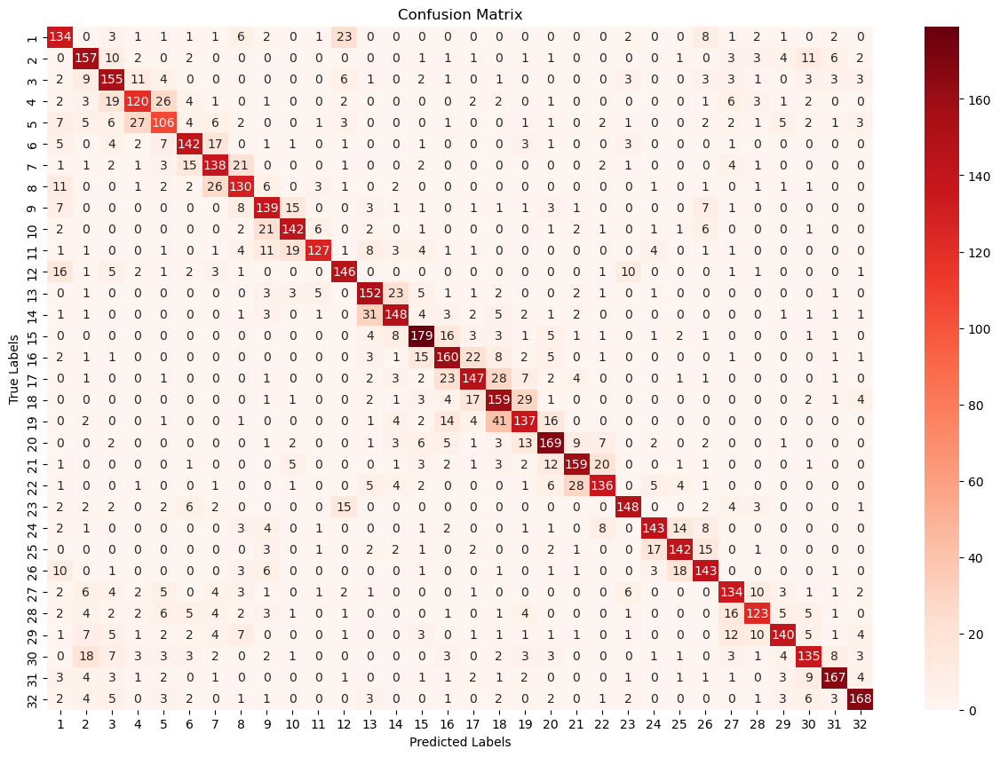

In [50]:
display_confustion_matrix(augmented_teeth_df_val["class"].unique(), augmented_teeth_df_val["class"], best_kernel_svm_predictions)

As expected the most confusion is observed between teeth neighbors. For example we can see that tooth number 18 and 19 get confused the most, as do the other teeth in the left part of the mouth - 15, 16, 17, 18. This is interesting, because the last teeth in the left part don't get confused nearly as much - 1, 2 and 31, 32. It suggests that the features of these teeth are captured more distinctly by the model, or that the data for these teeth has less overlap in the feature space. Across the matrix, the diagonal, which represents correct classifications, is dominant, indicating that the model is generally effective in classifying the teeth correctly. However, the off-diagonal numbers in the same row or column point to the specific cases of confusion.

### 6. Final Model Selection
Based on all of the models, which we looked at above and the experiments we did, we can make several observations that would justify choosing the kernel SVM with `gamma=1e-06` and `C=100` as our final model:
- **Balance between training and validation accuracy**: The model has a training accuracy of 0.824 and a validation accuracy of 0.716. The balance between these two accuracies is indicative of a model that has learned well but has not overfitted as much as some of the other models we tried.
- When comparing to other models with similar gamma values, we can see that as the C parameter increases, the training accuracy tends to increase as well, which is expected because a higher C value places a larger penalty on misclassified data points, making the decision boundary stricter. However, the validation accuracy does not always increase with the training accuracy, which suggests overfitting. The selected model does not have the highest training accuracy, but it does have one of the highest validation accuracies, suggesting a better generalization to unseen data.
- **Overfitting avoidance**: Model with very high training accuracies (close to or equal to 1.0) tend to have lower validation accuracies, indicating overfitting. The chosen model does not exhibit such a high discrepancy, which indicates a more robust model that is less likely to have overfitted.
- **Complexity and Performance**: Higher C values tend to give the model more flexibility to fit the training data, potentially leading to higher accuracy but also a risk of overfitting. The C=100 parameter seems to provide a good trade-off between model complexity and the ability to generalize, as shown by the validation score.

In conclusion, the kernel SVM with gamma=1e-06 and C=100 is chosen as the best model due to its balance between accuracy and generalization, indicating a well-fitting model that is neither too simple (underfitted) nor too complex (overfitted). This model shows a good compromise between being flexible enough to capture the underlying patterns in the data and being constrained enough to maintain good performance on unseen data.


## Model evaluation
Now it is time for us to evaluate our final model on the test set, which we have not used for training or validation.

In [59]:
best_kernel_svm_test_predictions = best_kernel_svm.predict(images_test)

In [61]:
accuracy_score(augmented_teeth_df_test["class"], best_kernel_svm_test_predictions)

0.7103715170278638

As expected we get a similar accuracy score to the one on the validation set. This is a good sign, because it means that our model is generalizing well to unseen data. Let's look at the classification report.

In [62]:
best_kernel_svm_test_classification_report = classification_report(augmented_teeth_df_test["class"], best_kernel_svm_test_predictions, output_dict=True)
print(classification_report(augmented_teeth_df_test["class"], best_kernel_svm_test_predictions))

              precision    recall  f1-score   support

           1       0.61      0.69      0.65       189
          10       0.68      0.71      0.70       206
          11       0.66      0.70      0.68       212
          12       0.71      0.63      0.67       196
          13       0.61      0.58      0.59       189
          14       0.78      0.70      0.74       189
          15       0.64      0.69      0.66       192
          16       0.58      0.58      0.58       189
          17       0.66      0.69      0.68       189
          18       0.76      0.78      0.77       189
          19       0.84      0.77      0.80       189
           2       0.68      0.76      0.72       190
          20       0.75      0.77      0.76       201
          21       0.75      0.74      0.74       209
          22       0.73      0.80      0.76       228
          23       0.67      0.67      0.67       224
          24       0.64      0.70      0.67       224
          25       0.61    

Here again we can see that the class with the lowest F1-score is 13, which is a premolar. This is something which should probably be investigated in the future, but in general the model preforms somewhat consistently across all classes as indicated by the similar F1-scores. Let's look at the confusion matrix.

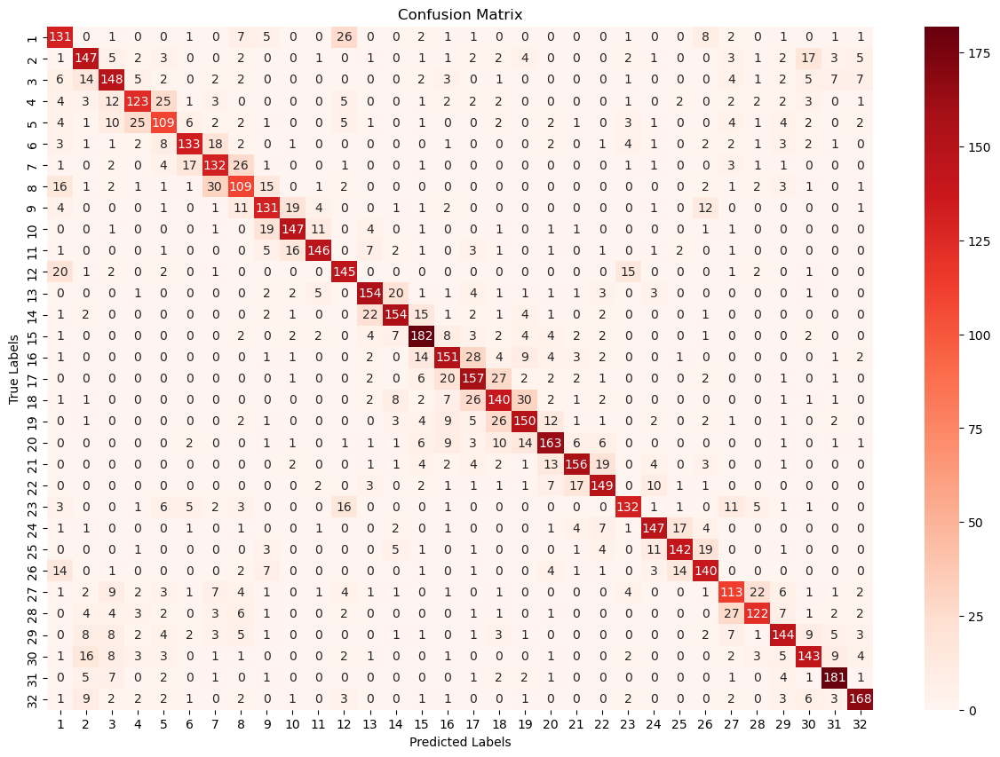

In [63]:
display_confustion_matrix(augmented_teeth_df_test["class"].unique(), augmented_teeth_df_test["class"], best_kernel_svm_test_predictions)

Again here we observe a strong diagonal, indicating that the model is generally effective in classifying the teeth correctly. However, the off-diagonal numbers in the same row or column point to the specific cases of confusion. As expected the most confusion is observed between teeth neighbors. More specifically teeth in the left part of the mouth again seem to confuse the model. This indicates that the data for this specific region should be investigated for some sort of anomalies which could be sabotaging our model.

## Conclusion
In this project, we set out to tackle the challenge of interpreting panoramic dental X-rays using machine learning. Our goal was to develop a robust system capable of autonomously identifying and classifying individual teeth, thereby augmenting the efficiency of dental examinations and facilitating the integration with dental information systems. Mainly this model, which we developed can be later used as a part of a bigger system, which will be able to identify and classify teeth in a panoramic X-ray image. 

After a thorough exploration of various machine learning models, we identified the kernel SVM with gamma=1e-06 and C=100 as the most effective model. This model demonstrated a commendable balance between training accuracy and generalization to unseen data.

The selection of this model was based on comprehensive testing and comparison with other candidate models. It became clear that while higher values of the C parameter increased training accuracy, they did not always correlate with improved validation accuracy, often suggesting a tendency to overfit. Our chosen model, however, managed to avoid this pitfall, showing robustness and reliability.

Furthermore, the model's complexity is finely tuned to capture the underlying patterns in the data. It provides enough flexibility to accurately fit the training data while maintaining the necessary constraints to perform well on validation data, an essential characteristic for real-world applications.

Additional research is probably required. The model's performance on some specific classes can be improved with some better feature extraction. Another area worth exploring is Ensemble Learning, convolutions and DNN. Without them it is hard to achieve better results and we have probably reached the limit of what we can do with our data.

## References:
 - https://www.mdpi.com/2077-0383/10/8/1635
 - https://www.analyticsvidhya.com/blog/2022/01/image-classification-using-machine-learning/
 - https://ieeexplore.ieee.org/stamp/stamp.jsp?arnumber=9557804